# Dispa-SET Post-processing

This Notebook illustrates how Dispa-SET simulation results can be loaded, analysed and plotted. It uses the functions provided within the PostProcessing.py file.

### Load DispaSET and the required libraries:

In [1]:
%matplotlib inline
from __future__ import division
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import *
import seaborn as sns
import matplotlib.dates as mdates
#plt.style.use('seaborn-colorblind')
import pickle
import sys
sys.path.append("..")
import DispaSET as ds

In [2]:
%matplotlib notebook

In [3]:
%matplotlib ipympl

In [4]:
%matplotlib widget

In [3]:
from DispaSET.postprocessing import postprocessing as post
reload(post)

<module 'DispaSET.postprocessing.postprocessing' from '../DispaSET/postprocessing/postprocessing.pyc'>

In [4]:
pd.options.display.max_rows = None   #default 60 (None)
pd.options.display.max_columns = None   #default 60 (None)
np.set_printoptions(threshold=1000)   #default 1000 (np.inf)

### Define the path to the simulation environment

The folder must contain the simulatin inputs (written by the pre-processing tool) as wall as the simulation results (Results.gdx).

In [5]:
path_int = '../Simulations/simulation_GCC_sub_int5'                      #With Trade international prices
path_int_isolated = '../Simulations/simulation_GCC_int_isolated4'    #Without Trade international prices
path_sub = '../Simulations/simulation_GCC_sub4'                      #With Trade subsidized prices
path_sub_isolated = '../Simulations/simulation_GCC_sub_isolated4'    #Without Trade subsidized prices

In [5]:
path1 = '../Simulations/Test3'
path2 = '../Simulations/neww_sub'

### Load the inputs and the results of the simulation

This can be computationally intensive for large simulations:

In [6]:
#This function reads the simulation environment folder once it has been solved and loads
# the input variables together with the results.
inputs_int,results_int = ds.get_sim_results(path=path_int,cache=True)
inputs_int_isolated,results_int_isolated = ds.get_sim_results(path=path_int_isolated,cache=True)
inputs_sub,results_sub = ds.get_sim_results(path=path_sub,cache=True)
inputs_sub_isolated,results_sub_isolated = ds.get_sim_results(path=path_sub_isolated,cache=True)

[WARNING ] (get_sim_results): The provided path for GAMS ( ) does not exist. Trying to locate...
[INFO    ] (get_gams_path): Detected /Applications//GAMS26.1/sysdir as GAMS path on this computer
[CRITICAL] (get_sim_results): Some simulation errors were encountered. Some results could not be computed, for example at 
                             time 2016-01-22 00:00:00, with the error message: "Error achieved, No solution attained". 
                             The complete list is available in results["errors"] 
                             The optimization might be debugged by activating the Debug flag in the GAMS simulation file and running it
/anaconda2/lib/python2.7/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  sel

IOError: [Errno 2] No such file or directory: '../Simulations/simulation_GCC_sub4/Inputs.p'

In [6]:
inputs1,results1 = ds.get_sim_results(path=path1,cache=True)
inputs2,results2 = ds.get_sim_results(path=path2,cache=True)

[WARNING ] (get_sim_results): The provided path for GAMS (/Applications//GAMS26.1/sysdir ) does not exist. Trying to locate...
[INFO    ] (get_gams_path): Detected /Applications//GAMS26.1/sysdir as GAMS path on this computer
[WARNING ] (get_sim_results): The provided path for GAMS ( ) does not exist. Trying to locate...
[INFO    ] (get_gams_path): Detected /Applications//GAMS26.1/sysdir as GAMS path on this computer


### Format the inputs as a dictionary of dataframes:

In [7]:
#Function that converts the dispaset data format into a dictionary of dataframes
datain_int = ds.ds_to_df(inputs_int)
datain_int_isolated = ds.ds_to_df(inputs_int_isolated)
datain_sub = ds.ds_to_df(inputs_sub)
datain_sub_isolated = ds.ds_to_df(inputs_sub_isolated)

NameError: name 'inputs_sub' is not defined

In [7]:
#Function that converts the dispaset data format into a dictionary of dataframes
datain1 = ds.ds_to_df(inputs1)
datain2 = ds.ds_to_df(inputs2)

### Select the time period for plotting

In [8]:
rng = pd.DatetimeIndex(start='2016-01-01 00:00:00',end='2016-12-29 23:00:00',freq='h')
rng1 = pd.DatetimeIndex(start='2016-01-01 00:00:00',end='2016-01-31 23:00:00',freq='h')
rng2 = pd.DatetimeIndex(start='2016-02-01 00:00:00',end='2016-02-29 23:00:00',freq='h')
rng3 = pd.DatetimeIndex(start='2016-03-01 00:00:00',end='2016-03-31 23:00:00',freq='h')
rng4 = pd.DatetimeIndex(start='2016-04-01 00:00:00',end='2016-04-30 23:00:00',freq='h')
rng5 = pd.DatetimeIndex(start='2016-05-01 00:00:00',end='2016-05-31 23:00:00',freq='h')
rng6 = pd.DatetimeIndex(start='2016-06-01 00:00:00',end='2016-06-30 23:00:00',freq='h')
rng7 = pd.DatetimeIndex(start='2016-07-01 00:00:00',end='2016-07-31 23:00:00',freq='h')
rng8 = pd.DatetimeIndex(start='2016-08-01 00:00:00',end='2016-08-31 23:00:00',freq='h')
rng9 = pd.DatetimeIndex(start='2016-09-01 00:00:00',end='2016-09-30 23:00:00',freq='h')
rng10 = pd.DatetimeIndex(start='2016-10-01 00:00:00',end='2016-10-31 23:00:00',freq='h')
rng11 = pd.DatetimeIndex(start='2016-11-01 00:00:00',end='2016-11-30 23:00:00',freq='h')
rng12 = pd.DatetimeIndex(start='2016-12-01 00:00:00',end='2016-12-31 23:00:00',freq='h')
rngsummer = pd.DatetimeIndex(start='2016-04-01 00:00:00',end='2016-11-30 23:00:00',freq='h')
rngwinter1 = pd.DatetimeIndex(start='2016-12-01 00:00:00',end='2016-12-31 23:00:00',freq='h')
rngwinter2 = pd.DatetimeIndex(start='2016-01-01 00:00:00',end='2016-03-31 23:00:00',freq='h')
rngwinter = rngwinter1.append(rngwinter2)

In [9]:
rng = pd.DatetimeIndex(start='2016-07-11 00:00:00',end='2016-07-17 23:00:00',freq='h')

[WARNING ] (plot_dispatch): Plotting range is not properly defined, considering the first simulated week


<IPython.core.display.Javascript object>


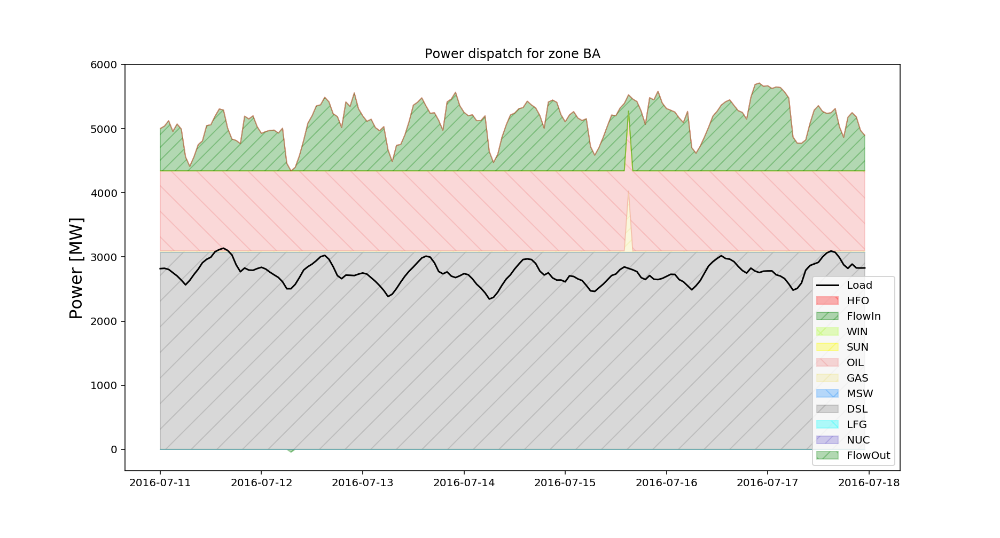

In [9]:
plotdata = post.get_plot_data(inputs1, results1, 'SA_SOA')
demand = post.get_demand(inputs1, 'BA')
post.plot_dispatch(demand, plotdata, level=None, rng=rngsummer)

#plt.savefig('../Simulations/simulation_all_OneTest - MidJuly - Trade - Sub/Plots/SA_SOA.png',dpi=300,tight_layout='tight_box')


[WARNING ] (plot_dispatch): Plotting range is not properly defined, considering the first simulated week


<IPython.core.display.Javascript object>


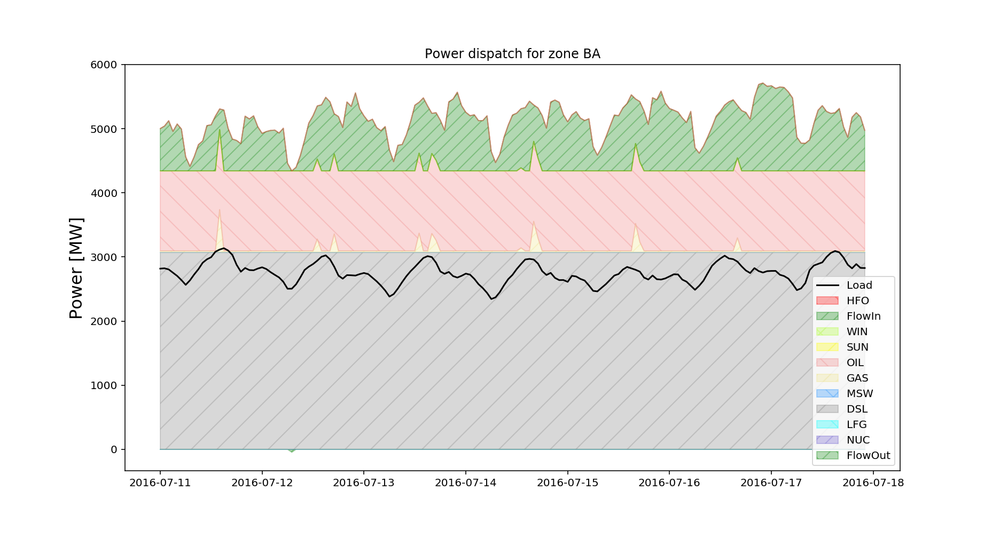

In [10]:
plotdata = post.get_plot_data(inputs2, results2, 'SA_SOA')
demand = post.get_demand(inputs2, 'BA')
post.plot_dispatch(demand, plotdata, level=None, rng=rngsummer)

#plt.savefig('../Simulations/simulation_all_OneTest - MidJuly - Trade - Sub/Plots/SA_SOA.png',dpi=300,tight_layout='tight_box')



### -- General functions

In [20]:
#Reads the DispaSET results and provides useful general information to stdout
r_1 = ds.get_result_analysis(inputs1,results1)


Average electricity cost : 6.515360308032526 EUR/MWh

Aggregated statistics for the considered area:
Total consumption:19.193862733999996 TWh
Peak load:110082.81599999999 MW
Net importations:0.0 TWh

Country-Specific values (in TWh or in MW):
             Demand   PeakLoad  NetImports  LoadShedding  Curtailment
SA_EOA     3.283571  18369.977    1.179947           NaN          NaN
SA_RIYADH  2.427258  14404.277   -1.252971           NaN          NaN
SA_QASSIM  0.455977   2695.942    0.450217           NaN          NaN
SA_HAIL    0.177858   1063.890    0.060428           NaN          NaN
SA_WOA     2.642770  15860.248   -0.413883           NaN          NaN
SA_SOA     0.983416   5711.107    0.148896           NaN          NaN
SA_NWOA    0.202484   1275.808    0.000000           NaN          NaN
SA_NEOA    0.231110   1403.988    0.151847           NaN          NaN
OM         0.968890   6069.440    0.076800           NaN          NaN
KW         2.222898  13295.540   -0.297600           NaN

In [21]:
#Reads the DispaSET results and provides useful general information to stdout
r_2 = ds.get_result_analysis(inputs2,results2)


Average electricity cost : 6.528231330342864 EUR/MWh

Aggregated statistics for the considered area:
Total consumption:16.855670612999997 TWh
Peak load:110082.816 MW
Net importations:0.0 TWh

Country-Specific values (in TWh or in MW):
             Demand   PeakLoad  NetImports  LoadShedding  Curtailment
SA_EOA     2.892246  18369.977    1.047090           NaN          NaN
SA_RIYADH  2.153522  14404.277   -1.088321           NaN          NaN
SA_QASSIM  0.404388   2695.942    0.399348           NaN          NaN
SA_HAIL    0.157939   1063.890    0.046439           NaN          NaN
SA_WOA     2.341515  15860.248   -0.383612           NaN          NaN
SA_SOA     0.862762   5711.107    0.130100           NaN          NaN
SA_NWOA    0.175769   1241.752    0.000000           NaN          NaN
SA_NEOA    0.205584   1403.988    0.132876           NaN          NaN
OM         0.851078   6069.440    0.067200           NaN          NaN
KW         1.935606  13295.540   -0.260400           NaN        

In [11]:
#Reads the DispaSET results and provides useful general information to stdout
r_int = ds.get_result_analysis(inputs_int,results_int)


Average electricity cost : 6.970272613199142 EUR/MWh

Aggregated statistics for the considered area:
Total consumption:669.9406842450005 TWh
Peak load:116859.93399999998 MW
Net importations:0.0 TWh

Country-Specific values (in TWh or in MW):
               Demand   PeakLoad    NetImports  LoadShedding  Curtailment
SA_EOA     127.079527  19870.000 -1.175043e-02           NaN          NaN
SA_RIYADH   81.918741  16102.450 -3.285484e+00           NaN          NaN
SA_QASSIM   15.467767   3012.087  1.960761e+00           NaN          NaN
SA_HAIL      5.936319   1190.738  3.111059e-01           NaN          NaN
SA_WOA      99.005586  18075.000  5.749961e-02           NaN          NaN
SA_SOA      36.428948   5855.000  1.924969e-02           NaN          NaN
SA_NWOA      6.389343   1400.000  0.000000e+00           NaN          NaN
SA_NEOA      7.543903   1575.000  1.976438e+00           NaN          NaN
OM          31.189165   6069.440  3.215598e-01           NaN          NaN
KW          70.45

In [115]:
#Reads the DispaSET results and provides useful general information to stdout
r_sub = ds.get_result_analysis(inputs_sub,results_sub)


Average electricity cost : 6.491710110451265 EUR/MWh

Aggregated statistics for the considered area:
Total consumption:669.9406842450005 TWh
Peak load:116859.934 MW
Net importations:0.0 TWh

Country-Specific values (in TWh or in MW):
               Demand   PeakLoad  NetImports  LoadShedding  Curtailment
SA_EOA     127.079527  19870.000   30.758789           NaN          NaN
SA_RIYADH   81.918741  16102.450  -32.976615           NaN          NaN
SA_QASSIM   15.467767   3012.087   15.175648           NaN          NaN
SA_HAIL      5.936319   1190.738    3.423531           NaN          NaN
SA_WOA      99.005586  18075.000  -15.399119           NaN          NaN
SA_SOA      36.428948   5855.000    7.494448           NaN          NaN
SA_NWOA      6.389343   1400.000    0.000000           NaN          NaN
SA_NEOA      7.543903   1575.000    5.796790           NaN          NaN
OM          31.189165   6069.440    3.513600           NaN          NaN
KW          70.451560  13295.540  -12.486424 

In [116]:
#Reads the DispaSET results and provides useful general information to stdout
r_int_isolated = ds.get_result_analysis(inputs_int_isolated,results_int_isolated)


Average electricity cost : 81.1284319035738 EUR/MWh

Aggregated statistics for the considered area:
Total consumption:669.9406842450005 TWh
Peak load:116859.934 MW
Net importations:0.0 TWh

Country-Specific values (in TWh or in MW):
               Demand   PeakLoad  NetImports  LoadShedding  Curtailment
SA_EOA     127.079527  19870.000  -17.076078           NaN          NaN
SA_RIYADH   81.918741  16102.450  -11.676985           NaN          NaN
SA_QASSIM   15.467767   3012.087   15.099721           NaN          NaN
SA_HAIL      5.936319   1190.738    3.301148           NaN          NaN
SA_WOA      99.005586  18075.000  -10.035642           NaN          NaN
SA_SOA      36.428948   5855.000   14.383853           NaN          NaN
SA_NWOA      6.389343   1400.000    0.000000           NaN          NaN
SA_NEOA      7.543903   1575.000    6.003984           NaN          NaN
OM          31.189165   6069.440    0.000000           NaN          NaN
KW          70.451560  13295.540    0.000000  

In [117]:
#Reads the DispaSET results and provides useful general information to stdout
r_sub_isolated = ds.get_result_analysis(inputs_sub_isolated,results_sub_isolated)


Average electricity cost : 6.782340286147272 EUR/MWh

Aggregated statistics for the considered area:
Total consumption:669.9406842450005 TWh
Peak load:116859.934 MW
Net importations:0.0 TWh

Country-Specific values (in TWh or in MW):
               Demand   PeakLoad  NetImports  LoadShedding  Curtailment
SA_EOA     127.079527  19870.000   29.341056           NaN          NaN
SA_RIYADH   81.918741  16102.450  -38.906962           NaN          NaN
SA_QASSIM   15.467767   3012.087   15.190333           NaN          NaN
SA_HAIL      5.936319   1190.738    3.149958           NaN          NaN
SA_WOA      99.005586  18075.000  -19.809884           NaN          NaN
SA_SOA      36.428948   5855.000    5.214700           NaN          NaN
SA_NWOA      6.389343   1400.000    0.000000           NaN          NaN
SA_NEOA      7.543903   1575.000    5.820800           NaN          NaN
OM          31.189165   6069.440    0.000000           NaN          NaN
KW          70.451560  13295.540    0.000000 

In [118]:
#Total output system cost in Millions $ 
(results_int['TotalNodeOperationCost'].sum())/(1000000)

BA             430.244193
KW            5009.933528
OM            2133.654442
QA            3472.171459
SA_EOA       11784.264087
SA_HAIL        601.510673
SA_NEOA        511.531741
SA_NWOA       1774.711205
SA_QASSIM       89.157882
SA_RIYADH     7233.469880
SA_SOA        2872.212221
SA_WOA       15365.592425
UAE           8166.365894
dtype: float64

In [119]:
#Total output system cost in Millions $ 
(results_sub['TotalNodeOperationCost'].sum())/(1000000)

BA           104.024042
KW           624.781009
OM           494.735687
QA           287.593167
SA_EOA       632.412986
SA_HAIL       22.009522
SA_NEOA      112.392588
SA_NWOA      225.175267
SA_QASSIM      2.729782
SA_RIYADH    784.383257
SA_SOA       229.838809
SA_WOA       573.619804
UAE          718.080891
dtype: float64

In [120]:
#Total output system cost in Millions $ 
KSA_Cost_int = (results_int['TotalNodeOperationCost'].sum()['SA_EOA']+results_int['TotalNodeOperationCost'].sum()['SA_HAIL']+results_int['TotalNodeOperationCost'].sum()['SA_NEOA']+results_int['TotalNodeOperationCost'].sum()['SA_NWOA']+results_int['TotalNodeOperationCost'].sum()['SA_QASSIM']+results_int['TotalNodeOperationCost'].sum()['SA_RIYADH']+results_int['TotalNodeOperationCost'].sum()['SA_SOA']+results_int['TotalNodeOperationCost'].sum()['SA_WOA'])
KSA_Cost_int/(1000000)

40232.450114534535

In [121]:
#Total output system cost in Millions $ 
KSA_Cost_sub = (results_int['TotalNodeOperationCost'].sum()['SA_EOA']+results_sub['TotalNodeOperationCost'].sum()['SA_HAIL']+results_sub['TotalNodeOperationCost'].sum()['SA_NEOA']+results_sub['TotalNodeOperationCost'].sum()['SA_NWOA']+results_sub['TotalNodeOperationCost'].sum()['SA_QASSIM']+results_sub['TotalNodeOperationCost'].sum()['SA_RIYADH']+results_sub['TotalNodeOperationCost'].sum()['SA_SOA']+results_sub['TotalNodeOperationCost'].sum()['SA_WOA'])
KSA_Cost_sub/(1000000)

13734.413115409536

In [122]:
#Total output system cost in Millions $ 
SystemCost_int2 = results_int['TotalNodeOperationCost'].copy() #/(1000000)
SystemCost_int2['KSA'] = SystemCost_int2['SA_EOA']+SystemCost_int2['SA_HAIL']+SystemCost_int2['SA_NEOA']+SystemCost_int2['SA_NWOA']+SystemCost_int2['SA_QASSIM']+SystemCost_int2['SA_RIYADH']+SystemCost_int2['SA_SOA']+SystemCost_int2['SA_WOA']
SystemCost_int2.sum()/(1000000)


BA             430.244193
KW            5009.933528
OM            2133.654442
QA            3472.171459
SA_EOA       11784.264087
SA_HAIL        601.510673
SA_NEOA        511.531741
SA_NWOA       1774.711205
SA_QASSIM       89.157882
SA_RIYADH     7233.469880
SA_SOA        2872.212221
SA_WOA       15365.592425
UAE           8166.365894
KSA          40232.450115
dtype: float64

In [123]:
A = pd.Series(((results_int['TotalNodeOperationCost'].sum())/(1000000)).drop(['BA','KW','OM','QA','UAE']).sum())
A.name = 'KSA'
SystemCost_int = pd.DataFrame((results_int['TotalNodeOperationCost'].sum())/(1000000))
SystemCost_int = SystemCost_int.append(A, ignore_index=False)
SystemCost_int.columns = ['SystemCost']
SystemCost_int

,SystemCost
BA,430.244193
KW,5009.933528
OM,2133.654442
QA,3472.171459
SA_EOA,11784.264087
SA_HAIL,601.510673
SA_NEOA,511.531741
SA_NWOA,1774.711205
SA_QASSIM,89.157882
SA_RIYADH,7233.469880


In [34]:
#Total output system cost in Millions $ 
SystemCost_sub2 = results_sub['TotalNodeOperationCost'].copy() #/(1000000)
SystemCost_sub2['KSA'] = SystemCost_sub2['SA_EOA']+SystemCost_sub2['SA_HAIL']+SystemCost_sub2['SA_NEOA']+SystemCost_sub2['SA_NWOA']+SystemCost_sub2['SA_QASSIM']+SystemCost_sub2['SA_RIYADH']+SystemCost_sub2['SA_SOA']+SystemCost_sub2['SA_WOA']
SystemCost_sub2.sum()/(1000000)


BA            4.304024
KW           16.588054
OM           14.701122
QA            6.878703
SA_EOA       12.129599
SA_HAIL       0.983457
SA_NEOA       0.663145
SA_NWOA       1.448371
SA_QASSIM     0.063794
SA_RIYADH    23.930264
SA_SOA        5.872736
SA_WOA       15.677723
UAE          18.504132
KSA          60.769089
dtype: float64

In [87]:
A = pd.Series(((results_sub['TotalNodeOperationCost'].sum())/(1000000)).drop(['BA','KW','OM','QA','UAE']).sum())
A.name = 'KSA'
SystemCost_sub = pd.DataFrame((results_sub['TotalNodeOperationCost'].sum())/(1000000))
SystemCost_sub = SystemCost_sub.append(A, ignore_index=False)
SystemCost_sub.columns = ['SystemCost']
SystemCost_sub

,SystemCost
BA,4.304024
KW,16.588054
OM,14.701122
QA,6.878703
SA_EOA,12.129599
SA_HAIL,0.983457
SA_NEOA,0.663145
SA_NWOA,1.448371
SA_QASSIM,0.063794
SA_RIYADH,23.930264


<IPython.core.display.Javascript object>


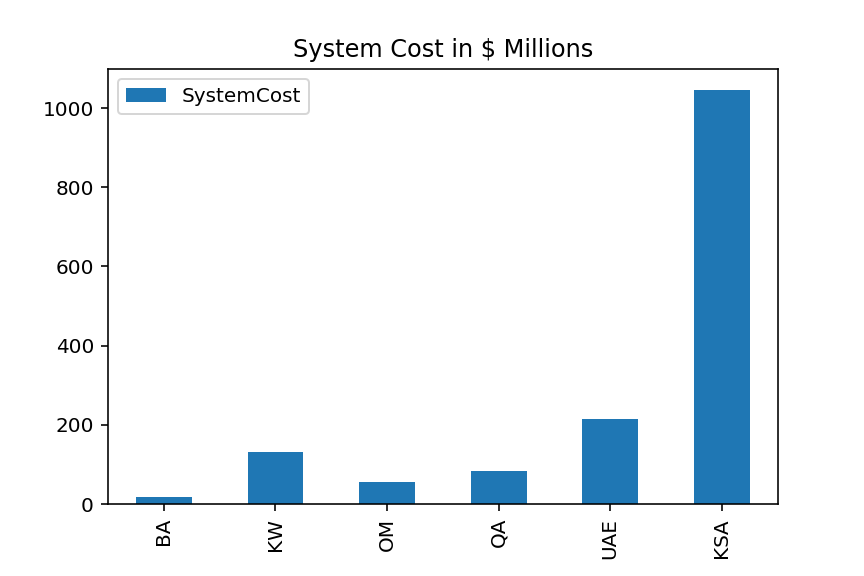

In [17]:
SystemCost_int.drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']).plot.bar(title='System Cost in $ Millions')


<IPython.core.display.Javascript object>


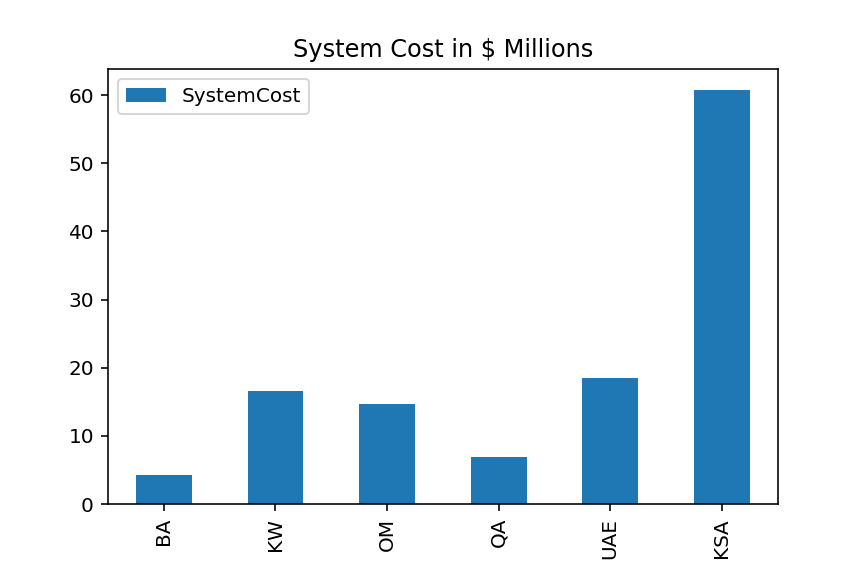

In [88]:
SystemCost_sub.drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']).plot.bar(title='System Cost in $ Millions')



In [18]:
#Total output system cost in Millions $ 
(results_int_isolated['TotalNodeOperationCost'].sum())/(1000000)

BA            30.444242
KW           116.851274
OM            52.618221
QA            67.165859
SA_EOA       343.452787
SA_HAIL       27.072740
SA_NEOA       19.198895
SA_NWOA       37.548546
SA_QASSIM      1.415374
SA_RIYADH    167.008684
SA_SOA        81.739828
SA_WOA       401.237556
UAE          218.460211
dtype: float64

In [89]:
#Total output system cost in Millions $ 
(results_sub_isolated['TotalNodeOperationCost'].sum())/(1000000)

BA            8.444806
KW           14.630476
OM           16.068725
QA            5.547217
SA_EOA       12.361400
SA_HAIL       1.167262
SA_NEOA       0.673532
SA_NWOA       1.448371
SA_QASSIM     0.063794
SA_RIYADH    24.606384
SA_SOA        5.918565
SA_WOA       17.036564
UAE          18.140386
dtype: float64

In [19]:
#Total output system cost in Millions $ 
KSA_Cost_int_isolated = (results_int_isolated['TotalNodeOperationCost'].sum()['SA_EOA']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_HAIL']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_NEOA']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_NWOA']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_QASSIM']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_RIYADH']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_SOA']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_WOA'])
KSA_Cost_int_isolated/(1000000)

1078.6744107400095

In [90]:
#Total output system cost in Millions $ 
KSA_Cost_sub_isolated = (results_sub_isolated['TotalNodeOperationCost'].sum()['SA_EOA']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_HAIL']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_NEOA']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_NWOA']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_QASSIM']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_RIYADH']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_SOA']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_WOA'])
KSA_Cost_sub_isolated/(1000000)

63.27587062859963

In [40]:
#Total output system cost in Millions $ 
SystemCost_int_isolated2 = results_int_isolated['TotalNodeOperationCost'].copy() #/(1000000)
SystemCost_int_isolated2['KSA'] = SystemCost_int_isolated2['SA_EOA']+SystemCost_int_isolated2['SA_HAIL']+SystemCost_int_isolated2['SA_NEOA']+SystemCost_int_isolated2['SA_NWOA']+SystemCost_int_isolated2['SA_QASSIM']+SystemCost_int_isolated2['SA_RIYADH']+SystemCost_int_isolated2['SA_SOA']+SystemCost_int_isolated2['SA_WOA']
SystemCost_int_isolated2.sum()/(1000000)


BA             30.444242
KW            116.851274
OM             52.618221
QA             67.165859
SA_EOA        343.452787
SA_HAIL        27.072740
SA_NEOA        19.198895
SA_NWOA        37.548546
SA_QASSIM       1.415374
SA_RIYADH     167.008684
SA_SOA         81.739828
SA_WOA        401.237556
UAE           218.460211
KSA          1078.674411
dtype: float64

In [91]:
A = pd.Series(((results_int_isolated['TotalNodeOperationCost'].sum())/(1000000)).drop(['BA','KW','OM','QA','UAE']).sum())
A.name = 'KSA'
SystemCost_int_isolated = pd.DataFrame((results_int_isolated['TotalNodeOperationCost'].sum())/(1000000))
SystemCost_int_isolated = SystemCost_int_isolated.append(A, ignore_index=False)
SystemCost_int_isolated.columns = ['SystemCost']
SystemCost_int_isolated

,SystemCost
BA,30.444242
KW,116.851274
OM,52.618221
QA,67.165859
SA_EOA,343.452787
SA_HAIL,27.072740
SA_NEOA,19.198895
SA_NWOA,37.548546
SA_QASSIM,1.415374
SA_RIYADH,167.008684


In [41]:
#Total output system cost in Millions $ 
SystemCost_sub_isolated2 = results_sub_isolated['TotalNodeOperationCost'].copy() #/(1000000)
SystemCost_sub_isolated2['KSA'] = SystemCost_sub_isolated2['SA_EOA']+SystemCost_sub_isolated2['SA_HAIL']+SystemCost_sub_isolated2['SA_NEOA']+SystemCost_sub_isolated2['SA_NWOA']+SystemCost_sub_isolated2['SA_QASSIM']+SystemCost_sub_isolated2['SA_RIYADH']+SystemCost_sub_isolated2['SA_SOA']+SystemCost_sub_isolated2['SA_WOA']
SystemCost_sub_isolated2.sum()/(1000000)


BA            8.444806
KW           14.630476
OM           16.068725
QA            5.547217
SA_EOA       12.361400
SA_HAIL       1.167262
SA_NEOA       0.673532
SA_NWOA       1.448371
SA_QASSIM     0.063794
SA_RIYADH    24.606384
SA_SOA        5.918565
SA_WOA       17.036564
UAE          18.140386
KSA          63.275871
dtype: float64

In [92]:
A = pd.Series(((results_sub_isolated['TotalNodeOperationCost'].sum())/(1000000)).drop(['BA','KW','OM','QA','UAE']).sum())
A.name = 'KSA'
SystemCost_sub_isolated = pd.DataFrame((results_sub_isolated['TotalNodeOperationCost'].sum())/(1000000))
SystemCost_sub_isolated = SystemCost_sub_isolated.append(A, ignore_index=False)
SystemCost_sub_isolated.columns = ['SystemCost']
SystemCost_sub_isolated

,SystemCost
BA,8.444806
KW,14.630476
OM,16.068725
QA,5.547217
SA_EOA,12.361400
SA_HAIL,1.167262
SA_NEOA,0.673532
SA_NWOA,1.448371
SA_QASSIM,0.063794
SA_RIYADH,24.606384


<IPython.core.display.Javascript object>


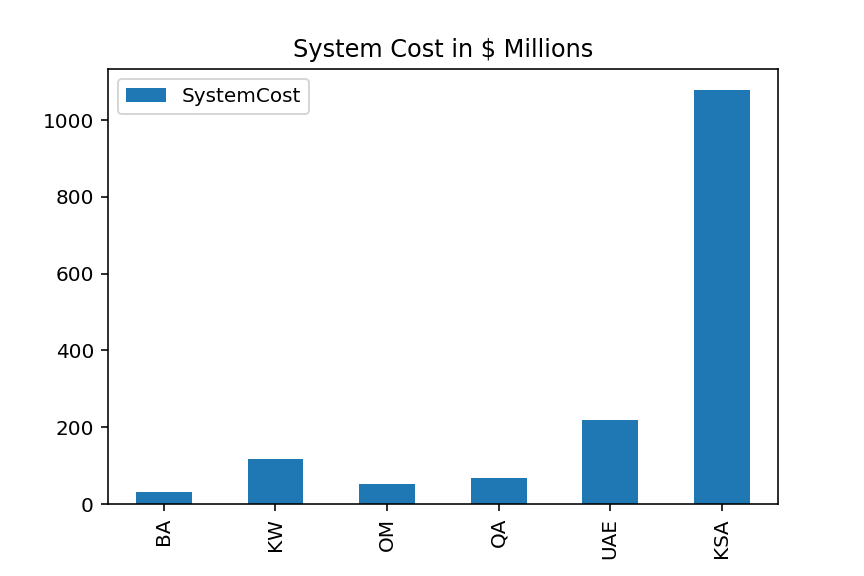

In [21]:
SystemCost_int_isolated.drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']).plot.bar(title='System Cost in $ Millions')


<IPython.core.display.Javascript object>


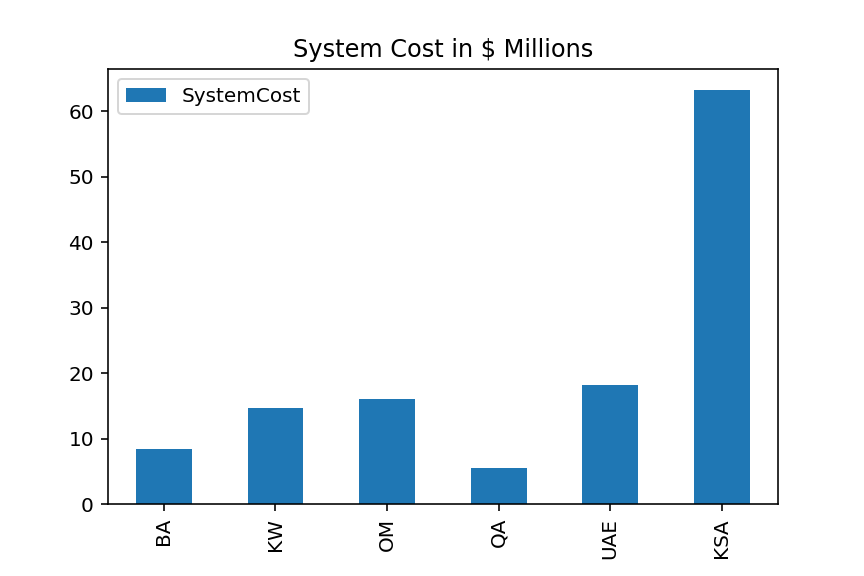

In [95]:
SystemCost_sub_isolated.drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']).plot.bar(title='System Cost in $ Millions')


In [22]:
#Total output system cost in Millions $ 
results_int['TotalNodeOperationCost'].sum().sum()/(1000000)

1549.242071089266

In [96]:
#Total output system cost in Millions $ 
results_sub['TotalNodeOperationCost'].sum().sum()/(1000000)

121.74512376236757

In [23]:
#Total output system cost in Millions$ 
results_int_isolated['TotalNodeOperationCost'].sum().sum()/(1000000)

1564.2142179237974

In [97]:
#Total output system cost in Millions$ 
results_sub_isolated['TotalNodeOperationCost'].sum().sum()/(1000000)

126.10747959083591

In [179]:
A = datain_int['Demand']['DA'].head(5)
A.drop(['BA','KW','OM','QA','UAE'], axis=1)

,SA_EOA,SA_RIYADH,SA_QASSIM,SA_HAIL,SA_WOA,SA_SOA,SA_NWOA,SA_NEOA
2016-07-11 00:00:00,16432.704,11996.502,2257.921,875.430,13150.131,5001.238,922.267,1128.281
2016-07-11 01:00:00,16432.342,11874.067,2235.692,865.810,13095.599,5040.349,922.238,1114.118
2016-07-11 02:00:00,16463.513,11735.758,2210.589,854.935,13078.505,5123.073,952.886,1098.093
2016-07-11 03:00:00,16270.821,11577.158,2181.673,842.574,12872.213,4957.550,952.856,1080.137
2016-07-11 04:00:00,16338.105,11502.297,2168.042,836.725,12949.203,5072.527,937.853,1071.605


In [169]:
#Average electricity cost in $/MWh 
(results_int['TotalNodeOperationCost']) / datain_int['Demand']['DA']

#Average electricity cost in $/MWh 
A = pd.Series((datain_int['Demand']['DA'].drop(['BA','KW','OM','QA','UAE'])).sum())
A.name = 'KSA'
System_demand_int = pd.DataFrame(datain_int['Demand']['DA'])
System_demand_int = System_demand_int.append(A, ignore_index=False)
System_demand_int.columns = ['TotalDemand']
elec_cost_int = pd.Series(SystemCost_int['SystemCost']*(1000000), index=SystemCost_int.index)/pd.Series(System_demand_int['TotalDemand'], index=System_demand_int.index)
elec_cost_int

,BA,KW,OM,QA,SA_EOA,SA_HAIL,SA_NEOA,SA_NWOA,SA_QASSIM,SA_RIYADH,SA_SOA,SA_WOA,UAE
2016-07-11 00:00:00,49.196198,71.777340,73.830471,82.072127,106.791635,230.516497,90.278879,266.053086,10.022500,79.941209,102.211037,163.809996,64.893743
2016-07-11 01:00:00,36.743426,68.517218,66.166224,81.080168,105.558227,120.364260,75.213202,214.079105,3.730293,77.931407,98.385199,164.880472,63.930037
2016-07-11 02:00:00,36.559074,68.760033,66.264710,81.390513,104.660888,129.907824,72.422802,213.890592,3.772653,78.849849,96.796540,165.095976,63.891169
2016-07-11 03:00:00,36.027508,68.973481,66.372470,81.805336,103.586328,18.551220,69.197796,213.890770,3.822656,79.930044,100.028389,167.741828,63.855271
2016-07-11 04:00:00,35.472738,69.163275,66.499929,81.854149,103.110030,66.304336,67.627519,213.981519,3.846690,80.450257,97.761085,166.744513,63.819391
2016-07-11 05:00:00,34.731468,69.390462,66.852172,82.080794,104.815536,169.669721,73.010385,214.145583,3.763828,78.658206,99.301766,161.749154,63.783760
2016-07-11 06:00:00,33.848275,69.669326,67.048183,82.527751,102.601308,6.938465,66.455268,214.983686,3.864855,80.842631,106.833239,163.306911,63.669148
2016-07-11 07:00:00,34.676985,69.504009,66.963123,82.184696,104.326706,6.779608,71.635384,214.909025,3.784826,79.112971,103.125258,164.063125,63.499754
2016-07-11 08:00:00,35.713976,69.040806,66.828397,81.473095,105.927912,101.354732,76.366041,214.428112,3.712189,77.540994,108.701628,160.055831,63.360536
2016-07-11 09:00:00,36.576914,68.673868,66.698815,80.580513,108.288637,216.457788,83.448416,214.001806,3.605463,75.231055,104.392642,159.086092,63.182379


In [24]:
#Average electricity cost in $/MWh 
(results_int['TotalNodeOperationCost'].sum()) / datain_int['Demand']['DA'].sum()

BA            37.323184
KW            68.079223
OM            66.667556
QA            80.332902
SA_EOA       111.098882
SA_HAIL      171.412880
SA_NEOA       93.387114
SA_NWOA      213.624095
SA_QASSIM      3.500036
SA_RIYADH     72.735308
SA_SOA        94.742081
SA_WOA       171.358081
UAE           63.394595
dtype: float64

In [98]:
#Average electricity cost in $/MWh 
(results_sub['TotalNodeOperationCost'].sum()) / datain_sub['Demand']['DA'].sum()

BA            9.305813
KW            8.569952
OM           17.273539
QA            6.640487
SA_EOA        4.193833
SA_HAIL       6.226827
SA_NEOA       3.225665
SA_NWOA       8.240182
SA_QASSIM     0.157754
SA_RIYADH    11.112152
SA_SOA        6.806904
SA_WOA        6.695546
UAE           5.479656
dtype: float64

In [25]:
#Average electricity cost in $/MWh 
KSA_Demand_int = datain_int['Demand']['DA']['SA_EOA'].sum()+datain_int['Demand']['DA']['SA_HAIL'].sum()+datain_int['Demand']['DA']['SA_NEOA'].sum()+datain_int['Demand']['DA']['SA_NWOA'].sum()+datain_int['Demand']['DA']['SA_QASSIM'].sum()+datain_int['Demand']['DA']['SA_RIYADH'].sum()+datain_int['Demand']['DA']['SA_SOA'].sum()+datain_int['Demand']['DA']['SA_WOA'].sum()
KSA_elec_cost_int = KSA_Cost_int/KSA_Demand_int
KSA_elec_cost_int

113.79231963941422

In [99]:
#Average electricity cost in $/MWh 
KSA_Demand_sub = datain_sub['Demand']['DA']['SA_EOA'].sum()+datain_sub['Demand']['DA']['SA_HAIL'].sum()+datain_sub['Demand']['DA']['SA_NEOA'].sum()+datain_sub['Demand']['DA']['SA_NWOA'].sum()+datain_sub['Demand']['DA']['SA_QASSIM'].sum()+datain_sub['Demand']['DA']['SA_RIYADH'].sum()+datain_sub['Demand']['DA']['SA_SOA'].sum()+datain_int['Demand']['DA']['SA_WOA'].sum()
KSA_elec_cost_sub = KSA_Cost_sub/KSA_Demand_sub
KSA_elec_cost_sub

40.24101226686051

In [235]:
#/(1000000)
TotalZoneOperationCost = results_int['TotalNodeOperationCost']
BBB = pd.DataFrame(TotalZoneOperationCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)

TotalZoneOperationCost['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost.index)
TotalZoneOperationCost


,BA,KW,OM,QA,SA_EOA,SA_HAIL,SA_NEOA,SA_NWOA,SA_QASSIM,SA_RIYADH,SA_SOA,SA_WOA,UAE,KSA
2016-07-11 00:00:00,138614.716023,828286.095913,414351.367770,494523.139839,1.754875e+06,201801.056673,101859.944098,245371.981570,22630.013353,959014.876801,511181.723736,2.154123e+06,1.226263e+06,5.950858e+06
2016-07-11 01:00:00,103717.505489,774470.667156,366377.598855,478459.746034,1.734569e+06,104212.579640,83796.382719,197431.885473,8339.785649,925362.745524,495895.740992,2.159209e+06,1.169698e+06,5.708817e+06
2016-07-11 02:00:00,102540.526119,757211.613068,359607.315856,471872.077410,1.723086e+06,111062.745654,79526.971426,203813.350281,8339.785649,925362.745524,495895.740992,2.159209e+06,1.135443e+06,5.706296e+06
2016-07-11 03:00:00,99229.124806,742757.481561,352502.198208,463419.049021,1.685435e+06,15630.775496,74743.099402,203807.103741,8339.785649,925362.745524,495895.740992,2.159209e+06,1.105479e+06,5.568422e+06
2016-07-11 04:00:00,95898.063481,730431.958815,344480.271403,462449.749751,1.684622e+06,55478.495221,72469.987567,200683.209311,8339.785649,925362.745524,495895.740992,2.159209e+06,1.077006e+06,5.602061e+06
2016-07-11 05:00:00,91634.462265,716289.287620,324235.040183,458016.574838,1.702641e+06,145439.018870,80415.754956,195278.286853,8339.785649,925362.745524,495895.740992,2.159209e+06,1.050124e+06,5.712580e+06
2016-07-11 06:00:00,86823.532225,699640.967964,314048.327459,449557.543844,1.625219e+06,5775.467099,70796.325056,171609.867360,8339.785649,925362.745524,487241.192280,2.159209e+06,1.044022e+06,5.453553e+06
2016-07-11 07:00:00,91357.904110,709009.699773,318381.526467,455926.173935,1.675019e+06,5775.467099,78344.324516,173135.653288,8339.785649,925362.745524,455092.071913,2.159209e+06,1.082868e+06,5.480278e+06
2016-07-11 08:00:00,97385.228082,737509.771731,325519.116060,469986.510520,1.735477e+06,88225.848188,85596.862065,185734.843326,8339.785649,925362.745524,495895.740992,2.159209e+06,1.146471e+06,5.683842e+06
2016-07-11 09:00:00,102740.895127,761933.822910,332721.703120,489300.991950,1.818209e+06,194655.942822,97079.464355,198511.713040,8339.785649,925362.745524,495895.740992,2.206727e+06,1.208356e+06,5.944781e+06


In [237]:
NodeDemand = datain_int['Demand']['DA']
BBB = pd.DataFrame(NodeDemand[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA_Demand = BBB.sum(axis=1)

NodeDemand['KSA']= pd.Series(KSA_Demand.values, index=NodeDemand.index)
NodeDemand


/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


,SA_EOA,SA_RIYADH,SA_QASSIM,SA_HAIL,SA_WOA,SA_SOA,SA_NWOA,SA_NEOA,OM,KW,BA,QA,UAE,KSA
2016-07-11 00:00:00,16432.704,11996.502,2257.921,875.430,13150.131,5001.238,922.267,1128.281,5612.200,11539.66,2817.59,6025.47,18896.48,51764.474
2016-07-11 01:00:00,16432.342,11874.067,2235.692,865.810,13095.599,5040.349,922.238,1114.118,5537.230,11303.30,2822.75,5901.07,18296.54,51580.215
2016-07-11 02:00:00,16463.513,11735.758,2210.589,854.935,13078.505,5123.073,952.886,1098.093,5426.830,11012.38,2804.79,5797.63,17771.51,51517.352
2016-07-11 03:00:00,16270.821,11577.158,2181.673,842.574,12872.213,4957.550,952.856,1080.137,5310.970,10768.74,2754.26,5664.90,17312.26,50734.982
2016-07-11 04:00:00,16338.105,11502.297,2168.042,836.725,12949.203,5072.527,937.853,1071.605,5180.160,10560.98,2703.43,5649.68,16875.85,50876.357
2016-07-11 05:00:00,16244.162,11764.351,2215.772,857.189,13349.118,4993.826,911.895,1101.429,4850.030,10322.59,2638.37,5580.07,16463.82,51437.742
2016-07-11 06:00:00,15840.141,11446.470,2157.852,832.384,13221.783,4560.764,798.246,1065.323,4683.920,10042.31,2565.08,5447.35,16397.61,49922.963
2016-07-11 07:00:00,16055.517,11696.726,2203.479,851.888,13160.840,4413.003,805.623,1093.654,4754.580,10200.99,2634.54,5547.58,17053.11,50280.730
2016-07-11 08:00:00,16383.568,11933.852,2246.595,870.466,13490.346,4561.990,866.187,1120.876,4870.970,10682.23,2726.81,5768.61,18094.40,51473.880
2016-07-11 09:00:00,16790.396,12300.276,2313.097,899.279,13871.275,4750.294,927.617,1163.347,4988.420,11094.96,2808.90,6072.20,19124.89,53015.581


In [240]:
TotalZoneOperationCost.div(NodeDemand).mean()

BA            37.131810
KSA          113.639232
KW            68.182284
OM            66.690533
QA            80.426137
SA_EOA       110.928668
SA_HAIL      168.491965
SA_NEOA       91.935800
SA_NWOA      213.710615
SA_QASSIM      3.520371
SA_RIYADH     73.082717
SA_SOA        94.941634
SA_WOA       171.072280
UAE           63.426603
dtype: float64

In [191]:
A = pd.Series(((results_int['TotalNodeOperationCost'].sum())/(1000000)).drop(['BA','KW','OM','QA','UAE']).sum())
A.name = 'KSA'
SystemCost_int = pd.DataFrame((results_int['TotalNodeOperationCost'].sum())/(1000000))
SystemCost_int = SystemCost_int.append(A, ignore_index=False)
SystemCost_int.columns = ['SystemCost']
SystemCost_int

#Average electricity cost in $/MWh 
A = pd.Series((datain_int['Demand']['DA'].sum().drop(['BA','KW','OM','QA','UAE'])).sum())
A.name = 'KSA'
System_demand_int = pd.DataFrame(datain_int['Demand']['DA'].sum())
System_demand_int = System_demand_int.append(A, ignore_index=False)
System_demand_int.columns = ['TotalDemand']
elec_cost_int = pd.Series(SystemCost_int['SystemCost']*(1000000), index=SystemCost_int.index)/pd.Series(System_demand_int['TotalDemand'], index=System_demand_int.index)
elec_cost_int

BA            37.323184
KSA          113.792320
KW            68.079223
OM            66.667556
QA            80.332902
SA_EOA       111.098882
SA_HAIL      171.412880
SA_NEOA       93.387114
SA_NWOA      213.624095
SA_QASSIM      3.500036
SA_RIYADH     72.735308
SA_SOA        94.742081
SA_WOA       171.358081
UAE           63.394595
dtype: float64

In [100]:
#Average electricity cost in $/MWh 
A = pd.Series((datain_sub['Demand']['DA'].sum().drop(['BA','KW','OM','QA','UAE'])).sum())
A.name = 'KSA'
System_demand_sub = pd.DataFrame(datain_int['Demand']['DA'].sum())
System_demand_sub = System_demand_sub.append(A, ignore_index=False)
System_demand_sub.columns = ['TotalDemand']
elec_cost_sub = pd.Series(SystemCost_int['SystemCost']*(1000000), index=SystemCost_sub.index)/pd.Series(System_demand_sub['TotalDemand'], index=System_demand_sub.index)
elec_cost_sub

BA            37.323184
KSA          113.792320
KW            68.079223
OM            66.667556
QA            80.332902
SA_EOA       111.098882
SA_HAIL      171.412880
SA_NEOA       93.387114
SA_NWOA      213.624095
SA_QASSIM      3.500036
SA_RIYADH     72.735308
SA_SOA        94.742081
SA_WOA       171.358081
UAE           63.394595
dtype: float64

<IPython.core.display.Javascript object>


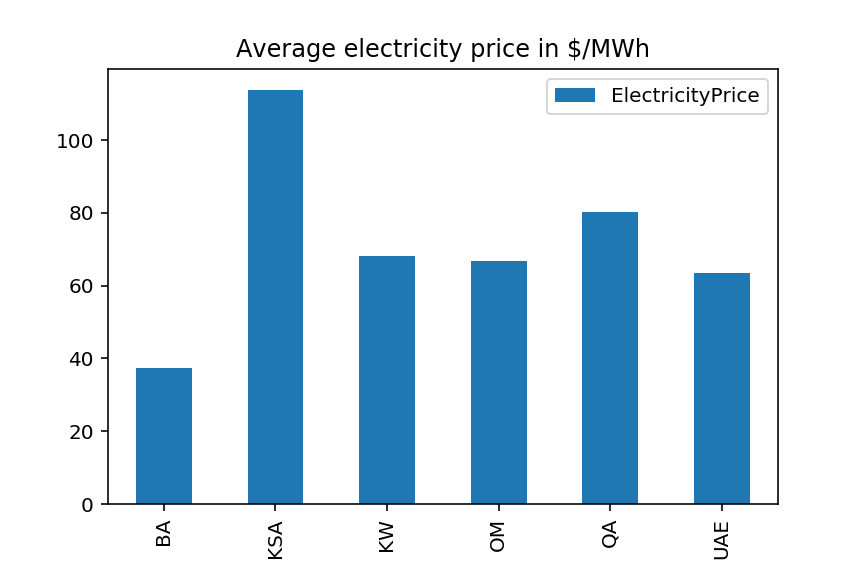

In [28]:
elec_cost_int2 = pd.DataFrame(elec_cost_int,columns=['ElectricityPrice'])
elec_cost_int2.drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']).plot.bar(title='Average electricity price in $/MWh')


<IPython.core.display.Javascript object>


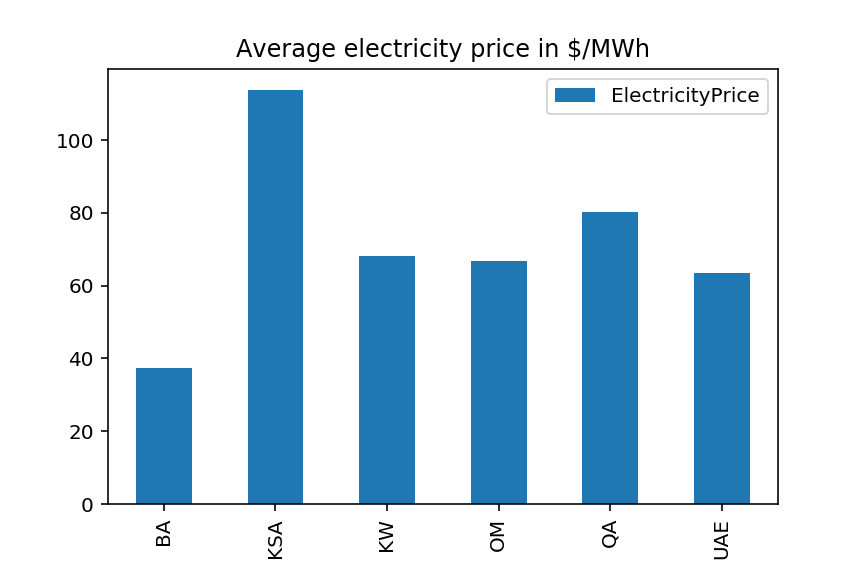

In [101]:
elec_cost_sub2 = pd.DataFrame(elec_cost_sub,columns=['ElectricityPrice'])
elec_cost_sub2.drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']).plot.bar(title='Average electricity price in $/MWh')


In [29]:
#Average electricity cost in $/MWh 
(results_int_isolated['TotalNodeOperationCost'].sum()) / datain_int_isolated['Demand']['DA'].sum()

BA            65.824075
KW            60.369341
OM            61.825410
QA            64.839844
SA_EOA       118.749493
SA_HAIL      171.412880
SA_NEOA       93.387114
SA_NWOA      213.624095
SA_QASSIM      3.500036
SA_RIYADH     77.551417
SA_SOA        94.742081
SA_WOA       171.358081
UAE           64.692940
dtype: float64

In [103]:
#Average electricity cost in $/MWh 
(results_sub_isolated['TotalNodeOperationCost'].sum()) / datain_sub_isolated['Demand']['DA'].sum()

BA           18.258675
KW            7.558601
OM           18.880446
QA            5.355111
SA_EOA        4.273979
SA_HAIL       7.390596
SA_NEOA       3.276189
SA_NWOA       8.240182
SA_QASSIM     0.157754
SA_RIYADH    11.426112
SA_SOA        6.860024
SA_WOA        7.275871
UAE           5.371939
dtype: float64

In [31]:
#Average electricity cost in $/MWh 
KSA_Demand_int_isolated = datain_int_isolated['Demand']['DA']['SA_EOA'].sum()+datain_int_isolated['Demand']['DA']['SA_HAIL'].sum()+datain_int_isolated['Demand']['DA']['SA_NEOA'].sum()+datain_int_isolated['Demand']['DA']['SA_NWOA'].sum()+datain_int_isolated['Demand']['DA']['SA_QASSIM'].sum()+datain_int_isolated['Demand']['DA']['SA_RIYADH'].sum()+datain_int_isolated['Demand']['DA']['SA_SOA'].sum()+datain_int_isolated['Demand']['DA']['SA_WOA'].sum()
KSA_elec_cost_int_isolated = KSA_Cost_int_isolated/KSA_Demand_int_isolated
KSA_elec_cost_int_isolated

117.32723588660689

In [104]:
#Average electricity cost in $/MWh 
KSA_Demand_sub_isolated = datain_sub_isolated['Demand']['DA']['SA_EOA'].sum()+datain_sub_isolated['Demand']['DA']['SA_HAIL'].sum()+datain_int_isolated['Demand']['DA']['SA_NEOA'].sum()+datain_int_isolated['Demand']['DA']['SA_NWOA'].sum()+datain_int_isolated['Demand']['DA']['SA_QASSIM'].sum()+datain_int_isolated['Demand']['DA']['SA_RIYADH'].sum()+datain_int_isolated['Demand']['DA']['SA_SOA'].sum()+datain_int_isolated['Demand']['DA']['SA_WOA'].sum()
KSA_elec_cost_sub_isolated = KSA_Cost_sub_isolated/KSA_Demand_sub_isolated
KSA_elec_cost_sub_isolated

6.882505902850712

In [33]:
#Average electricity cost in $/MWh 
A = pd.Series((datain_int_isolated['Demand']['DA'].sum().drop(['BA','KW','OM','QA','UAE'])).sum())
A.name = 'KSA'
System_demand_int_isolated = pd.DataFrame(datain_int_isolated['Demand']['DA'].sum())
System_demand_int_isolated = System_demand_int_isolated.append(A, ignore_index=False)
System_demand_int_isolated.columns = ['TotalDemand']
elec_cost_int_isolated = pd.Series(SystemCost_int_isolated['SystemCost']*(1000000), index=SystemCost_int_isolated.index)/pd.Series(System_demand_int_isolated['TotalDemand'], index=System_demand_int_isolated.index)
elec_cost_int_isolated

BA            65.824075
KSA          117.327236
KW            60.369341
OM            61.825410
QA            64.839844
SA_EOA       118.749493
SA_HAIL      171.412880
SA_NEOA       93.387114
SA_NWOA      213.624095
SA_QASSIM      3.500036
SA_RIYADH     77.551417
SA_SOA        94.742081
SA_WOA       171.358081
UAE           64.692940
dtype: float64

In [105]:
#Average electricity cost in $/MWh 
A = pd.Series((datain_sub_isolated['Demand']['DA'].sum().drop(['BA','KW','OM','QA','UAE'])).sum())
A.name = 'KSA'
System_demand_sub_isolated = pd.DataFrame(datain_sub_isolated['Demand']['DA'].sum())
System_demand_sub_isolated = System_demand_sub_isolated.append(A, ignore_index=False)
System_demand_sub_isolated.columns = ['TotalDemand']
elec_cost_sub_isolated = pd.Series(SystemCost_sub_isolated['SystemCost']*(1000000), index=SystemCost_sub_isolated.index)/pd.Series(System_demand_sub_isolated['TotalDemand'], index=System_demand_sub_isolated.index)
elec_cost_sub_isolated

BA           18.258675
KSA           6.882506
KW            7.558601
OM           18.880446
QA            5.355111
SA_EOA        4.273979
SA_HAIL       7.390596
SA_NEOA       3.276189
SA_NWOA       8.240182
SA_QASSIM     0.157754
SA_RIYADH    11.426112
SA_SOA        6.860024
SA_WOA        7.275871
UAE           5.371939
dtype: float64

<IPython.core.display.Javascript object>


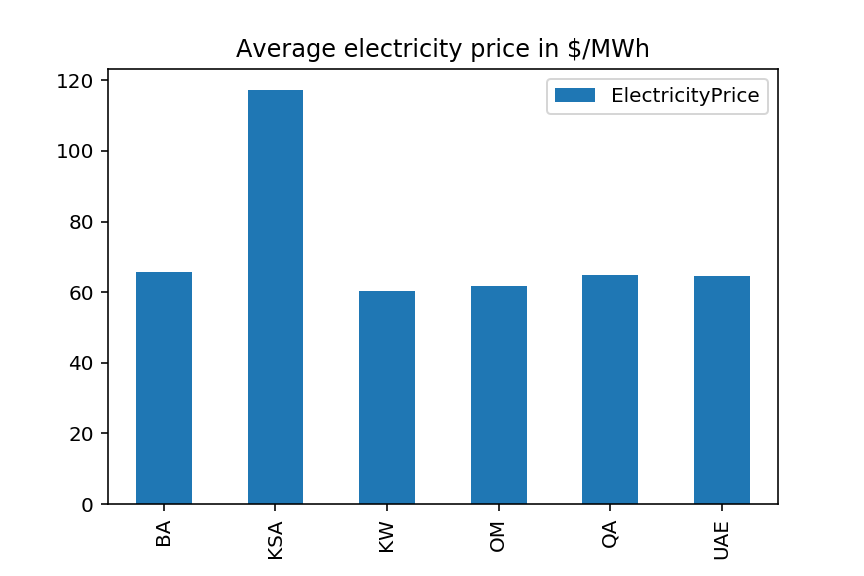

In [34]:
elec_cost_int_isolated2 = pd.DataFrame(elec_cost_int_isolated,columns=['ElectricityPrice'])
elec_cost_int_isolated2.drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']).plot.bar(title='Average electricity price in $/MWh')


<IPython.core.display.Javascript object>


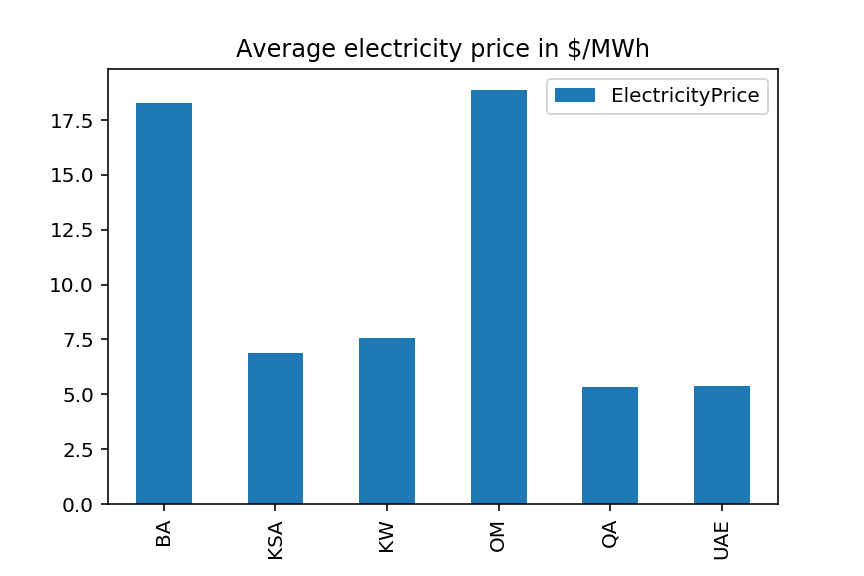

In [106]:
elec_cost_sub_isolated2 = pd.DataFrame(elec_cost_sub_isolated,columns=['ElectricityPrice'])
elec_cost_sub_isolated2.drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']).plot.bar(title='Average electricity price in $/MWh')


In [35]:
#This function sorts the power generation curves of the different units by technology
post.aggregate_by_fuel(results_int['UnitOutputPower'], inputs_int, SpecifyFuels=None).head(5)

,BIO,GAS,HRD,LIG,NUC,OIL,PEA,SUN,WAT,WIN,WST,OTH,DSL,HFO,MSW,LFG
2016-07-11 00:00:00,0,81218.897578,0,0,0,5700.598246,0,0.0,0,0.157239,0,0,69.491571,9666.0,0.389523,0.339843
2016-07-11 01:00:00,0,80065.609162,0,0,0,5639.136246,0,0.0,0,0.138655,0,0,69.491571,9666.0,0.389523,0.339843
2016-07-11 02:00:00,0,78910.702582,0,0,0,5683.411246,0,0.0,0,0.157235,0,0,69.491571,9666.0,0.389523,0.339843
2016-07-11 03:00:00,0,77557.393437,0,0,0,5252.333246,0,0.0,0,0.164380,0,0,69.491571,9666.0,0.389523,0.339843
2016-07-11 04:00:00,0,76708.790727,0,0,0,5401.285246,0,0.0,0,0.160090,0,0,69.491571,9666.0,0.389523,0.339843


In [107]:
#This function sorts the power generation curves of the different units by technology
post.aggregate_by_fuel(results_sub['UnitOutputPower'], inputs_sub, SpecifyFuels=None).head(5)

,BIO,GAS,HRD,LIG,NUC,OIL,PEA,SUN,WAT,WIN,WST,OTH,DSL,HFO,MSW,LFG
2016-07-11 00:00:00,0,54550.828969,0,0,0,26804.885061,0,0.0,0,0.157239,0,0,5633.273365,9666.0,0.389523,0.339843
2016-07-11 01:00:00,0,53302.362514,0,0,0,26838.601100,0,0.0,0,0.138655,0,0,5633.273365,9666.0,0.389523,0.339843
2016-07-11 02:00:00,0,52438.375934,0,0,0,26591.956100,0,0.0,0,0.157235,0,0,5633.273365,9666.0,0.389523,0.339843
2016-07-11 03:00:00,0,51328.706789,0,0,0,26288.078228,0,0.0,0,0.164380,0,0,5262.433237,9666.0,0.389523,0.339843
2016-07-11 04:00:00,0,50687.864079,0,0,0,26065.315228,0,0.0,0,0.160090,0,0,5426.388237,9666.0,0.389523,0.339843


In [36]:
#This function sorts the power generation curves of the different units by technology
post.aggregate_by_fuel(results_int_isolated['UnitOutputPower'], inputs_int_isolated, SpecifyFuels=None).head(5)

,BIO,GAS,HRD,LIG,NUC,OIL,PEA,SUN,WAT,WIN,WST,OTH,DSL,HFO,MSW,LFG
2016-07-11 00:00:00,0,81218.897578,0,0,0,5700.598246,0,0.0,0,0.157239,0,0,69.491571,9666.0,0.389523,0.339843
2016-07-11 01:00:00,0,80065.609162,0,0,0,5639.136246,0,0.0,0,0.138655,0,0,69.491571,9666.0,0.389523,0.339843
2016-07-11 02:00:00,0,78910.702582,0,0,0,5683.411246,0,0.0,0,0.157235,0,0,69.491571,9666.0,0.389523,0.339843
2016-07-11 03:00:00,0,77557.393437,0,0,0,5252.333246,0,0.0,0,0.164380,0,0,69.491571,9666.0,0.389523,0.339843
2016-07-11 04:00:00,0,76708.790727,0,0,0,5401.285246,0,0.0,0,0.160090,0,0,69.491571,9666.0,0.389523,0.339843


In [108]:
#This function sorts the power generation curves of the different units by technology
post.aggregate_by_fuel(results_sub_isolated['UnitOutputPower'], inputs_sub_isolated, SpecifyFuels=None).head(5)

,BIO,GAS,HRD,LIG,NUC,OIL,PEA,SUN,WAT,WIN,WST,OTH,DSL,HFO,MSW,LFG
2016-07-11 00:00:00,0,54410.828969,0,0,0,26944.885061,0,0.0,0,0.157239,0,0,5633.273365,9666.0,0.389523,0.339843
2016-07-11 01:00:00,0,53616.697553,0,0,0,26524.266061,0,0.0,0,0.138655,0,0,5633.273365,9666.0,0.389523,0.339843
2016-07-11 02:00:00,0,52859.848973,0,0,0,26170.483061,0,0.0,0,0.157235,0,0,5633.273365,9666.0,0.389523,0.339843
2016-07-11 03:00:00,0,52101.471828,0,0,0,25144.473061,0,0.0,0,0.164380,0,0,5633.273365,9666.0,0.389523,0.339843
2016-07-11 04:00:00,0,51468.206118,0,0,0,25078.088061,0,0.0,0,0.160090,0,0,5633.273365,9666.0,0.389523,0.339843


In [37]:
NewOutputFlow_int = results_int['PowerFlow'].copy()
OriginalColumns_int = []
reverseindex = []
for j,column in enumerate(NewOutputFlow_int):
    A = column.split(' -> ')
    OriginalColumns_int.append(A)
    B = list(reversed(A))
    if B in OriginalColumns_int:
        reverseindex.append(j)
        D = [i for i, C in enumerate(OriginalColumns_int) if C==B]
        D = int(''.join(map(str,D)))
        NewOutputFlow_int.iloc[:,D] = NewOutputFlow_int.iloc[:,D] - NewOutputFlow_int.iloc[:,j]
NewOutputFlow_int = NewOutputFlow_int.drop(NewOutputFlow_int.columns[reverseindex], axis=1).copy()
NewOutputFlow_int.head(5)


,BA -> KW,BA -> SA_EOA,KW -> SA_EOA,OM -> UAE,QA -> BA,QA -> SA_EOA,QA -> UAE,SA_EOA -> SA_RIYADH,SA_HAIL -> SA_NEOA,SA_QASSIM -> SA_HAIL,SA_QASSIM -> SA_WOA,SA_RIYADH -> SA_QASSIM,SA_WOA -> SA_SOA,UAE -> BA,UAE -> SA_EOA
2016-07-11 00:00:00,0.0,0.0,1550.0,400.0,0.0,250.0,1250.0,4528.65599,800.0,832.831732,239.247268,3300.0,1732.888222,1250.0,0.0
2016-07-11 01:00:00,0.0,0.0,1550.0,400.0,1250.0,250.0,0.0,4406.22099,800.0,1214.709778,-120.401778,3300.0,1771.999222,0.0,0.0
2016-07-11 02:00:00,0.0,0.0,1550.0,400.0,1250.0,250.0,0.0,4267.91199,800.0,1174.182778,-54.771778,3300.0,1854.723222,0.0,0.0
2016-07-11 03:00:00,0.0,0.0,1550.0,400.0,1250.0,250.0,0.0,4109.31199,800.0,1574.913778,-426.586778,3300.0,1689.200222,0.0,0.0
2016-07-11 04:00:00,0.0,0.0,1550.0,400.0,1250.0,250.0,0.0,4034.45099,800.0,1396.577778,-234.619778,3300.0,1804.177222,0.0,0.0


In [159]:
NewOutputFlow_sub = results_sub['PowerFlow'].copy()
OriginalColumns_sub = []
reverseindex = []
for j,column in enumerate(NewOutputFlow_sub):
    A = column.split(' -> ')
    OriginalColumns_sub.append(A)
    B = list(reversed(A))
    if B in OriginalColumns_sub:
        reverseindex.append(j)
        D = [i for i, C in enumerate(OriginalColumns_sub) if C==B]
        D = int(''.join(map(str,D)))
        NewOutputFlow_sub.iloc[:,D] = NewOutputFlow_sub.iloc[:,D] - NewOutputFlow_sub.iloc[:,j]
NewOutputFlow_sub = NewOutputFlow_sub.drop(NewOutputFlow_sub.columns[reverseindex], axis=1).copy()
NewOutputFlow_sub.head(5)

,KW -> BA,KW -> SA_EOA,QA -> BA,QA -> SA_EOA,QA -> UAE,SA_EOA -> BA,SA_HAIL -> SA_NEOA,SA_QASSIM -> SA_HAIL,SA_QASSIM -> SA_WOA,SA_RIYADH -> SA_EOA,SA_RIYADH -> SA_QASSIM,SA_SOA -> SA_WOA,UAE -> OM,UAE -> SA_EOA
2016-07-11 00:00:00,1360.0,190.0,0.0,1500.0,0.0,0.0,747.281,780.112732,-648.495693,3787.880471,2359.538039,-659.698392,400.0,0.0
2016-07-11 01:00:00,1360.0,190.0,0.0,1500.0,0.0,0.0,733.118,1527.347127,-433.039127,3787.518471,3300.000000,-698.809392,400.0,0.0
2016-07-11 02:00:00,1360.0,190.0,0.0,1500.0,0.0,0.0,717.093,1486.820127,-367.409127,3818.689471,3300.000000,-781.533392,400.0,0.0
2016-07-11 03:00:00,1360.0,190.0,0.0,1500.0,0.0,0.0,800.000,1617.574000,-469.247000,3625.997471,3300.000000,-616.010392,400.0,0.0
2016-07-11 04:00:00,1360.0,190.0,0.0,1500.0,0.0,0.0,800.000,1611.725000,-449.767000,3693.281471,3300.000000,-730.987392,400.0,0.0


<IPython.core.display.Javascript object>


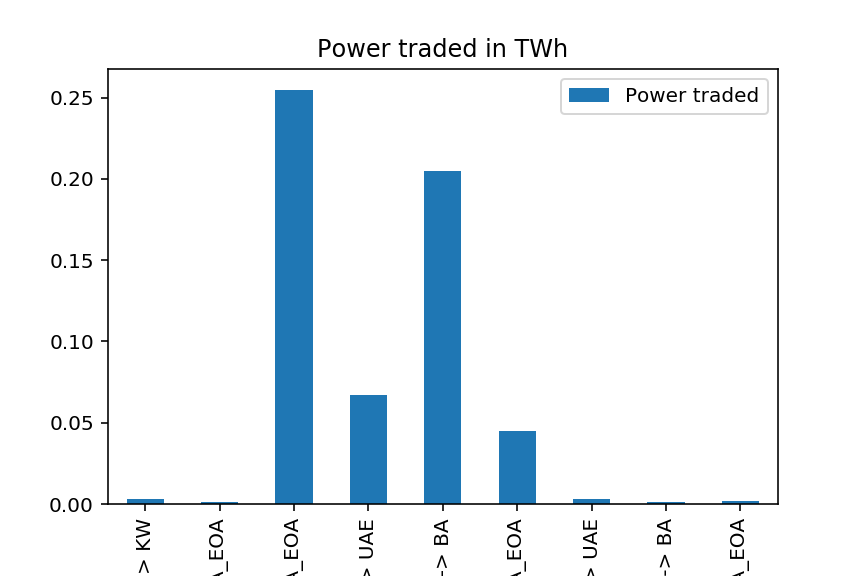

In [38]:
pd.DataFrame((NewOutputFlow_int.sum()/(1000000)),columns=['Power traded']).drop(['SA_EOA -> SA_RIYADH','SA_HAIL -> SA_NEOA','SA_QASSIM -> SA_HAIL','SA_QASSIM -> SA_WOA','SA_RIYADH -> SA_QASSIM','SA_WOA -> SA_SOA']).plot.bar(title='Power traded in TWh')


<IPython.core.display.Javascript object>


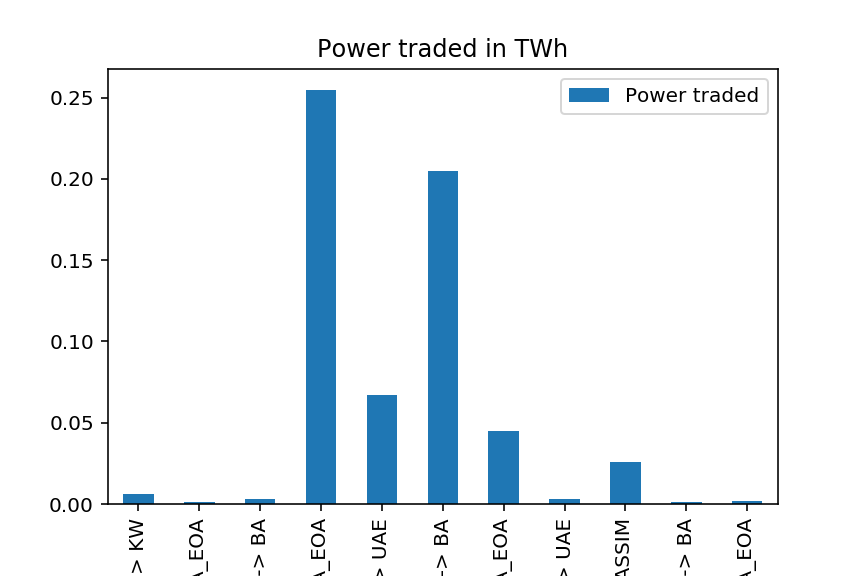

In [110]:
pd.DataFrame((NewOutputFlow_sub.sum()/(1000000)),columns=['Power traded']).drop(['SA_EOA -> SA_RIYADH','SA_HAIL -> SA_NEOA','SA_QASSIM -> SA_HAIL','SA_QASSIM -> SA_WOA','SA_RIYADH -> SA_QASSIM','SA_WOA -> SA_SOA']).plot.bar(title='Power traded in TWh')


<IPython.core.display.Javascript object>


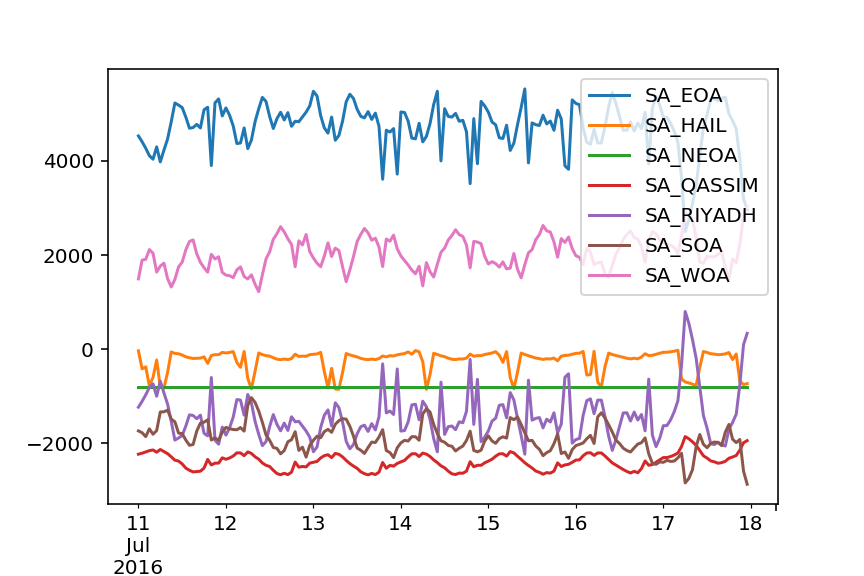

In [112]:
results_int_isolated['NetExportedPower'].plot()

<IPython.core.display.Javascript object>


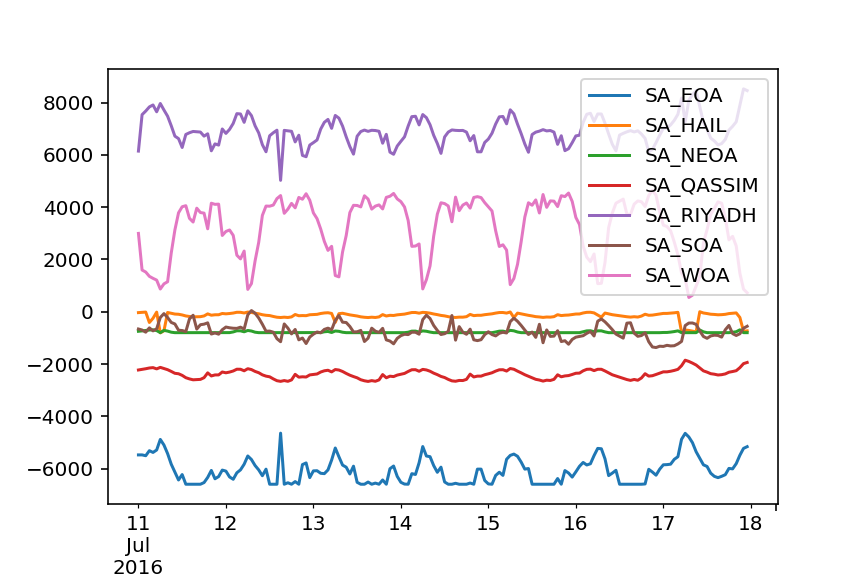

In [113]:
results_sub_isolated['NetExportedPower'].plot()

In [40]:
NewOutputFlow_int_isolated = results_int_isolated['PowerFlow'].copy()
OriginalColumns_int_isolated = []
reverseindex = []
for j,column in enumerate(NewOutputFlow_int_isolated):
    A = column.split(' -> ')
    OriginalColumns_int_isolated.append(A)
    B = list(reversed(A))
    if B in OriginalColumns_int_isolated:
        reverseindex.append(j)
        D = [i for i, C in enumerate(OriginalColumns_int_isolated) if C==B]
        D = int(''.join(map(str,D)))
        NewOutputFlow_int_isolated.iloc[:,D] = NewOutputFlow_int_isolated.iloc[:,D] - NewOutputFlow_int_isolated.iloc[:,j]
NewOutputFlow_int_isolated = NewOutputFlow_int_isolated.drop(NewOutputFlow_int_isolated.columns[reverseindex], axis=1).copy()
NewOutputFlow_int_isolated.head(5)

,SA_EOA -> SA_RIYADH,SA_HAIL -> SA_NEOA,SA_QASSIM -> SA_HAIL,SA_QASSIM -> SA_WOA,SA_RIYADH -> SA_QASSIM,SA_WOA -> SA_SOA
2016-07-11 00:00:00,4528.65599,800.0,832.831732,239.247268,3300.0,1732.888222
2016-07-11 01:00:00,4406.22099,800.0,1214.709778,-120.401778,3300.0,1771.999222
2016-07-11 02:00:00,4267.91199,800.0,1174.182778,-54.771778,3300.0,1854.723222
2016-07-11 03:00:00,4109.31199,800.0,1574.913778,-426.586778,3300.0,1689.200222
2016-07-11 04:00:00,4034.45099,800.0,1396.577778,-234.619778,3300.0,1804.177222


In [116]:
NewOutputFlow_sub_isolated = results_sub_isolated['PowerFlow'].copy()
OriginalColumns_sub_isolated = []
reverseindex = []
for j,column in enumerate(NewOutputFlow_sub_isolated):
    A = column.split(' -> ')
    OriginalColumns_sub_isolated.append(A)
    B = list(reversed(A))
    if B in OriginalColumns_sub_isolated:
        reverseindex.append(j)
        D = [i for i, C in enumerate(OriginalColumns_sub_isolated) if C==B]
        D = int(''.join(map(str,D)))
        NewOutputFlow_sub_isolated.iloc[:,D] = NewOutputFlow_sub_isolated.iloc[:,D] - NewOutputFlow_sub_isolated.iloc[:,j]
NewOutputFlow_sub_isolated = NewOutputFlow_sub_isolated.drop(NewOutputFlow_sub_isolated.columns[reverseindex], axis=1).copy()
NewOutputFlow_sub_isolated.head(5)

,SA_HAIL -> SA_NEOA,SA_QASSIM -> SA_HAIL,SA_QASSIM -> SA_RIYADH,SA_RIYADH -> SA_EOA,SA_SOA -> SA_WOA,SA_WOA -> SA_QASSIM
2016-07-11 00:00:00,747.281,780.112732,-669.538039,5477.880471,-659.698392,2338.495693
2016-07-11 01:00:00,733.118,756.329732,-2064.335039,5477.518471,-698.809392,897.686693
2016-07-11 02:00:00,717.093,729.429732,-2171.473039,5508.689471,-781.533392,738.545693
2016-07-11 03:00:00,699.137,1110.316167,-2522.765039,5315.997471,-616.010392,739.224127
2016-07-11 04:00:00,690.605,939.557167,-2530.342039,5383.281471,-730.987392,547.257127


<IPython.core.display.Javascript object>


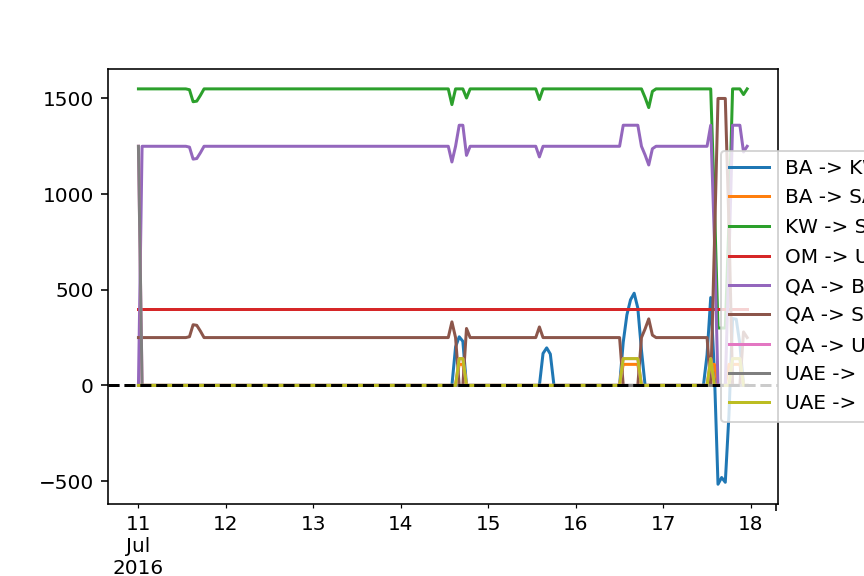

In [121]:
columns = []
for i,column in enumerate(NewOutputFlow_int):
    [from_node, to_node] = column.split('->')
    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
        columns.append(i)
GCCFlows_int = NewOutputFlow_int.drop(NewOutputFlow_int.columns[columns], axis=1).copy()
ax = GCCFlows_int.plot(kind='line', title=None, legend=True)
ax.legend(loc='center left', bbox_to_anchor=(0.9, 0.5))
ax.axhline(y=0, xmin=0, xmax=1, color='k', linestyle='--')

<IPython.core.display.Javascript object>


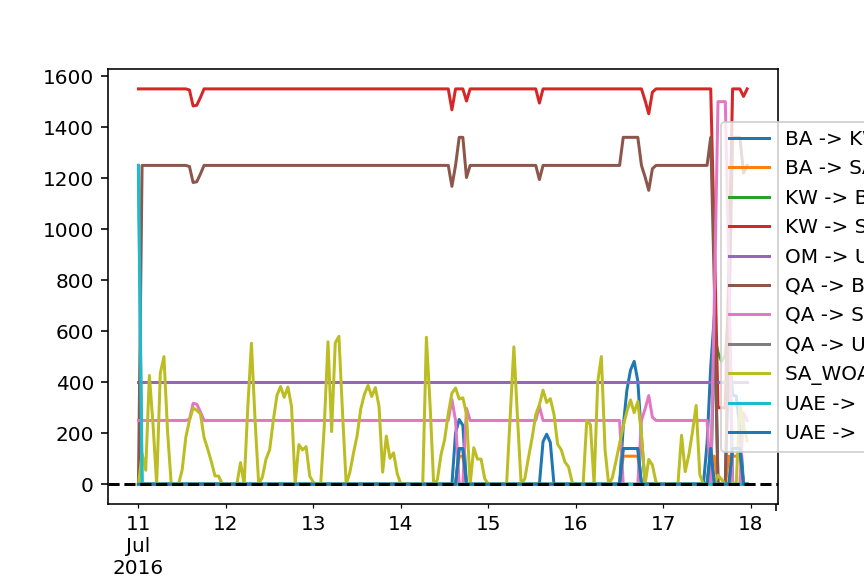

In [119]:
columns = []
for i,column in enumerate(NewOutputFlow_int):
    [from_node, to_node] = column.split('->')
    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
        columns.append(i)
GCCFlows_sub = NewOutputFlow_sub.drop(NewOutputFlow_int.columns[columns], axis=1).copy()
ax = GCCFlows_sub.plot(kind='line', title=None, legend=True)
ax.legend(loc='center left', bbox_to_anchor=(0.9, 0.5))
ax.axhline(y=0, xmin=0, xmax=1, color='k', linestyle='--')

<IPython.core.display.Javascript object>


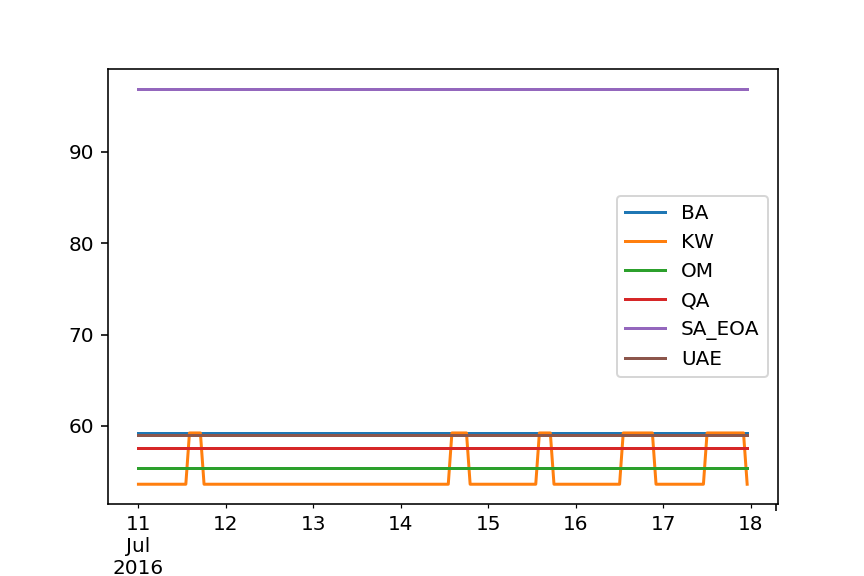

In [123]:
results_int['NodeShadowPrice'].drop(columns=[ 'SA_RIYADH','SA_QASSIM', 'SA_HAIL',  'SA_WOA', 'SA_SOA', 'SA_NWOA', 'SA_NEOA','SA_NEOA' ]).plot()


<IPython.core.display.Javascript object>


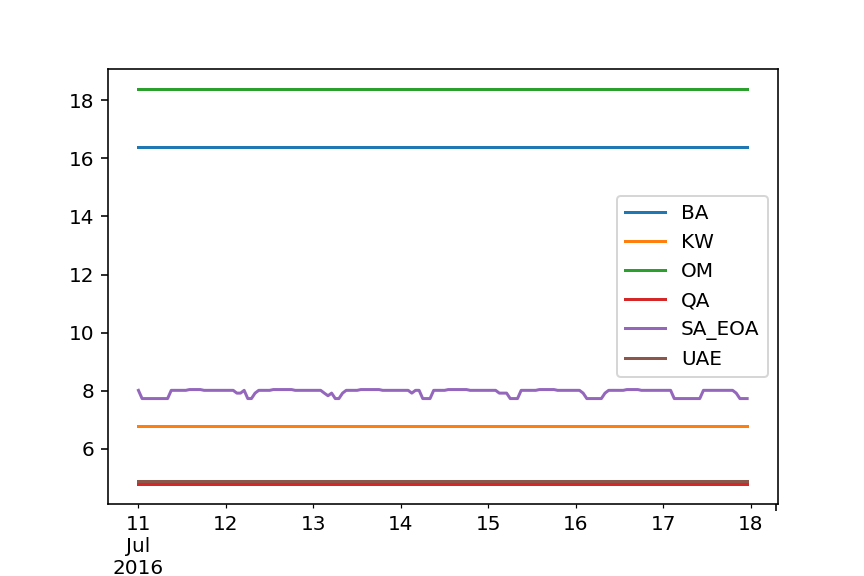

In [125]:
results_sub['NodeShadowPrice'].drop(columns=[ 'SA_RIYADH','SA_QASSIM', 'SA_HAIL',  'SA_WOA', 'SA_SOA', 'SA_NWOA', 'SA_NEOA','SA_NEOA' ]).plot()


<IPython.core.display.Javascript object>


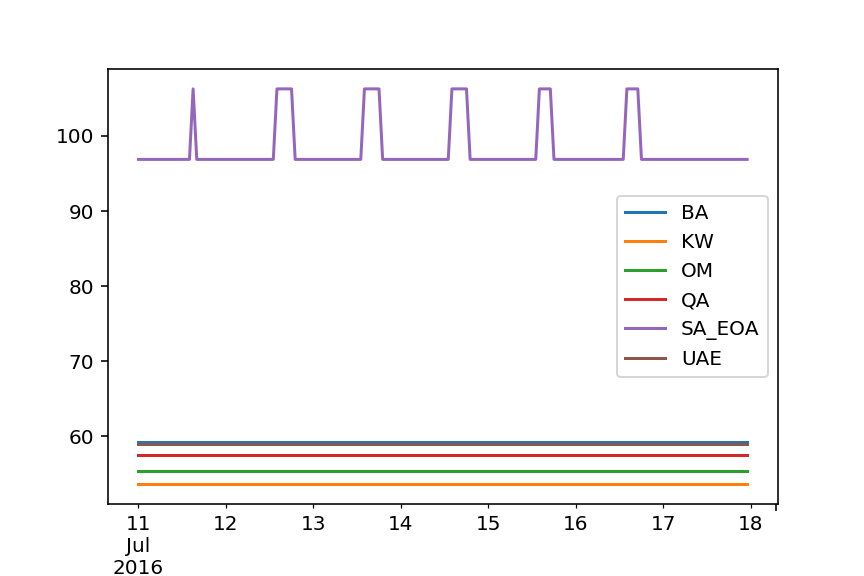

In [44]:
results_int_isolated['NodeShadowPrice'].drop(columns=[ 'SA_RIYADH','SA_QASSIM', 'SA_HAIL',  'SA_WOA', 'SA_SOA', 'SA_NWOA', 'SA_NEOA','SA_NEOA' ]).plot()


<IPython.core.display.Javascript object>


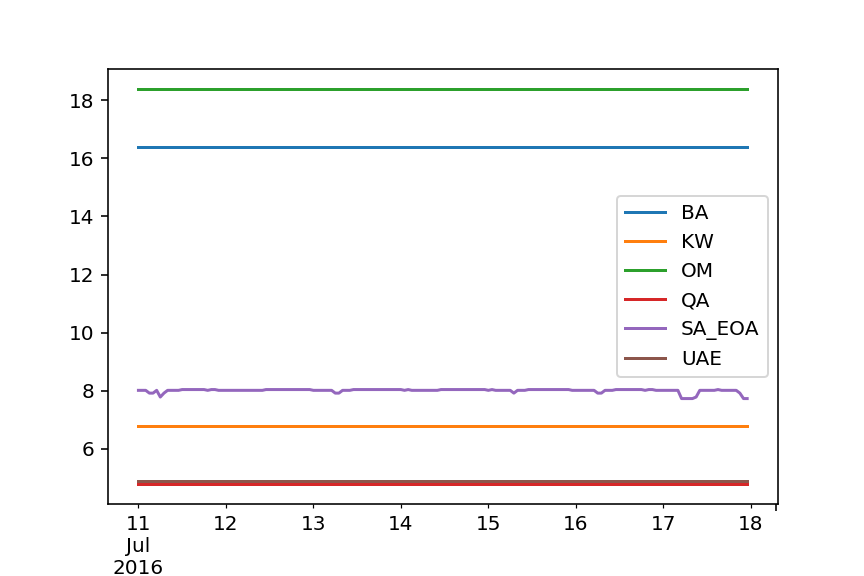

In [126]:
results_sub_isolated['NodeShadowPrice'].drop(columns=[ 'SA_RIYADH','SA_QASSIM', 'SA_HAIL',  'SA_WOA', 'SA_SOA', 'SA_NWOA', 'SA_NEOA','SA_NEOA' ]).plot()



In [128]:
PPindicators_int = post.get_indicators_powerplant(inputs_int,results_int)
PPindicators_int.head(5)

,PowerCapacity,Zone,Technology,Fuel,startups,CF,Generation
"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] - SA_EOA - STUR - GAS -",6876.00000,SA_EOA,STUR,GAS,0,1.000000,1.155168e+06
"[12, 13, 14, 15, 16, ... _EOA - GTUR - GAS -",5700.15305,SA_EOA,GTUR,GAS,0,0.000877,8.400000e+02
"[30, 31, 32, 33, 34, 35] - SA_EOA - COMC - GAS -",3990.00000,SA_EOA,COMC,GAS,0,1.000000,6.703200e+05
"[58, 59, 60, 61, 62, 63] - SA_EOA - GTUR - DSL -",121.60000,SA_EOA,GTUR,DSL,0,0.041118,8.400000e+02
"[105, 106, 107, 108, ... _EOA - ICEN - GAS -",11700.00000,SA_EOA,ICEN,GAS,0,0.839632,1.650381e+06


In [127]:
PPindicators_sub = post.get_indicators_powerplant(inputs_sub,results_sub)
PPindicators_sub.head(5)

,PowerCapacity,Zone,Technology,Fuel,startups,CF,Generation
"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] - SA_EOA - STUR - GAS -",6876.00000,SA_EOA,STUR,GAS,0,1.000000,1.155168e+06
"[12, 13, 14, 15, 16, ... _EOA - GTUR - GAS -",5700.15305,SA_EOA,GTUR,GAS,0,0.000877,8.400000e+02
"[30, 31, 32, 33, 34, 35] - SA_EOA - COMC - GAS -",3990.00000,SA_EOA,COMC,GAS,0,1.000000,6.703200e+05
"[58, 59, 60, 61, 62, 63] - SA_EOA - GTUR - DSL -",121.60000,SA_EOA,GTUR,DSL,0,0.041118,8.400000e+02
"[105, 106, 107, 108, ... _EOA - ICEN - GAS -",11700.00000,SA_EOA,ICEN,GAS,0,0.009016,1.772176e+04


In [46]:
PPindicators_int_isolated = post.get_indicators_powerplant(inputs_int_isolated,results_int_isolated)
PPindicators_int_isolated.head(5)

,PowerCapacity,Zone,Technology,Fuel,startups,CF,Generation
"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] - SA_EOA - STUR - GAS -",6876.00000,SA_EOA,STUR,GAS,0,1.000000,1.155168e+06
"[12, 13, 14, 15, 16, ... _EOA - GTUR - GAS -",5700.15305,SA_EOA,GTUR,GAS,0,0.009720,9.308072e+03
"[30, 31, 32, 33, 34, 35] - SA_EOA - COMC - GAS -",3990.00000,SA_EOA,COMC,GAS,0,1.000000,6.703200e+05
"[58, 59, 60, 61, 62, 63] - SA_EOA - GTUR - DSL -",121.60000,SA_EOA,GTUR,DSL,0,0.041118,8.400000e+02
"[105, 106, 107, 108, ... _EOA - ICEN - GAS -",11700.00000,SA_EOA,ICEN,GAS,0,0.939939,1.847544e+06


In [129]:
PPindicators_sub_isolated = post.get_indicators_powerplant(inputs_sub_isolated,results_sub_isolated)
PPindicators_sub_isolated.head(5)

,PowerCapacity,Zone,Technology,Fuel,startups,CF,Generation
"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] - SA_EOA - STUR - GAS -",6876.00000,SA_EOA,STUR,GAS,0,1.000000,1.155168e+06
"[12, 13, 14, 15, 16, ... _EOA - GTUR - GAS -",5700.15305,SA_EOA,GTUR,GAS,0,0.000877,8.400000e+02
"[30, 31, 32, 33, 34, 35] - SA_EOA - COMC - GAS -",3990.00000,SA_EOA,COMC,GAS,0,1.000000,6.703200e+05
"[58, 59, 60, 61, 62, 63] - SA_EOA - GTUR - DSL -",121.60000,SA_EOA,GTUR,DSL,0,0.041118,8.400000e+02
"[105, 106, 107, 108, ... _EOA - ICEN - GAS -",11700.00000,SA_EOA,ICEN,GAS,0,0.022278,4.378998e+04


In [48]:
fuels = PPindicators_int.Fuel.unique()
countries = PPindicators_int.Zone.unique()

GenPerCountry = pd.DataFrame(index=countries, columns=fuels)
# First make sure that all fuels are present. If not, initialize an empty series
for f in ['NUC', 'LFG', 'DSL', 'MSW', 'GAS', 'OIL', 'WST', 'SUN', 'WIN', 'FlowIn', 'HFO']:
    if f not in GenPerCountry:
        GenPerCountry[f] = 0
for c in countries:
    for f in fuels:
        tmp = PPindicators_int[(PPindicators_int.Fuel == f) & (PPindicators_int.Zone == c)]
        GenPerCountry.loc[c, f] = tmp.Generation.sum()
    NetImports = post.get_imports(results_int['PowerFlow'], c)
    if NetImports > 0:
        GenPerCountry.loc[c, 'FlowIn'] = NetImports
GenPerCountry_int = GenPerCountry
A = GenPerCountry_int.drop(['BA','KW','OM','QA','UAE']).sum()
A.name = 'KSA'
GenPerCountry_int = GenPerCountry_int.append(A, ignore_index=False)
GenPerCountry_int

,GAS,DSL,SUN,OIL,HFO,LFG,MSW,WIN,NUC,WST,FlowIn
SA_EOA,3.47671e+06,840,266.102,0,0.0,0,0,0,0.0,0.0,0.000000e+00
SA_HAIL,0,0,0,117158,0.0,0,0,0,0.0,0.0,4.078117e+04
SA_NEOA,0,16199.7,0,54984.3,0.0,0,0,0,0.0,0.0,1.344000e+05
SA_NWOA,0,5458.58,27.8773,170283,0.0,0,0,0,0.0,0.0,0.000000e+00
SA_QASSIM,0,1344,0,3696,0.0,0,0,0,0.0,0.0,3.993484e+05
SA_RIYADH,1.7869e+06,840,295.601,31920,0.0,0,0,0,0.0,0.0,3.335687e+05
SA_SOA,338567,1008,12.6715,202403,0.0,0,0,0,0.0,0.0,3.207708e+05
SA_WOA,487200,840,241.519,570246,1623888.0,0,0,0,0.0,0.0,0.000000e+00
BA,261209,0,152.058,0,0.0,0,0,0,0.0,0.0,2.011483e+05
KW,2.17425e+06,0,430.832,12478.1,0.0,0,0,0,0.0,0.0,0.000000e+00


In [130]:
fuels = PPindicators_sub.Fuel.unique()
countries = PPindicators_sub.Zone.unique()

GenPerCountry = pd.DataFrame(index=countries, columns=fuels)
# First make sure that all fuels are present. If not, initialize an empty series
for f in ['NUC', 'LFG', 'DSL', 'MSW', 'GAS', 'OIL', 'WST', 'SUN', 'WIN', 'FlowIn', 'HFO']:
    if f not in GenPerCountry:
        GenPerCountry[f] = 0
for c in countries:
    for f in fuels:
        tmp = PPindicators_sub[(PPindicators_sub.Fuel == f) & (PPindicators_int.Zone == c)]
        GenPerCountry.loc[c, f] = tmp.Generation.sum()
    NetImports = post.get_imports(results_sub['PowerFlow'], c)
    if NetImports > 0:
        GenPerCountry.loc[c, 'FlowIn'] = NetImports
GenPerCountry_sub = GenPerCountry
A = GenPerCountry_sub.drop(['BA','KW','OM','QA','UAE']).sum()
A.name = 'KSA'
GenPerCountry_sub = GenPerCountry_sub.append(A, ignore_index=False)
GenPerCountry_sub

,GAS,DSL,SUN,OIL,HFO,LFG,MSW,WIN,NUC,WST,FlowIn
SA_EOA,1.84405e+06,840,266.102,0,0.0,0,0,0,0.0,0.0,1.047090e+06
SA_HAIL,0,0,0,111500,0.0,0,0,0,0.0,0.0,4.643871e+04
SA_NEOA,0,59211.4,0,13496.8,0.0,0,0,0,0.0,0.0,1.328758e+05
SA_NWOA,0,13595.7,27.8773,162146,0.0,0,0,0,0.0,0.0,0.000000e+00
SA_QASSIM,0,1344,0,3696,0.0,0,0,0,0.0,0.0,3.993484e+05
SA_RIYADH,1.75718e+06,840,295.601,1.48352e+06,0.0,0,0,0,0.0,0.0,0.000000e+00
SA_SOA,6801.69,516339,12.6715,209508,0.0,0,0,0,0.0,0.0,1.300999e+05
SA_WOA,16700.7,337860,241.519,746437,1623888.0,0,0,0,0.0,0.0,0.000000e+00
BA,233877,0,152.058,0,0.0,0,0,0,0.0,0.0,2.284800e+05
KW,12123.4,0,430.832,2.18345e+06,0.0,0,0,0,0.0,0.0,0.000000e+00


In [49]:
fuels = PPindicators_int_isolated.Fuel.unique()
countries = PPindicators_int_isolated.Zone.unique()

GenPerCountry = pd.DataFrame(index=countries, columns=fuels)
# First make sure that all fuels are present. If not, initialize an empty series
for f in ['NUC', 'LFG', 'DSL', 'MSW', 'GAS', 'OIL', 'WST', 'SUN', 'WIN', 'FlowIn', 'HFO']:
    if f not in GenPerCountry:
        GenPerCountry[f] = 0
for c in countries:
    for f in fuels:
        tmp = PPindicators_int_isolated[(PPindicators_int_isolated.Fuel == f) & (PPindicators_int_isolated.Zone == c)]
        GenPerCountry.loc[c, f] = tmp.Generation.sum()
    NetImports = post.get_imports(results_int_isolated['PowerFlow'], c)
    if NetImports > 0:
        GenPerCountry.loc[c, 'FlowIn'] = NetImports
GenPerCountry_int_isolated = GenPerCountry
A = GenPerCountry_int_isolated.drop(['BA','KW','OM','QA','UAE']).sum()
A.name = 'KSA'
GenPerCountry_int_isolated = GenPerCountry_int_isolated.append(A, ignore_index=False)
GenPerCountry_int_isolated

,GAS,DSL,SUN,OIL,HFO,LFG,MSW,WIN,NUC,WST,FlowIn
SA_EOA,3.68234e+06,840,266.102,0,0.0,0,0,0,0.0,0.0,0.000000e+00
SA_HAIL,0,0,0,117158,0.0,0,0,0,0.0,0.0,4.078117e+04
SA_NEOA,0,16199.7,0,54984.3,0.0,0,0,0,0.0,0.0,1.344000e+05
SA_NWOA,0,5458.58,27.8773,170283,0.0,0,0,0,0.0,0.0,0.000000e+00
SA_QASSIM,0,1344,0,3696,0.0,0,0,0,0.0,0.0,3.993484e+05
SA_RIYADH,1.88367e+06,840,295.601,31920,0.0,0,0,0,0.0,0.0,2.368002e+05
SA_SOA,338567,1008,12.6715,202403,0.0,0,0,0,0.0,0.0,3.207708e+05
SA_WOA,487200,840,241.519,570246,1623888.0,0,0,0,0.0,0.0,0.000000e+00
BA,462357,0,152.058,0,0.0,0,0,0,0.0,0.0,0.000000e+00
KW,1.9227e+06,0,430.832,12478.1,0.0,0,0,0,0.0,0.0,0.000000e+00


In [131]:
fuels = PPindicators_sub_isolated.Fuel.unique()
countries = PPindicators_sub_isolated.Zone.unique()

GenPerCountry = pd.DataFrame(index=countries, columns=fuels)
# First make sure that all fuels are present. If not, initialize an empty series
for f in ['NUC', 'LFG', 'DSL', 'MSW', 'GAS', 'OIL', 'WST', 'SUN', 'WIN', 'FlowIn', 'HFO']:
    if f not in GenPerCountry:
        GenPerCountry[f] = 0
for c in countries:
    for f in fuels:
        tmp = PPindicators_sub_isolated[(PPindicators_sub_isolated.Fuel == f) & (PPindicators_sub_isolated.Zone == c)]
        GenPerCountry.loc[c, f] = tmp.Generation.sum()
    NetImports = post.get_imports(results_sub_isolated['PowerFlow'], c)
    if NetImports > 0:
        GenPerCountry.loc[c, 'FlowIn'] = NetImports
GenPerCountry_sub_isolated = GenPerCountry
A = GenPerCountry_sub_isolated.drop(['BA','KW','OM','QA','UAE']).sum()
A.name = 'KSA'
GenPerCountry_sub_isolated = GenPerCountry_sub_isolated.append(A, ignore_index=False)
GenPerCountry_sub_isolated

,GAS,DSL,SUN,OIL,HFO,LFG,MSW,WIN,NUC,WST,FlowIn
SA_EOA,1.87012e+06,840,266.102,0,0.0,0,0,0,0.0,0.0,1.021022e+06
SA_HAIL,0,0,0,132491,0.0,0,0,0,0.0,0.0,2.544730e+04
SA_NEOA,0,60411.3,0,13496.8,0.0,0,0,0,0.0,0.0,1.316758e+05
SA_NWOA,0,13595.7,27.8773,162146,0.0,0,0,0,0.0,0.0,0.000000e+00
SA_QASSIM,0,1344,0,3696,0.0,0,0,0,0.0,0.0,3.993484e+05
SA_RIYADH,1.83422e+06,840,295.601,1.48352e+06,0.0,0,0,0,0.0,0.0,0.000000e+00
SA_SOA,11955.6,516339,12.6715,209508,0.0,0,0,0,0.0,0.0,1.249459e+05
SA_WOA,14901.5,342279,241.519,897287,1623888.0,0,0,0,0.0,0.0,0.000000e+00
BA,462357,0,152.058,0,0.0,0,0,0,0.0,0.0,0.000000e+00
KW,12123.4,0,430.832,1.92305e+06,0.0,0,0,0,0.0,0.0,0.000000e+00


In [50]:
# With Trade - Without Trade (The change due to trade: '+':increase ,,, '-':decrease)
GenPerCountry_diff = GenPerCountry_int - GenPerCountry_int_isolated
GenPerCountry_diff.drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])

,GAS,DSL,SUN,OIL,HFO,LFG,MSW,WIN,NUC,WST,FlowIn
BA,-201148,0,0,0,0.0,0,0,0,0.0,0.0,201148.274198
KW,251548,0,0,0,0.0,0,0,0,0.0,0.0,0.000000
OM,67200,0,0,0,0.0,0,0,0,0.0,0.0,0.000000
QA,252000,0,0,0,0.0,0,0,0,0.0,0.0,0.000000
UAE,-67200,0,0,0,0.0,0,0,0,0.0,0.0,67200.000000
KSA,-302400,0,0,0,0.0,0,0,0,0.0,0.0,96768.483944


In [132]:
# With Trade - Without Trade (The change due to trade: '+':increase ,,, '-':decrease)
GenPerCountry_diff = GenPerCountry_sub - GenPerCountry_sub_isolated
GenPerCountry_diff.drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])

,GAS,DSL,SUN,OIL,HFO,LFG,MSW,WIN,NUC,WST,FlowIn
BA,-228480,0,0,0,0.0,0,0,0,0.0,0.0,228480.000000
KW,0,0,0,260400,0.0,0,0,0,0.0,0.0,0.000000
OM,-67200,0,0,0,0.0,0,0,0,0.0,0.0,67200.000000
QA,252000,0,0,0,0.0,0,0,0,0.0,0.0,0.000000
UAE,67200,0,0,0,0.0,0,0,0,0.0,0.0,0.000000
KSA,-106460,-5618.83,0,-171841,0.0,0,0,0,0.0,0.0,53413.483922


In [51]:
# With Trade - Without Trade (The change due to trade: '+':increase ,,, '-':decrease)  [in Millions $]
(SystemCost_int - SystemCost_int_isolated).drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])

,SystemCost
BA,-13.181925
KW,14.923296
OM,4.121042
QA,16.048845
UAE,-4.384355
KSA,-32.499050


In [133]:
# With Trade - Without Trade (The change due to trade: '+':increase ,,, '-':decrease)  [in Millions $]
(SystemCost_sub - SystemCost_sub_isolated).drop(['SA_EOA','SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])

,SystemCost
BA,-4.140781
KW,1.957578
OM,-1.367602
QA,1.331486
UAE,0.363746
KSA,-2.506782


In [52]:
#Total output system cost in Millions $ 
((results_int['TotalNodeOperationCost'].sum())/(1000000)).drop(['BA','KW','OM','QA','UAE'])
(results_int['TotalNodeOperationCost'].sum())/(1000000)
#Total output system cost in Millions $ 
KSA_Cost_int = (results_int['TotalNodeOperationCost'].sum()['SA_EOA']+results_int['TotalNodeOperationCost'].sum()['SA_HAIL']+results_int['TotalNodeOperationCost'].sum()['SA_NEOA']+results_int['TotalNodeOperationCost'].sum()['SA_NWOA']+results_int['TotalNodeOperationCost'].sum()['SA_QASSIM']+results_int['TotalNodeOperationCost'].sum()['SA_RIYADH']+results_int['TotalNodeOperationCost'].sum()['SA_SOA']+results_int['TotalNodeOperationCost'].sum()['SA_WOA'])
KSA_Cost_int/(1000000)

#Total output system cost in Millions $ 
(results_int_isolated['TotalNodeOperationCost'].sum())/(1000000)
#Total output system cost in Millions $ 
KSA_Cost_int_isolated = (results_int_isolated['TotalNodeOperationCost'].sum()['SA_EOA']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_HAIL']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_NEOA']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_NWOA']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_QASSIM']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_RIYADH']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_SOA']+results_int_isolated['TotalNodeOperationCost'].sum()['SA_WOA'])
KSA_Cost_int_isolated/(1000000)

1078.6744107400095

In [134]:
#Total output system cost in Millions $ 
((results_sub['TotalNodeOperationCost'].sum())/(1000000)).drop(['BA','KW','OM','QA','UAE'])
(results_sub['TotalNodeOperationCost'].sum())/(1000000)
#Total output system cost in Millions $ 
KSA_Cost_sub = (results_int['TotalNodeOperationCost'].sum()['SA_EOA']+results_sub['TotalNodeOperationCost'].sum()['SA_HAIL']+results_sub['TotalNodeOperationCost'].sum()['SA_NEOA']+results_sub['TotalNodeOperationCost'].sum()['SA_NWOA']+results_sub['TotalNodeOperationCost'].sum()['SA_QASSIM']+results_sub['TotalNodeOperationCost'].sum()['SA_RIYADH']+results_sub['TotalNodeOperationCost'].sum()['SA_SOA']+results_sub['TotalNodeOperationCost'].sum()['SA_WOA'])
KSA_Cost_sub/(1000000)

#Total output system cost in Millions $ 
(results_sub_isolated['TotalNodeOperationCost'].sum())/(1000000)
#Total output system cost in Millions $ 
KSA_Cost_sub_isolated = (results_sub_isolated['TotalNodeOperationCost'].sum()['SA_EOA']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_HAIL']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_NEOA']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_NWOA']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_QASSIM']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_RIYADH']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_SOA']+results_sub_isolated['TotalNodeOperationCost'].sum()['SA_WOA'])
KSA_Cost_sub_isolated/(1000000)

63.27587062859963

<IPython.core.display.Javascript object>


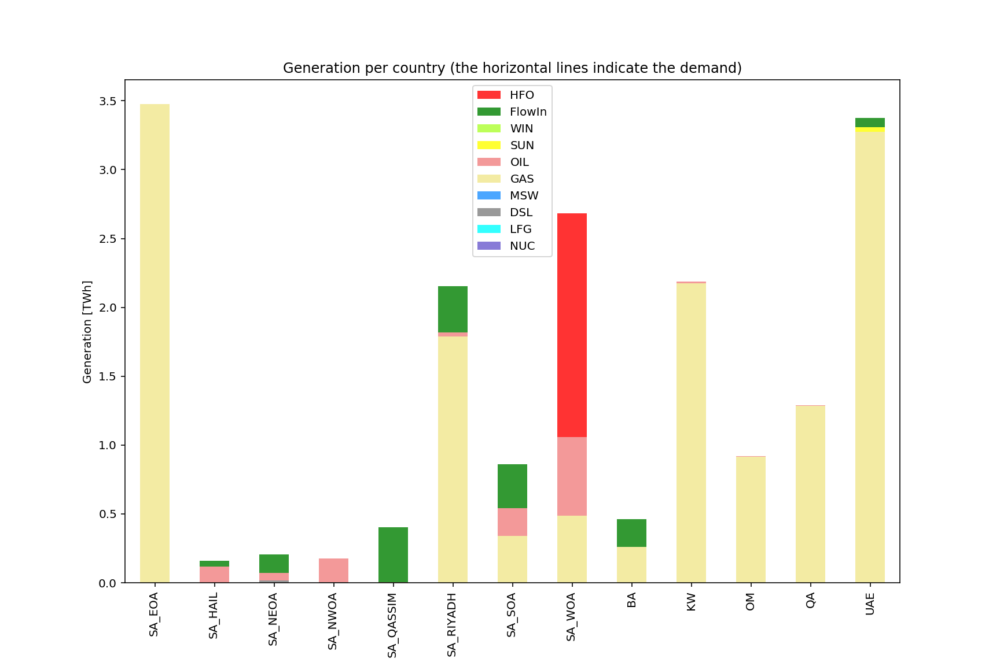

In [53]:
#Plots the generation for each country, disaggregated by fuel type
ax = ds.plot_energy_country_fuel(datain_int,results_int,PPindicators_int)

<IPython.core.display.Javascript object>


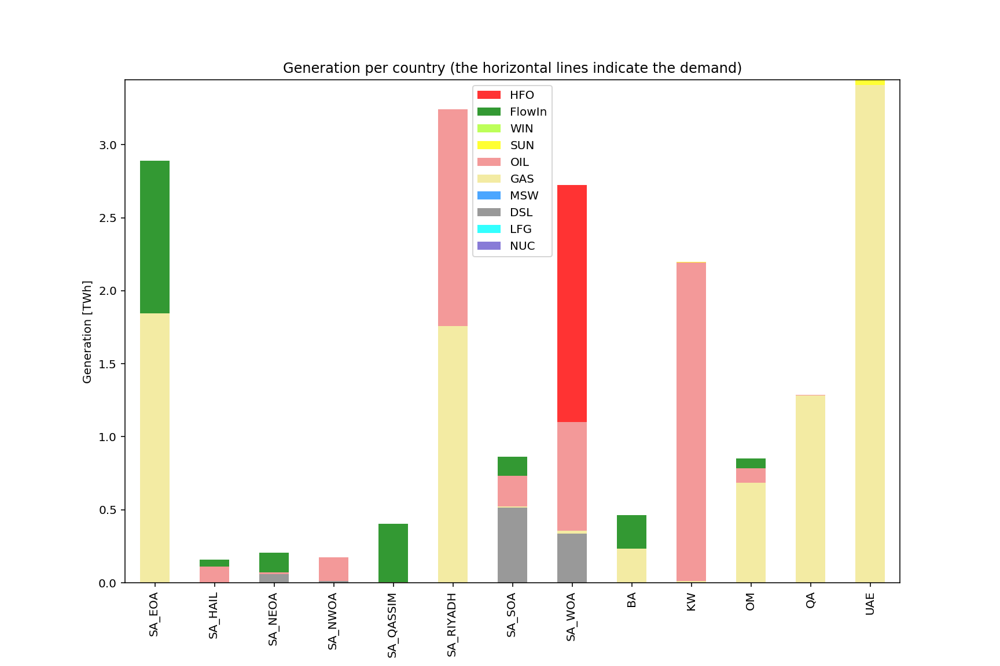

In [135]:
#Plots the generation for each country, disaggregated by fuel type
ax = ds.plot_energy_country_fuel(datain_sub,results_sub,PPindicators_sub)

<IPython.core.display.Javascript object>


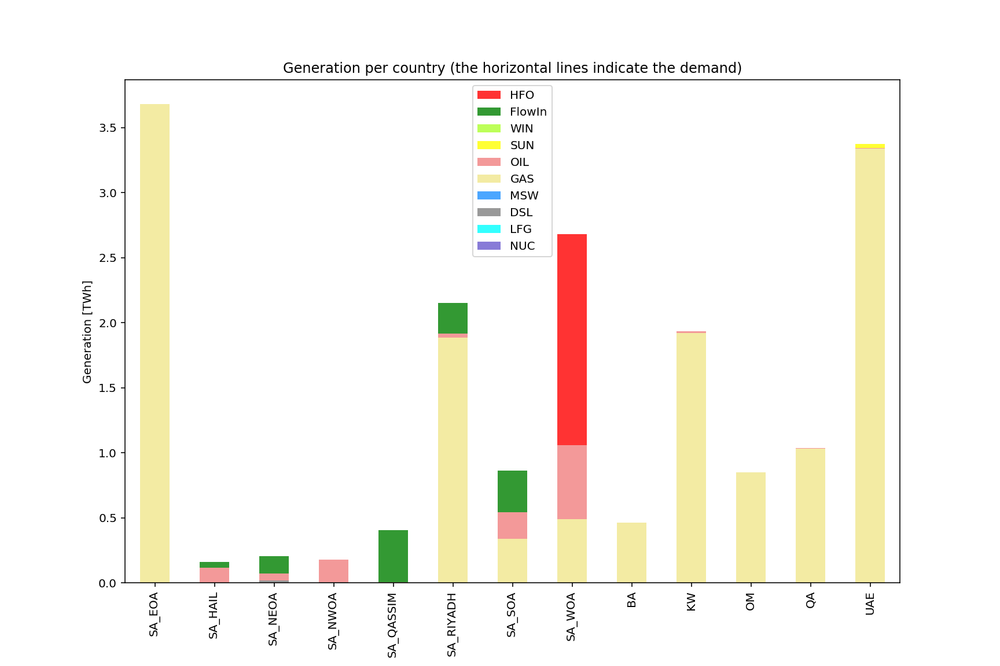

In [54]:
#Plots the generation for each country, disaggregated by fuel type
ax = ds.plot_energy_country_fuel(datain_int_isolated,results_int_isolated,PPindicators_int_isolated)

<IPython.core.display.Javascript object>


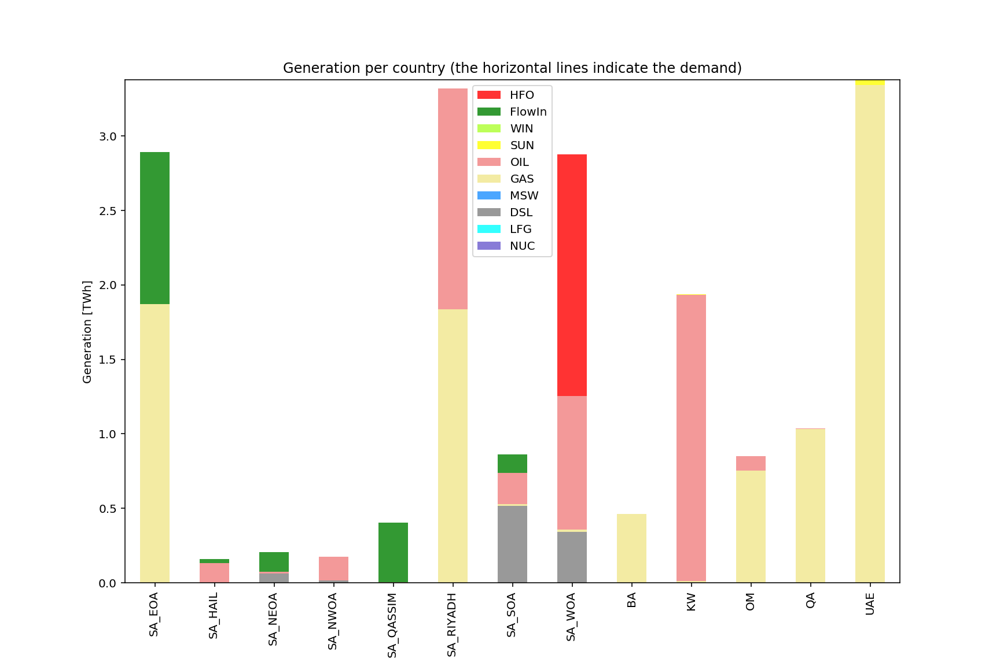

In [137]:
#Plots the generation for each country, disaggregated by fuel type
ax = ds.plot_energy_country_fuel(datain_sub_isolated,results_sub_isolated,PPindicators_sub_isolated)

In [55]:
# Function that determines generation self sufficiency of each country by computing (local generation - local demand)
post.Local_generation_minus_demand(inputs_int, results_int).head(5)

,SA_EOA,SA_RIYADH,SA_QASSIM,SA_HAIL,SA_WOA,SA_SOA,SA_NWOA,SA_NEOA,OM,KW,BA,QA,UAE
2016-07-11 00:00:00,2728.65599,-1228.65599,-2227.921,-32.831732,1493.640955,-1732.888222,0.0,-800.0,400.0,1550.0,-1250.0,1500.0,-400.0
2016-07-11 01:00:00,2606.22099,-1106.22099,-2205.692,-414.709778,1892.401000,-1771.999222,0.0,-800.0,400.0,1550.0,-1250.0,1500.0,-400.0
2016-07-11 02:00:00,2467.91199,-967.91199,-2180.589,-374.182778,1909.495000,-1854.723222,0.0,-800.0,400.0,1550.0,-1250.0,1500.0,-400.0
2016-07-11 03:00:00,2309.31199,-809.31199,-2151.673,-774.913778,2115.787000,-1689.200222,0.0,-800.0,400.0,1550.0,-1250.0,1500.0,-400.0
2016-07-11 04:00:00,2234.45099,-734.45099,-2138.042,-596.577778,2038.797000,-1804.177222,0.0,-800.0,400.0,1550.0,-1250.0,1500.0,-400.0


In [138]:
# Function that determines generation self sufficiency of each country by computing (local generation - local demand)
post.Local_generation_minus_demand(inputs_sub, results_sub).head(5)

,SA_EOA,SA_RIYADH,SA_QASSIM,SA_HAIL,SA_WOA,SA_SOA,SA_NWOA,SA_NEOA,OM,KW,BA,QA,UAE
2016-07-11 00:00:00,-5477.880471,6147.418510,-2227.921,-32.831732,1308.194085,-659.698392,0.0,-747.281,-400.0,1550.0,-1360.0,1500.0,400.0
2016-07-11 01:00:00,-5477.518471,7087.518471,-2205.692,-794.229127,1131.848520,-698.809392,0.0,-733.118,-400.0,1550.0,-1360.0,1500.0,400.0
2016-07-11 02:00:00,-5508.689471,7118.689471,-2180.589,-769.727127,1148.942520,-781.533392,0.0,-717.093,-400.0,1550.0,-1360.0,1500.0,400.0
2016-07-11 03:00:00,-5315.997471,6925.997471,-2151.673,-817.574000,1085.257392,-616.010392,0.0,-800.000,-400.0,1550.0,-1360.0,1500.0,400.0
2016-07-11 04:00:00,-5383.281471,6993.281471,-2138.042,-811.725000,1180.754392,-730.987392,0.0,-800.000,-400.0,1550.0,-1360.0,1500.0,400.0


In [56]:
# Function that determines generation self sufficiency of each country by computing (local generation - local demand)
post.Local_generation_minus_demand(inputs_int_isolated, results_int_isolated).head(5)

,SA_EOA,SA_RIYADH,SA_QASSIM,SA_HAIL,SA_WOA,SA_SOA,SA_NWOA,SA_NEOA,OM,KW,BA,QA,UAE
2016-07-11 00:00:00,4528.65599,-1228.65599,-2227.921,-32.831732,1493.640955,-1732.888222,0.0,-800.0,0.0,0.0,0.0,0.0,0.0
2016-07-11 01:00:00,4406.22099,-1106.22099,-2205.692,-414.709778,1892.401000,-1771.999222,0.0,-800.0,0.0,0.0,0.0,0.0,0.0
2016-07-11 02:00:00,4267.91199,-967.91199,-2180.589,-374.182778,1909.495000,-1854.723222,0.0,-800.0,0.0,0.0,0.0,0.0,0.0
2016-07-11 03:00:00,4109.31199,-809.31199,-2151.673,-774.913778,2115.787000,-1689.200222,0.0,-800.0,0.0,0.0,0.0,0.0,0.0
2016-07-11 04:00:00,4034.45099,-734.45099,-2138.042,-596.577778,2038.797000,-1804.177222,0.0,-800.0,0.0,0.0,0.0,0.0,0.0


In [139]:
# Function that determines generation self sufficiency of each country by computing (local generation - local demand)
post.Local_generation_minus_demand(inputs_sub_isolated, results_sub_isolated).head(5)

,SA_EOA,SA_RIYADH,SA_QASSIM,SA_HAIL,SA_WOA,SA_SOA,SA_NWOA,SA_NEOA,OM,KW,BA,QA,UAE
2016-07-11 00:00:00,-5477.880471,6147.41851,-2227.921,-32.831732,2998.194085,-659.698392,0.0,-747.281,0.0,0.0,0.0,0.0,0.0
2016-07-11 01:00:00,-5477.518471,7541.85351,-2205.692,-23.211732,1596.496085,-698.809392,0.0,-733.118,0.0,0.0,0.0,0.0,0.0
2016-07-11 02:00:00,-5508.689471,7680.16251,-2180.589,-12.336732,1520.079085,-781.533392,0.0,-717.093,0.0,0.0,0.0,0.0,0.0
2016-07-11 03:00:00,-5315.997471,7838.76251,-2151.673,-411.179167,1355.234520,-616.010392,0.0,-699.137,0.0,0.0,0.0,0.0,0.0
2016-07-11 04:00:00,-5383.281471,7913.62351,-2138.042,-248.952167,1278.244520,-730.987392,0.0,-690.605,0.0,0.0,0.0,0.0,0.0


In [57]:
# Function that computes the generation cost for each zone at each instant of time
# Generation cost includes: CostFixed + CostStartUp + CostShutDown + CostRampUp + CostRampDown + CostVariable
post.get_nodes_generation_cost(inputs_int, results_int).head(5)

,SA_EOA,SA_RIYADH,SA_QASSIM,SA_HAIL,SA_WOA,SA_SOA,SA_NWOA,SA_NEOA,OM,KW,BA,QA,UAE
2016-07-11 00:00:00,1.580676e+06,836376.856486,7537.804757,244218.541514,1.911438e+06,589145.877933,178451.651369,107944.948045,367886.818669,712668.866488,93438.058692,439610.171030,1.092593e+06
2016-07-11 01:00:00,1.567767e+06,836376.856486,7537.804757,94191.159291,1.968926e+06,448208.794877,178446.193712,75738.250219,331145.538222,699995.050773,94386.461742,432449.501861,1.057216e+06
2016-07-11 02:00:00,1.557388e+06,836376.856486,7537.804757,102858.964347,1.951572e+06,448208.794877,184213.996124,71879.399391,325026.307639,684395.683418,92679.895871,426495.324862,1.026255e+06
2016-07-11 03:00:00,1.523358e+06,836376.856486,7537.804757,14127.669324,1.951572e+06,448208.794877,184208.350272,67555.560049,318604.441196,671331.508172,89686.929670,418855.167155,9.991726e+05
2016-07-11 04:00:00,1.522624e+06,836376.856486,7537.804757,64548.676028,1.951572e+06,448208.794877,181384.859683,65501.038035,311353.928944,660191.247752,86676.194028,417979.078853,9.734380e+05


In [140]:
# Function that computes the generation cost for each zone at each instant of time
# Generation cost includes: CostFixed + CostStartUp + CostShutDown + CostRampUp + CostRampDown + CostVariable
post.get_nodes_generation_cost(inputs_sub, results_sub).head(5)

,SA_EOA,SA_RIYADH,SA_QASSIM,SA_HAIL,SA_WOA,SA_SOA,SA_NWOA,SA_NEOA,OM,KW,BA,QA,UAE
2016-07-11 00:00:00,65004.273361,365056.600748,266.328486,74949.786669,389191.385211,31356.511409,6651.161377,38067.727438,121492.319028,89170.368858,24038.328800,36296.493323,94560.170173
2016-07-11 01:00:00,65004.273361,188954.302304,266.328486,566.500982,85365.195656,31356.511409,6650.954519,2996.602615,87527.449631,87564.382038,24765.620246,35702.411257,91625.133094
2016-07-11 02:00:00,65004.273361,125126.491921,266.328486,1812.399651,68011.282613,31356.511409,6869.568006,2996.602615,85496.731517,85587.678342,23828.659878,35208.425334,89056.401569
2016-07-11 03:00:00,65004.273361,122412.206001,266.328486,197.853477,65910.936400,31356.511409,6869.354014,2207.444216,83365.581149,83932.226367,23000.959048,34574.562692,86809.546040
2016-07-11 04:00:00,65004.273361,122353.661701,266.328486,197.853477,91215.077328,31356.511409,6762.336978,2140.689317,80959.437703,82520.566942,22168.344103,34501.878375,84674.488169


In [58]:
# Function that computes the generation cost for each zone at each instant of time
# Generation cost includes: CostFixed + CostStartUp + CostShutDown + CostRampUp + CostRampDown + CostVariable
post.get_nodes_generation_cost(inputs_int_isolated, results_int_isolated).head(5)

,SA_EOA,SA_RIYADH,SA_QASSIM,SA_HAIL,SA_WOA,SA_SOA,SA_NWOA,SA_NEOA,OM,KW,BA,QA,UAE
2016-07-11 00:00:00,1.755047e+06,836376.856486,7537.804757,244218.541514,1.911438e+06,589145.877933,178451.651369,107944.948045,345715.693368,629556.604010,167477.396730,353267.697136,1.116181e+06
2016-07-11 01:00:00,1.742138e+06,836376.856486,7537.804757,94191.159291,1.968926e+06,448208.794877,178446.193712,75738.250219,308974.412921,616882.788295,168425.799779,346107.027967,1.080804e+06
2016-07-11 02:00:00,1.731759e+06,836376.856486,7537.804757,102858.964347,1.951572e+06,448208.794877,184213.996124,71879.399391,302855.182338,601283.420940,166719.233908,340152.850968,1.049842e+06
2016-07-11 03:00:00,1.697729e+06,836376.856486,7537.804757,14127.669324,1.951572e+06,448208.794877,184208.350272,67555.560049,296433.315895,588219.245695,163726.267708,332512.693261,1.022760e+06
2016-07-11 04:00:00,1.696995e+06,836376.856486,7537.804757,64548.676028,1.951572e+06,448208.794877,181384.859683,65501.038035,289182.803643,577078.985274,160715.532066,331636.604959,9.970258e+05


In [141]:
# Function that computes the generation cost for each zone at each instant of time
# Generation cost includes: CostFixed + CostStartUp + CostShutDown + CostRampUp + CostRampDown + CostVariable
post.get_nodes_generation_cost(inputs_sub_isolated, results_sub_isolated).head(5)

,SA_EOA,SA_RIYADH,SA_QASSIM,SA_HAIL,SA_WOA,SA_SOA,SA_NWOA,SA_NEOA,OM,KW,BA,QA,UAE
2016-07-11 00:00:00,65004.273361,179202.474883,266.328486,74949.786669,568391.170078,31356.511409,6651.161377,38067.727438,128849.993353,78638.639417,46315.651748,29133.124362,92603.222477
2016-07-11 01:00:00,65004.273361,192464.758562,266.328486,6668.439883,89086.866434,31356.511409,6650.954519,2996.602615,94885.123956,77032.652597,47042.943194,28539.042296,89668.185398
2016-07-11 02:00:00,65004.273361,129464.758562,266.328486,6668.439883,70983.961721,31356.511409,6869.568006,2996.602615,92854.405842,75055.948901,46105.982826,28045.056373,87099.453873
2016-07-11 03:00:00,65004.273361,129464.758562,266.328486,3414.118712,68011.282613,31356.511409,6869.354014,2996.602615,90723.255474,73400.496927,45278.281996,27411.193731,84852.598344
2016-07-11 04:00:00,65004.273361,129464.758562,266.328486,17711.553371,68011.282613,31356.511409,6762.336978,2996.602615,88317.112028,71988.837502,44445.667051,27338.509414,82717.540474


In [59]:
#Function that computes the balance of the imports/exports of a given zone
# (NetImports)
post.get_imports(results_int['PowerFlow'], 'QA')

-252000.0

In [142]:
#Function that computes the balance of the imports/exports of a given zone
# (NetImports)
post.get_imports(results_sub['PowerFlow'], 'QA')

-252000.0

In [60]:
#Function that computes the balance of the imports/exports of a given zone
# (NetImports)
post.get_imports(results_int_isolated['PowerFlow'], 'QA')

0

In [143]:
#Function that computes the balance of the imports/exports of a given zone
# (NetImports)
post.get_imports(results_sub_isolated['PowerFlow'], 'QA')

0

In [61]:
#This function filters the dispaset Output Power dataframe by country
post.filter_by_country(results_int['UnitOutputPower'], inputs_int, 'QA').head(5)

,"[894, 895, 896, 897, 898] - QA - PHOT - SUN -","[899, 901, 903, 904, ... - QA - COMC - GAS -",[900] - Mesaieed Black Start Power Plant,[902] - Qatalum IC Power Plant,[910] - Ras Abu Fontas - B1 Power Plant
2016-07-11 00:00:00,0.0,7409.987232,11.278711,11.54972,92.654337
2016-07-11 01:00:00,0.0,7285.587232,11.278711,11.54972,92.654337
2016-07-11 02:00:00,0.0,7182.147232,11.278711,11.54972,92.654337
2016-07-11 03:00:00,0.0,7049.417232,11.278711,11.54972,92.654337
2016-07-11 04:00:00,0.0,7034.197232,11.278711,11.54972,92.654337


In [144]:
#This function filters the dispaset Output Power dataframe by country
post.filter_by_country(results_sub['UnitOutputPower'], inputs_sub, 'QA').head(5)

,"[894, 895, 896, 897, 898] - QA - PHOT - SUN -","[899, 901, 903, 904, ... - QA - COMC - GAS -",[900] - Mesaieed Black Start Power Plant,[902] - Qatalum IC Power Plant,[910] - Ras Abu Fontas - B1 Power Plant
2016-07-11 00:00:00,0.0,7409.987232,11.278711,11.54972,92.654337
2016-07-11 01:00:00,0.0,7285.587232,11.278711,11.54972,92.654337
2016-07-11 02:00:00,0.0,7182.147232,11.278711,11.54972,92.654337
2016-07-11 03:00:00,0.0,7049.417232,11.278711,11.54972,92.654337
2016-07-11 04:00:00,0.0,7034.197232,11.278711,11.54972,92.654337


In [62]:
#This function filters the dispaset Output Power dataframe by country
post.filter_by_country(results_int_isolated['UnitOutputPower'], inputs_int_isolated, 'QA').head(5)

,"[894, 895, 896, 897, 898] - QA - PHOT - SUN -","[899, 901, 903, 904, ... - QA - COMC - GAS -",[900] - Mesaieed Black Start Power Plant,[902] - Qatalum IC Power Plant,[910] - Ras Abu Fontas - B1 Power Plant
2016-07-11 00:00:00,0.0,5909.987232,11.278711,11.54972,92.654337
2016-07-11 01:00:00,0.0,5785.587232,11.278711,11.54972,92.654337
2016-07-11 02:00:00,0.0,5682.147232,11.278711,11.54972,92.654337
2016-07-11 03:00:00,0.0,5549.417232,11.278711,11.54972,92.654337
2016-07-11 04:00:00,0.0,5534.197232,11.278711,11.54972,92.654337


In [145]:
#This function filters the dispaset Output Power dataframe by country
post.filter_by_country(results_sub_isolated['UnitOutputPower'], inputs_sub_isolated, 'QA').head(5)

,"[894, 895, 896, 897, 898] - QA - PHOT - SUN -","[899, 901, 903, 904, ... - QA - COMC - GAS -",[900] - Mesaieed Black Start Power Plant,[902] - Qatalum IC Power Plant,[910] - Ras Abu Fontas - B1 Power Plant
2016-07-11 00:00:00,0.0,5909.987232,11.278711,11.54972,92.654337
2016-07-11 01:00:00,0.0,5785.587232,11.278711,11.54972,92.654337
2016-07-11 02:00:00,0.0,5682.147232,11.278711,11.54972,92.654337
2016-07-11 03:00:00,0.0,5549.417232,11.278711,11.54972,92.654337
2016-07-11 04:00:00,0.0,5534.197232,11.278711,11.54972,92.654337


In [63]:
# Function that computes the operation cost for each power unit at each instant of time 
# Operation cost includes: CostFixed + CostStartUp + CostShutDown + CostRampUp + CostRampDown + CostVariable
post.get_units_operation_cost(inputs_int, results_int).head(5)

,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] - SA_EOA - STUR - GAS -","[1003, 1010, 1011, 1012, 1013] - UAE - STUR - GAS -",[1017] - Sir Bani Yas,"[105, 106, 107, 108, ... _EOA - ICEN - GAS -",[113] - Saudi Aramco North Park Project,"[114, 115, 116, 117, ... HAIL - GTUR - OIL -","[12, 13, 14, 15, 16, ... _EOA - GTUR - GAS -","[126, 127, 128, 129, ... NEOA - GTUR - OIL -","[136, 137, 138, 139, ... NEOA - GTUR - DSL -","[146, 151] - SA_NWOA - GTUR - DSL -","[147, 152] - SA_NWOA - ICEN - DSL -",[148] - Dhuba IPP 2 Power Project,[149] - Duba Gas Turbine Power Plant,[150] - Saudi Aramco Soitec Solar CPV Park,"[153, 154, 155, 156, ... SSIM - GTUR - OIL -","[180, 181, 182, 183, 184] - SA_QASSIM - GTUR - DSL -","[185, 186, 187, 188, ... YADH - GTUR - GAS -","[193, 194, 261, 262, 263, 264] - SA_RIYADH - COMC - GAS -","[195, 196, 197, 198, ... YADH - GTUR - OIL -","[235, 236, 237, 238, ... YADH - COMC - OIL -","[30, 31, 32, 33, 34, 35] - SA_EOA - COMC - GAS -","[375, 376, 377, 378, ... YADH - GTUR - DSL -","[392, 393, 394] - SA_RIYADH - ICEN - GAS -","[395, 396, 397] - SA_RIYADH - PHOT - SUN -",[398] - Solar Systems Riyadh Solar Plant,"[399, 400, 401, 402, ... _SOA - GTUR - DSL -","[409, 410, 411, 412, ... _SOA - ICEN - DSL -","[455, 456, 457, 458, ... _SOA - GTUR - OIL -","[489, 490, 491] - SA_SOA - ICEN - GAS -",[492] - Farasan Solar Park,...,[650] - Bahra Industrial Complex,"[651, 652] - BA - PHOT - SUN -","[653, 654, 655, 656, 660, 662, 663, 664] - BA - COMC - GAS -","[657, 658, 659, 661, ... - BA - GTUR - GAS -","[678, 679, 680, 681, 682] - BA - STUR - GAS -","[683, 684, 685] - KW - PHOT - SUN -","[686, 687, 688, 689, ... - KW - COMC - GAS -","[694, 701, 702, 703, ... - KW - GTUR - GAS -","[707, 708, 709, 710, ... - KW - STUR - OIL -","[759, 760, 761, 762, 763, 764, 765] - KW - GTUR - OIL -",[768] - Soitec Muscat Solar Park,"[769, 771, 792, 793, ... - OM - ICEN - OIL -","[770, 811, 812, 865, ... - OM - COMC - GAS -","[772, 773, 774, 775, ... - OM - GTUR - GAS -","[784, 785, 786, 790, 791] - OM - STUR - GAS -","[817, 818] - OM - GTUR - OIL -","[894, 895, 896, 897, 898] - QA - PHOT - SUN -","[899, 901, 903, 904, ... - QA - COMC - GAS -",[900] - Mesaieed Black Start Power Plant,[902] - Qatalum IC Power Plant,[910] - Ras Abu Fontas - B1 Power Plant,"[915, 916] - UAE - LFGG - LFG -",[917] - Abu Dhabi Waste To Energy Demonstration Plant,"[918, 919, 920] - UAE - CPV - SUN -","[921, 922, 923] - UAE - CSP - SUN -","[924, 925, 926, 927, ... UAE - PHOT - SUN -","[935, 958, 987] - UAE - ICEN - OIL -","[936, 937, 938, 939, ... UAE - GTUR - GAS -","[960, 961, 962, 963, ... UAE - COMC - GAS -",[977] - Hamriyah Oil Fired Power Plant
2016-07-11 00:00:00,530056.030117,3314.630095,0.0,803638.987837,0.0,244218.541514,531.311188,105920.501115,2024.446931,4867.815705,3032.709388,154139.786144,16411.340132,0.0,4764.017797,2773.78696,652156.839398,148707.189655,4033.56419,27526.025011,244609.014817,1407.953745,2545.284487,0.0,0.0,1136.845594,238.810743,392544.685361,195225.536236,0.0,...,0.0,0.0,92015.654060,721.083684,701.320949,0.0,697658.047092,421.258039,9081.637494,5507.923863,0.0,7.3456,364362.177108,434.468689,755.320595,2327.506676,0.0,426531.086080,2268.325752,1628.274752,9182.484446,24.181154,35.343625,0.0,0.0,0.0,509.29496,446.248014,1.087555e+06,708.851798
2016-07-11 01:00:00,530056.030117,3314.630095,0.0,790730.069261,0.0,94191.159291,531.311188,73713.803288,2024.446931,4867.815705,3032.709388,154134.328487,16411.340132,0.0,4764.017797,2773.78696,652156.839398,148707.189655,4033.56419,27526.025011,244609.014817,1407.953745,2545.284487,0.0,0.0,1136.845594,238.810743,251607.602305,195225.536236,0.0,...,0.0,0.0,92964.057109,721.083684,701.320949,0.0,684984.231376,421.258039,9081.637494,5507.923863,0.0,7.3456,327620.896661,434.468689,755.320595,2327.506676,0.0,419370.416912,2268.325752,1628.274752,9182.484446,24.181154,35.343625,0.0,0.0,0.0,509.29496,446.248014,1.052178e+06,708.851798
2016-07-11 02:00:00,530056.030117,3314.630095,0.0,780351.314664,0.

In [146]:
# Function that computes the operation cost for each power unit at each instant of time 
# Operation cost includes: CostFixed + CostStartUp + CostShutDown + CostRampUp + CostRampDown + CostVariable
post.get_units_operation_cost(inputs_sub, results_sub).head(5)

,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] - SA_EOA - STUR - GAS -","[1003, 1010, 1011, 1012, 1013] - UAE - STUR - GAS -",[1017] - Sir Bani Yas,"[105, 106, 107, 108, ... _EOA - ICEN - GAS -",[113] - Saudi Aramco North Park Project,"[114, 115, 116, 117, ... HAIL - GTUR - OIL -","[12, 13, 14, 15, 16, ... _EOA - GTUR - GAS -","[126, 127, 128, 129, ... NEOA - GTUR - OIL -","[136, 137, 138, 139, ... NEOA - GTUR - DSL -","[146, 151] - SA_NWOA - GTUR - DSL -","[147, 152] - SA_NWOA - ICEN - DSL -",[148] - Dhuba IPP 2 Power Project,[149] - Duba Gas Turbine Power Plant,[150] - Saudi Aramco Soitec Solar CPV Park,"[153, 154, 155, 156, ... SSIM - GTUR - OIL -","[180, 181, 182, 183, 184] - SA_QASSIM - GTUR - DSL -","[185, 186, 187, 188, ... YADH - GTUR - GAS -","[193, 194, 261, 262, 263, 264] - SA_RIYADH - COMC - GAS -","[195, 196, 197, 198, ... YADH - GTUR - OIL -","[235, 236, 237, 238, ... YADH - COMC - OIL -","[30, 31, 32, 33, 34, 35] - SA_EOA - COMC - GAS -","[375, 376, 377, 378, ... YADH - GTUR - DSL -","[392, 393, 394] - SA_RIYADH - ICEN - GAS -","[395, 396, 397] - SA_RIYADH - PHOT - SUN -",[398] - Solar Systems Riyadh Solar Plant,"[399, 400, 401, 402, ... _SOA - GTUR - DSL -","[409, 410, 411, 412, ... _SOA - ICEN - DSL -","[455, 456, 457, 458, ... _SOA - GTUR - OIL -","[489, 490, 491] - SA_SOA - ICEN - GAS -",[492] - Farasan Solar Park,...,[650] - Bahra Industrial Complex,"[651, 652] - BA - PHOT - SUN -","[653, 654, 655, 656, 660, 662, 663, 664] - BA - COMC - GAS -","[657, 658, 659, 661, ... - BA - GTUR - GAS -","[678, 679, 680, 681, 682] - BA - STUR - GAS -","[683, 684, 685] - KW - PHOT - SUN -","[686, 687, 688, 689, ... - KW - COMC - GAS -","[694, 701, 702, 703, ... - KW - GTUR - GAS -","[707, 708, 709, 710, ... - KW - STUR - OIL -","[759, 760, 761, 762, 763, 764, 765] - KW - GTUR - OIL -",[768] - Soitec Muscat Solar Park,"[769, 771, 792, 793, ... - OM - ICEN - OIL -","[770, 811, 812, 865, ... - OM - COMC - GAS -","[772, 773, 774, 775, ... - OM - GTUR - GAS -","[784, 785, 786, 790, 791] - OM - STUR - GAS -","[817, 818] - OM - GTUR - OIL -","[894, 895, 896, 897, 898] - QA - PHOT - SUN -","[899, 901, 903, 904, ... - QA - COMC - GAS -",[900] - Mesaieed Black Start Power Plant,[902] - Qatalum IC Power Plant,[910] - Ras Abu Fontas - B1 Power Plant,"[915, 916] - UAE - LFGG - LFG -",[917] - Abu Dhabi Waste To Energy Demonstration Plant,"[918, 919, 920] - UAE - CPV - SUN -","[921, 922, 923] - UAE - CSP - SUN -","[924, 925, 926, 927, ... UAE - PHOT - SUN -","[935, 958, 987] - UAE - ICEN - OIL -","[936, 937, 938, 939, ... UAE - GTUR - GAS -","[960, 961, 962, 963, ... UAE - COMC - GAS -",[977] - Hamriyah Oil Fired Power Plant
2016-07-11 00:00:00,43975.887446,274.996966,0.0,633.505541,0.0,74949.786669,44.080021,109.523616,37958.203822,150.504685,381.85268,5496.775025,622.028987,0.0,180.567653,85.760834,297504.129110,12337.432768,43250.807098,11709.531694,20293.8895,43.531565,211.168514,0.0,0.0,20709.635095,941.412444,9536.529059,168.934811,0.0,...,0.0,0.0,23644.964687,199.414736,193.949377,0.0,602.640633,69.899011,88289.065744,208.763469,0.0,1947.478541,117551.114843,144.182087,250.65949,1598.884067,0.0,35386.981692,85.974964,61.715502,761.821165,24.181154,35.343625,0.0,0.0,0.0,19.303495,37.022789,94142.454968,26.867176
2016-07-11 01:00:00,43975.887446,274.996966,0.0,633.505541,0.0,566.500982,44.080021,109.523616,2887.078998,150.504685,381.85268,5496.568167,622.028987,0.0,180.567653,85.760834,50595.476204,12337.432768,43250.807098,82515.886156,20293.8895,43.531565,211.168514,0.0,0.0,20709.635095,941.412444,9536.529059,168.934811,0.0,...,0.0,0.0,24372.256133,199.414736,193.949377,0.0,602.640633,69.899011,86683.078925,208.763469,0.0,1947.478541,83586.245446,144.182087,250.65949,1598.884067,0.0,34792.899626,85.974964,61.715502,761.821165,24.181154,35.343625,0.0,0.0,0.0,19.303495,37.022789,91207.417889,26.867176
2016-07-11 02:00:00,43975.887446,274.996966,0.0,633.505541,0.0,1812.399651,44.080021,109.523616,2887.078998,150.504685,381.85268,5715.18165

In [64]:
# Function that computes the operation cost for each power unit at each instant of time 
# Operation cost includes: CostFixed + CostStartUp + CostShutDown + CostRampUp + CostRampDown + CostVariable
post.get_units_operation_cost(inputs_int_isolated, results_int_isolated).head(5)

,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] - SA_EOA - STUR - GAS -","[1003, 1010, 1011, 1012, 1013] - UAE - STUR - GAS -",[1017] - Sir Bani Yas,"[105, 106, 107, 108, ... _EOA - ICEN - GAS -",[113] - Saudi Aramco North Park Project,"[114, 115, 116, 117, ... HAIL - GTUR - OIL -","[12, 13, 14, 15, 16, ... _EOA - GTUR - GAS -","[126, 127, 128, 129, ... NEOA - GTUR - OIL -","[136, 137, 138, 139, ... NEOA - GTUR - DSL -","[146, 151] - SA_NWOA - GTUR - DSL -","[147, 152] - SA_NWOA - ICEN - DSL -",[148] - Dhuba IPP 2 Power Project,[149] - Duba Gas Turbine Power Plant,[150] - Saudi Aramco Soitec Solar CPV Park,"[153, 154, 155, 156, ... SSIM - GTUR - OIL -","[180, 181, 182, 183, 184] - SA_QASSIM - GTUR - DSL -","[185, 186, 187, 188, ... YADH - GTUR - GAS -","[193, 194, 261, 262, 263, 264] - SA_RIYADH - COMC - GAS -","[195, 196, 197, 198, ... YADH - GTUR - OIL -","[235, 236, 237, 238, ... YADH - COMC - OIL -","[30, 31, 32, 33, 34, 35] - SA_EOA - COMC - GAS -","[375, 376, 377, 378, ... YADH - GTUR - DSL -","[392, 393, 394] - SA_RIYADH - ICEN - GAS -","[395, 396, 397] - SA_RIYADH - PHOT - SUN -",[398] - Solar Systems Riyadh Solar Plant,"[399, 400, 401, 402, ... _SOA - GTUR - DSL -","[409, 410, 411, 412, ... _SOA - ICEN - DSL -","[455, 456, 457, 458, ... _SOA - GTUR - OIL -","[489, 490, 491] - SA_SOA - ICEN - GAS -",[492] - Farasan Solar Park,...,[650] - Bahra Industrial Complex,"[651, 652] - BA - PHOT - SUN -","[653, 654, 655, 656, 660, 662, 663, 664] - BA - COMC - GAS -","[657, 658, 659, 661, ... - BA - GTUR - GAS -","[678, 679, 680, 681, 682] - BA - STUR - GAS -","[683, 684, 685] - KW - PHOT - SUN -","[686, 687, 688, 689, ... - KW - COMC - GAS -","[694, 701, 702, 703, ... - KW - GTUR - GAS -","[707, 708, 709, 710, ... - KW - STUR - OIL -","[759, 760, 761, 762, 763, 764, 765] - KW - GTUR - OIL -",[768] - Soitec Muscat Solar Park,"[769, 771, 792, 793, ... - OM - ICEN - OIL -","[770, 811, 812, 865, ... - OM - COMC - GAS -","[772, 773, 774, 775, ... - OM - GTUR - GAS -","[784, 785, 786, 790, 791] - OM - STUR - GAS -","[817, 818] - OM - GTUR - OIL -","[894, 895, 896, 897, 898] - QA - PHOT - SUN -","[899, 901, 903, 904, ... - QA - COMC - GAS -",[900] - Mesaieed Black Start Power Plant,[902] - Qatalum IC Power Plant,[910] - Ras Abu Fontas - B1 Power Plant,"[915, 916] - UAE - LFGG - LFG -",[917] - Abu Dhabi Waste To Energy Demonstration Plant,"[918, 919, 920] - UAE - CPV - SUN -","[921, 922, 923] - UAE - CSP - SUN -","[924, 925, 926, 927, ... UAE - PHOT - SUN -","[935, 958, 987] - UAE - ICEN - OIL -","[936, 937, 938, 939, ... UAE - GTUR - GAS -","[960, 961, 962, 963, ... UAE - COMC - GAS -",[977] - Hamriyah Oil Fired Power Plant
2016-07-11 00:00:00,530056.030117,3314.630095,0.0,978009.969890,0.0,244218.541514,531.311188,105920.501115,2024.446931,4867.815705,3032.709388,154139.786144,16411.340132,0.0,4764.017797,2773.78696,652156.839398,148707.189655,4033.56419,27526.025011,244609.014817,1407.953745,2545.284487,0.0,0.0,1136.845594,238.810743,392544.685361,195225.536236,0.0,...,0.0,0.0,166054.992097,721.083684,701.320949,0.0,614545.784614,421.258039,9081.637494,5507.923863,0.0,7.3456,342191.051807,434.468689,755.320595,2327.506676,0.0,340188.612186,2268.325752,1628.274752,9182.484446,24.181154,35.343625,0.0,0.0,0.0,509.29496,446.248014,1.111143e+06,708.851798
2016-07-11 01:00:00,530056.030117,3314.630095,0.0,965101.051314,0.0,94191.159291,531.311188,73713.803288,2024.446931,4867.815705,3032.709388,154134.328487,16411.340132,0.0,4764.017797,2773.78696,652156.839398,148707.189655,4033.56419,27526.025011,244609.014817,1407.953745,2545.284487,0.0,0.0,1136.845594,238.810743,251607.602305,195225.536236,0.0,...,0.0,0.0,167003.395146,721.083684,701.320949,0.0,601871.968898,421.258039,9081.637494,5507.923863,0.0,7.3456,305449.771360,434.468689,755.320595,2327.506676,0.0,333027.943018,2268.325752,1628.274752,9182.484446,24.181154,35.343625,0.0,0.0,0.0,509.29496,446.248014,1.075766e+06,708.851798
2016-07-11 02:00:00,530056.030117,3314.630095,0.0,954722.296717,

In [147]:
# Function that computes the operation cost for each power unit at each instant of time 
# Operation cost includes: CostFixed + CostStartUp + CostShutDown + CostRampUp + CostRampDown + CostVariable
post.get_units_operation_cost(inputs_sub_isolated, results_sub_isolated).head(5)

,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] - SA_EOA - STUR - GAS -","[1003, 1010, 1011, 1012, 1013] - UAE - STUR - GAS -",[1017] - Sir Bani Yas,"[105, 106, 107, 108, ... _EOA - ICEN - GAS -",[113] - Saudi Aramco North Park Project,"[114, 115, 116, 117, ... HAIL - GTUR - OIL -","[12, 13, 14, 15, 16, ... _EOA - GTUR - GAS -","[126, 127, 128, 129, ... NEOA - GTUR - OIL -","[136, 137, 138, 139, ... NEOA - GTUR - DSL -","[146, 151] - SA_NWOA - GTUR - DSL -","[147, 152] - SA_NWOA - ICEN - DSL -",[148] - Dhuba IPP 2 Power Project,[149] - Duba Gas Turbine Power Plant,[150] - Saudi Aramco Soitec Solar CPV Park,"[153, 154, 155, 156, ... SSIM - GTUR - OIL -","[180, 181, 182, 183, 184] - SA_QASSIM - GTUR - DSL -","[185, 186, 187, 188, ... YADH - GTUR - GAS -","[193, 194, 261, 262, 263, 264] - SA_RIYADH - COMC - GAS -","[195, 196, 197, 198, ... YADH - GTUR - OIL -","[235, 236, 237, 238, ... YADH - COMC - OIL -","[30, 31, 32, 33, 34, 35] - SA_EOA - COMC - GAS -","[375, 376, 377, 378, ... YADH - GTUR - DSL -","[392, 393, 394] - SA_RIYADH - ICEN - GAS -","[395, 396, 397] - SA_RIYADH - PHOT - SUN -",[398] - Solar Systems Riyadh Solar Plant,"[399, 400, 401, 402, ... _SOA - GTUR - DSL -","[409, 410, 411, 412, ... _SOA - ICEN - DSL -","[455, 456, 457, 458, ... _SOA - GTUR - OIL -","[489, 490, 491] - SA_SOA - ICEN - GAS -",[492] - Farasan Solar Park,...,[650] - Bahra Industrial Complex,"[651, 652] - BA - PHOT - SUN -","[653, 654, 655, 656, 660, 662, 663, 664] - BA - COMC - GAS -","[657, 658, 659, 661, ... - BA - GTUR - GAS -","[678, 679, 680, 681, 682] - BA - STUR - GAS -","[683, 684, 685] - KW - PHOT - SUN -","[686, 687, 688, 689, ... - KW - COMC - GAS -","[694, 701, 702, 703, ... - KW - GTUR - GAS -","[707, 708, 709, 710, ... - KW - STUR - OIL -","[759, 760, 761, 762, 763, 764, 765] - KW - GTUR - OIL -",[768] - Soitec Muscat Solar Park,"[769, 771, 792, 793, ... - OM - ICEN - OIL -","[770, 811, 812, 865, ... - OM - COMC - GAS -","[772, 773, 774, 775, ... - OM - GTUR - GAS -","[784, 785, 786, 790, 791] - OM - STUR - GAS -","[817, 818] - OM - GTUR - OIL -","[894, 895, 896, 897, 898] - QA - PHOT - SUN -","[899, 901, 903, 904, ... - QA - COMC - GAS -",[900] - Mesaieed Black Start Power Plant,[902] - Qatalum IC Power Plant,[910] - Ras Abu Fontas - B1 Power Plant,"[915, 916] - UAE - LFGG - LFG -",[917] - Abu Dhabi Waste To Energy Demonstration Plant,"[918, 919, 920] - UAE - CPV - SUN -","[921, 922, 923] - UAE - CSP - SUN -","[924, 925, 926, 927, ... UAE - PHOT - SUN -","[935, 958, 987] - UAE - ICEN - OIL -","[936, 937, 938, 939, ... UAE - GTUR - GAS -","[960, 961, 962, 963, ... UAE - COMC - GAS -",[977] - Hamriyah Oil Fired Power Plant
2016-07-11 00:00:00,43975.887446,274.996966,0.0,633.505541,0.0,74949.786669,44.080021,109.523616,37958.203822,150.504685,381.85268,5496.775025,622.028987,0.0,180.567653,85.760834,111650.003245,12337.432768,43250.807098,11709.531694,20293.8895,43.531565,211.168514,0.0,0.0,20709.635095,941.412444,9536.529059,168.934811,0.0,...,0.0,0.0,45922.287635,199.414736,193.949377,0.0,602.640633,69.899011,77757.336304,208.763469,0.0,1947.478541,124908.789168,144.182087,250.65949,1598.884067,0.0,28223.612731,85.974964,61.715502,761.821165,24.181154,35.343625,0.0,0.0,0.0,19.303495,37.022789,92185.507272,26.867176
2016-07-11 01:00:00,43975.887446,274.996966,0.0,633.505541,0.0,6668.439883,44.080021,109.523616,2887.078998,150.504685,381.85268,5496.568167,622.028987,0.0,180.567653,85.760834,54105.932462,12337.432768,43250.807098,82515.886156,20293.8895,43.531565,211.168514,0.0,0.0,20709.635095,941.412444,9536.529059,168.934811,0.0,...,0.0,0.0,46649.579081,199.414736,193.949377,0.0,602.640633,69.899011,76151.349484,208.763469,0.0,1947.478541,90943.919771,144.182087,250.65949,1598.884067,0.0,27629.530665,85.974964,61.715502,761.821165,24.181154,35.343625,0.0,0.0,0.0,19.303495,37.022789,89250.470193,26.867176
2016-07-11 02:00:00,43975.887446,274.996966,0.0,633.505541,0.0,6668.439883,44.080021,109.523616,2887.078998,150.504685,381.85268,5715.1816

## Compare total system operation cost (No trade vs Trade) & (Int vs subsidized prices)

<IPython.core.display.Javascript object>


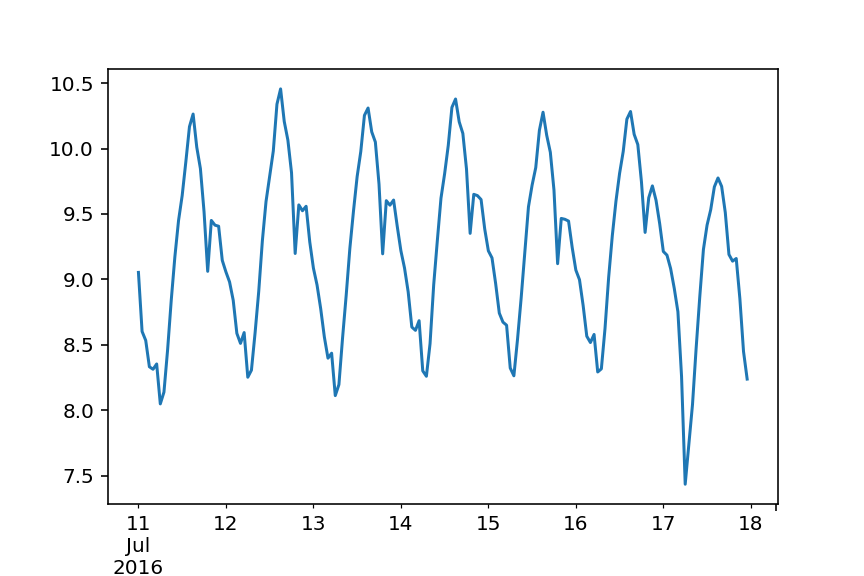

1549.2420710892661
1549.2420710892661
0.0


In [93]:
AA = results_int['TotalSystemCost']/(1000000)
AA.plot()
print AA.sum()
print AA['2016-04-01 00:00:00' : '2016-11-30 23:00:00'].sum()    #Summer
print AA['2016-12-01 00:00:00' : '2016-12-31 23:00:00'].sum() + AA['2016-01-01 00:00:00' : '2016-03-31 23:00:00'].sum()   #Winter


<IPython.core.display.Javascript object>


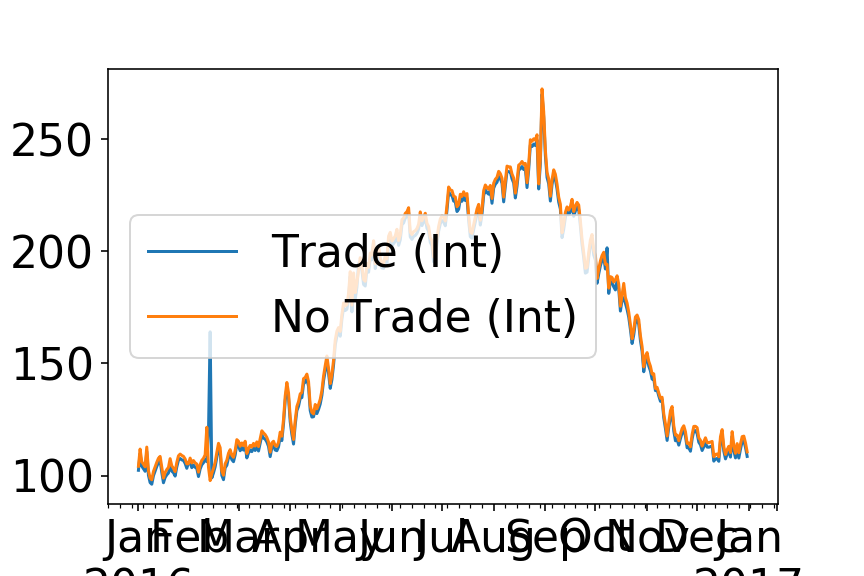

In [236]:
from matplotlib.pyplot import *
AA = results_int['TotalSystemCost']/(1000000)
BB = results_int_isolated['TotalSystemCost']/(1000000)
fig, ax = subplots()
AA.resample('D').sum().plot(ax=ax)
BB.resample('D').sum().plot(ax=ax)
ax.legend(['Trade (Int)', 'No Trade (Int)'])


<IPython.core.display.Javascript object>


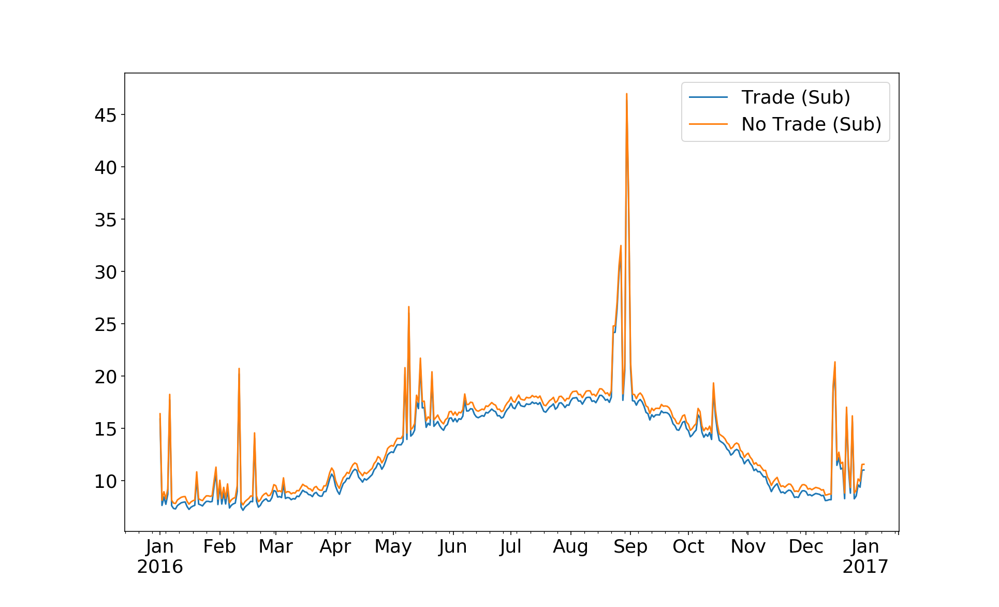

In [208]:
AA = results_sub['TotalSystemCost']/(1000000)
BB = results_sub_isolated['TotalSystemCost']/(1000000)
fig, ax = subplots()
AA.resample('D').sum().plot(ax=ax)
BB.resample('D').sum().plot(ax=ax)
ax.legend(['Trade (Sub)', 'No Trade (Sub)'])


<IPython.core.display.Javascript object>


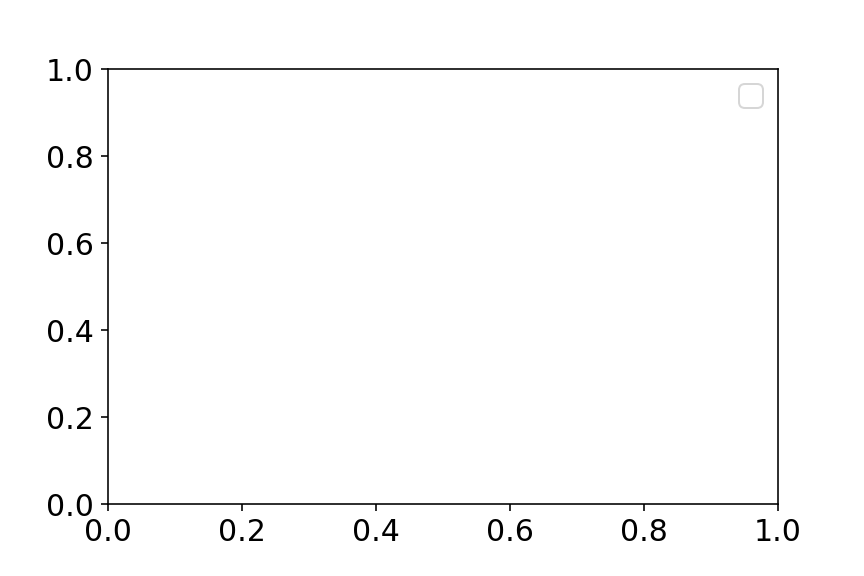

TypeError: 'module' object is not callable

In [252]:
AA = results_int['TotalSystemCost']/(1000000)
BB = results_int_isolated['TotalSystemCost']/(1000000)
CC = results_sub['TotalSystemCost']/(1000000)
DD = results_sub_isolated['TotalSystemCost']/(1000000)
fig, ax = subplots()
#AA.sum().plot(ax=ax,kind='bar')
#BB.sum().plot(ax=ax,kind='bar')
#AA.sum().plot(ax=ax,kind='bar')
#BB.sum().plot(ax=ax,kind='bar')
ax.legend(['Trade (Int)', 'No Trade (Int)','Trade (Sub)','No Trade (Sub)'])
plt([1])

In [21]:
plt.rcParams.update({'font.size': 22})

<IPython.core.display.Javascript object>


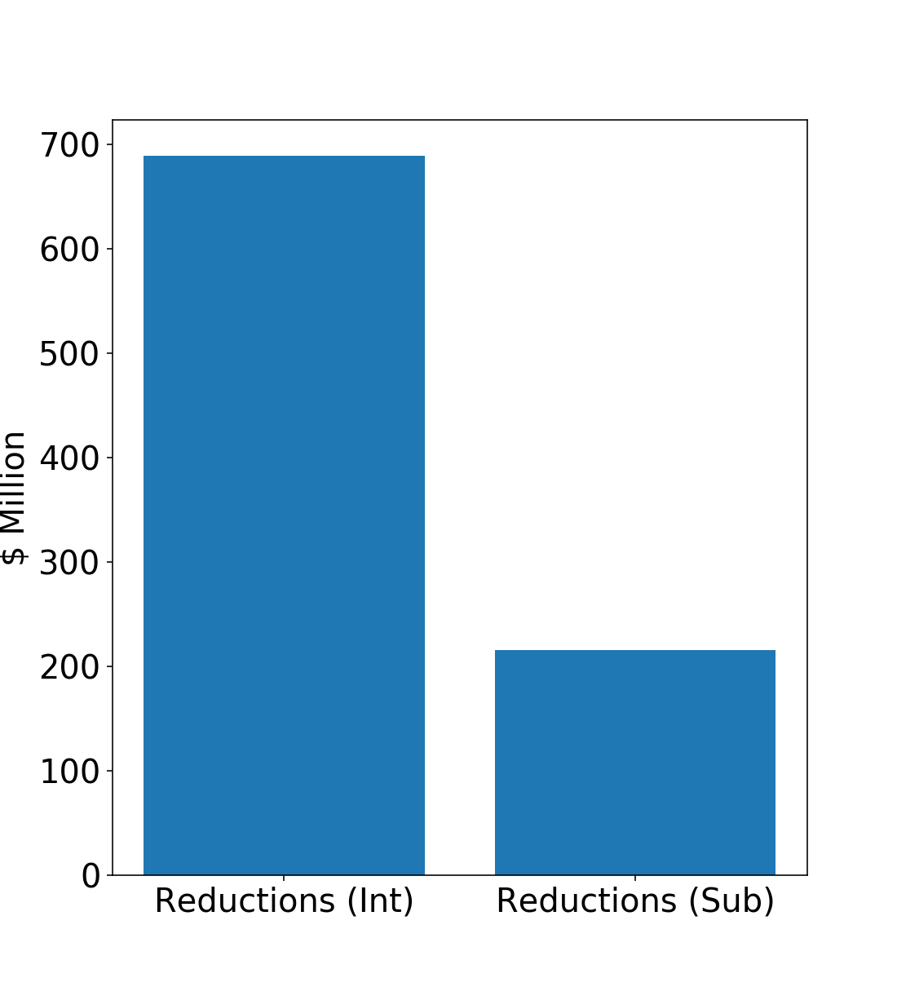

In [255]:
objects = ('Reductions (Int)', 'Reductions (Sub)')
y_pos = np.arange(len(objects))
performance = [BB.sum()-AA.sum(),DD.sum()-CC.sum()]
plt.bar(y_pos, performance, align='center', alpha=1)
plt.xticks(y_pos, objects)
plt.ylabel('$ Million')
plt.show()
plt.rcParams.update({'font.size': 25})

In [183]:
AA.sum()-BB.sum()

-689.0897093676831

<IPython.core.display.Javascript object>


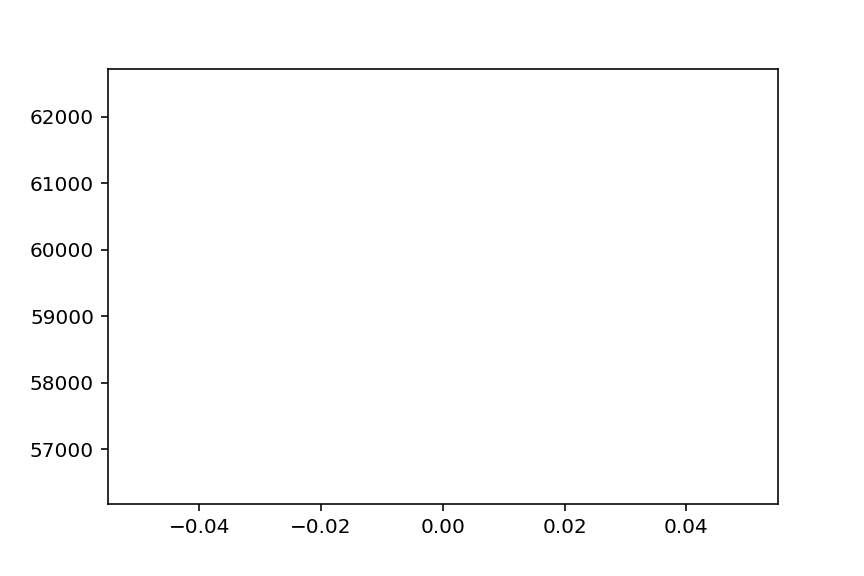

In [176]:
plot(AA.sum())

<IPython.core.display.Javascript object>


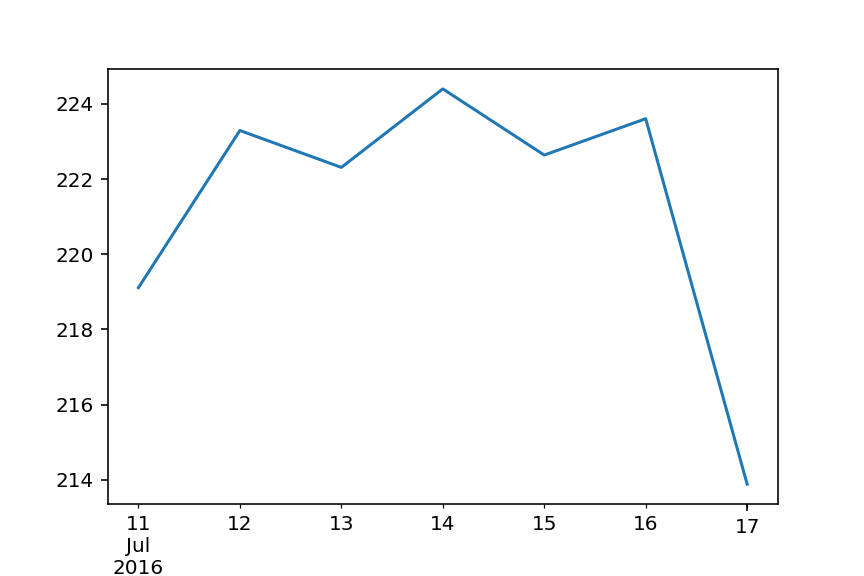

In [141]:
AA.resample('D').sum().plot()

<IPython.core.display.Javascript object>


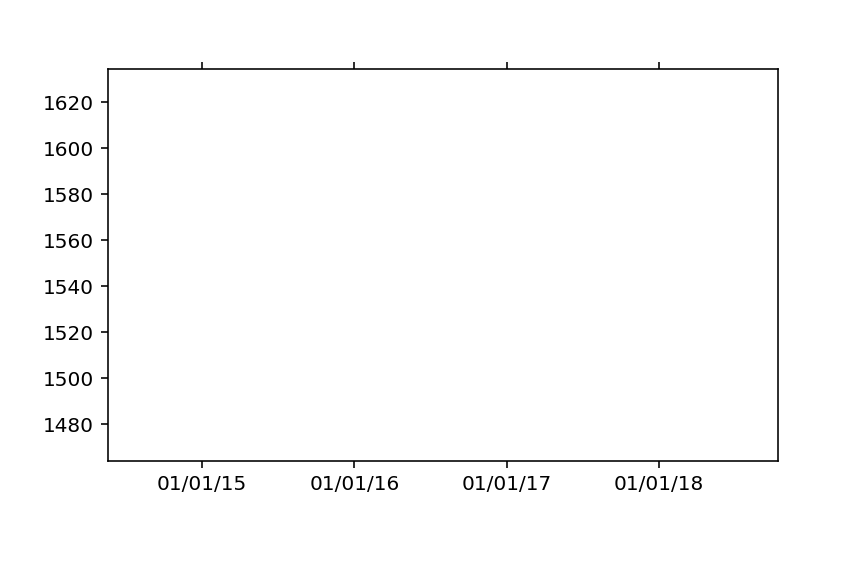

In [147]:
fig,ax = plt.subplots()
AA.resample('M').sum().plot(x_compat=True,ax=ax)
ax.xaxis.set_tick_params(reset=True)
ax.xaxis.set_major_locator(mdates.YearLocator(1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%D'))

plt.show()

<IPython.core.display.Javascript object>


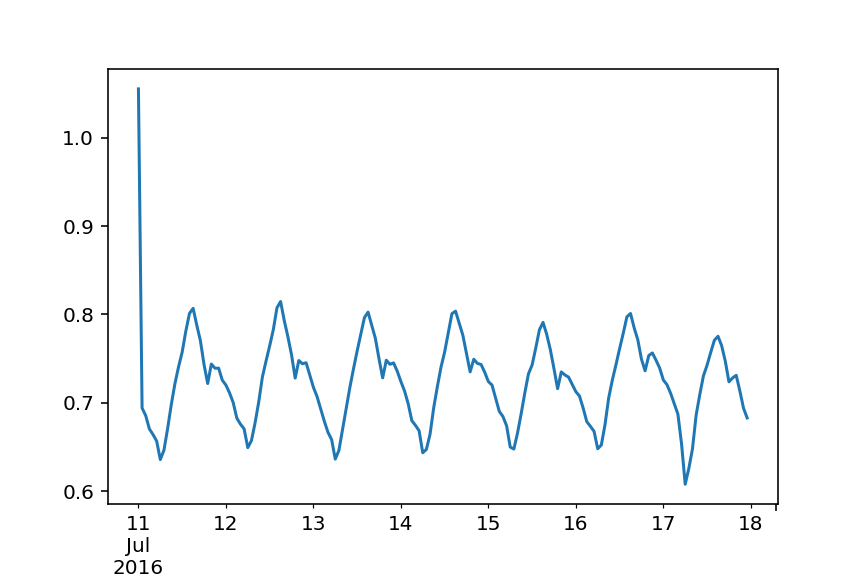

121.74512376236761
121.74512376236761
0.0


In [88]:
AA = results_sub['TotalSystemCost']/(1000000)
AA.plot()
print AA.sum()
print AA['2016-04-01 00:00:00' : '2016-11-30 23:00:00'].sum()    #Summer
print AA['2016-12-01 00:00:00' : '2016-12-31 23:00:00'].sum() + AA['2016-01-01 00:00:00' : '2016-03-31 23:00:00'].sum()   #Winter


<IPython.core.display.Javascript object>


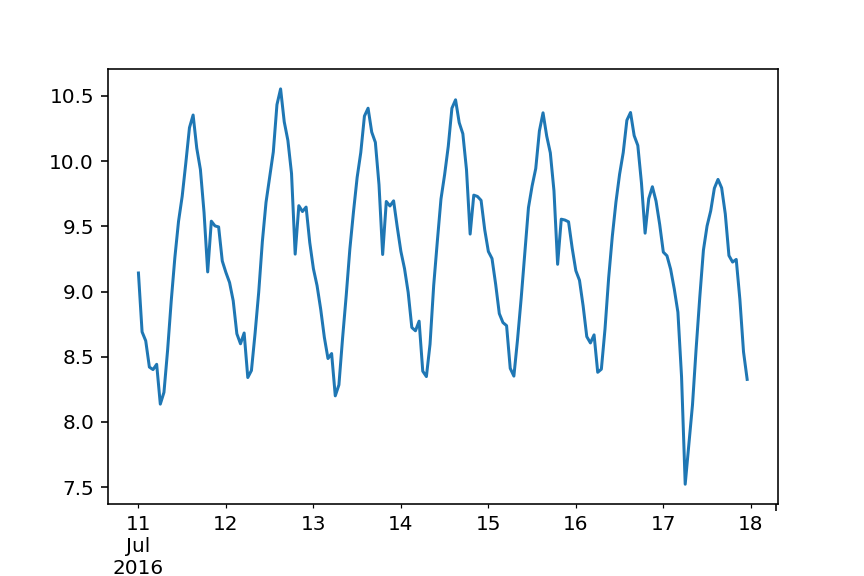

1564.2142179237967
1564.2142179237967
0.0


In [89]:
BB = results_int_isolated['TotalSystemCost']/(1000000)
BB.plot()
print BB.sum()
print BB['2016-04-01 00:00:00' : '2016-11-30 23:00:00'].sum()    #Summer
print BB['2016-12-01 00:00:00' : '2016-12-31 23:00:00'].sum() + BB['2016-01-01 00:00:00' : '2016-03-31 23:00:00'].sum()   #Winter


<IPython.core.display.Javascript object>


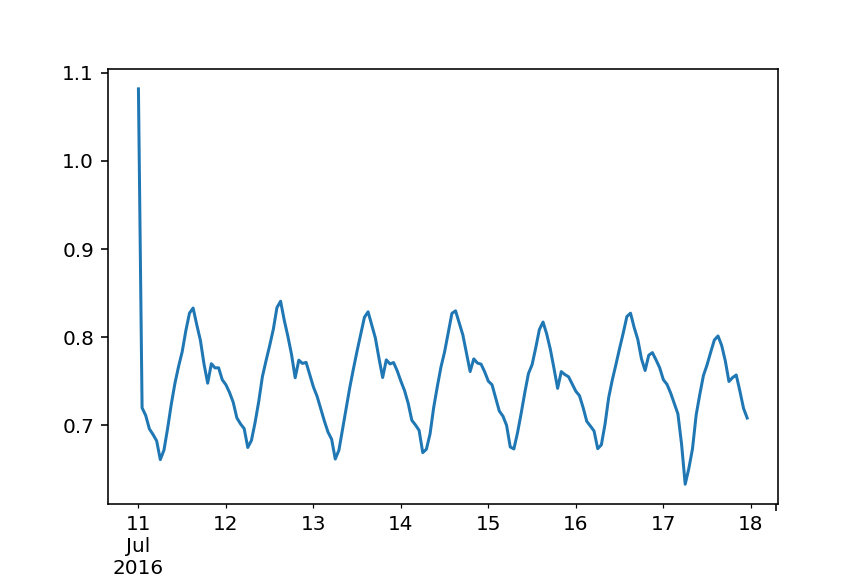

126.10747959083596
126.10747959083596
0.0


In [90]:
BB = results_sub_isolated['TotalSystemCost']/(1000000)
BB.plot()
print BB.sum()
print BB['2016-04-01 00:00:00' : '2016-11-30 23:00:00'].sum()    #Summer
print BB['2016-12-01 00:00:00' : '2016-12-31 23:00:00'].sum() + BB['2016-01-01 00:00:00' : '2016-03-31 23:00:00'].sum()   #Winter


In [15]:
results_int.keys()

['ExportedPowerToNode',
 'UnitOutputPowerInside',
 'UnitFixedCost',
 'PowerFlowMax',
 'TotalSystemCost',
 '*',
 'TotalNodeOperationCost2',
 'LostLoad_RampDown',
 'ImportedPowerFromNode',
 'NodeExportValue',
 'LineCongestion_UAE_GCC',
 'NodeImportValue',
 'LineCongestion_Ghunan_Salwa',
 'NodeShadowPrice',
 'UnitRampDownCost',
 'NodeFuelCost',
 'LocalOutputPower',
 'LineCongestion_KSA_GCC',
 'errors',
 'UnitOutputPowerForNode',
 'UnitVariableCost',
 'LostLoad_Reserve2D',
 'TotalImportedPowerCost',
 'TotalExportedPowerCost',
 'TotalNodeOperationCost',
 'UnitStartUpCost',
 'ExportedPowerToNodeCost',
 'LineCongestion_BA_GCC',
 'LineCongestion_OM_GCC',
 'LostLoad_Reserve2U',
 'TotalExportedPower',
 'LostLoad_MaxPower',
 'NodeFuelConsumption',
 'TotalImportedPower',
 'status',
 'LineCongestion',
 'UnitOutputPowerOutside',
 'NetExportedPower',
 'LostLoad_RampUp',
 'UnitShutDownCost',
 'LostLoad_MinPower',
 'LineCongestion_QA_GCC',
 'LocalOutputPowerCost',
 'UnitOutputCurtailedPower',
 'NodeFue

## Compare trade  volumes (International prices vs subsidized prices)

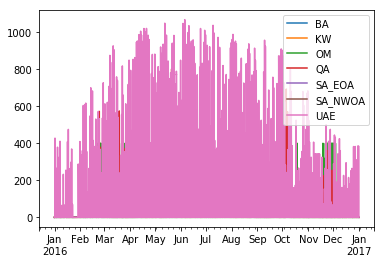

In [18]:
results_int['TotalExportedPower'].drop(['SA_RIYADH','SA_SOA','SA_WOA'], axis=1).plot() #'SA_HAIL','SA_NEOA','SA_QASSIM',

In [108]:
NewOutputFlow_int = results_sub['PowerFlow'].copy()
columns = []
for i,column in enumerate(NewOutputFlow_int):
    [from_node, to_node] = column.split('->')
    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
        columns.append(i)
GCCFlows_int = NewOutputFlow_int.drop(NewOutputFlow_int.columns[columns], axis=1).copy()
#pd.DataFrame((GCCFlows_int.sum()/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')


df = (GCCFlows_int/1000).T.sort_index().sum(axis=1).reset_index()
df.columns = [ 'Zones', 'Power Exchange (GWh)']
aa = sns.barplot(data=df, x='Zones', y='Power Exchange (GWh)',color='#1f77b4')

for item in aa.get_xticklabels():
    item.set_rotation(90)
#Summer
#pd.DataFrame((GCCFlows_int['2016-04-01 00:00:00' : '2016-11-30 23:00:00'].sum()/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')

#Winter
#pd.DataFrame(((GCCFlows_int['2016-12-01 00:00:00' : '2016-12-31 23:00:00'].sum()+GCCFlows_int['2016-01-01 00:00:00' : '2016-03-31 23:00:00'].sum())/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')

#A = pd.DataFrame((GCCFlows_int.sum()),columns=['Power traded'])
#print A
#print A.sum()

<IPython.core.display.Javascript object>


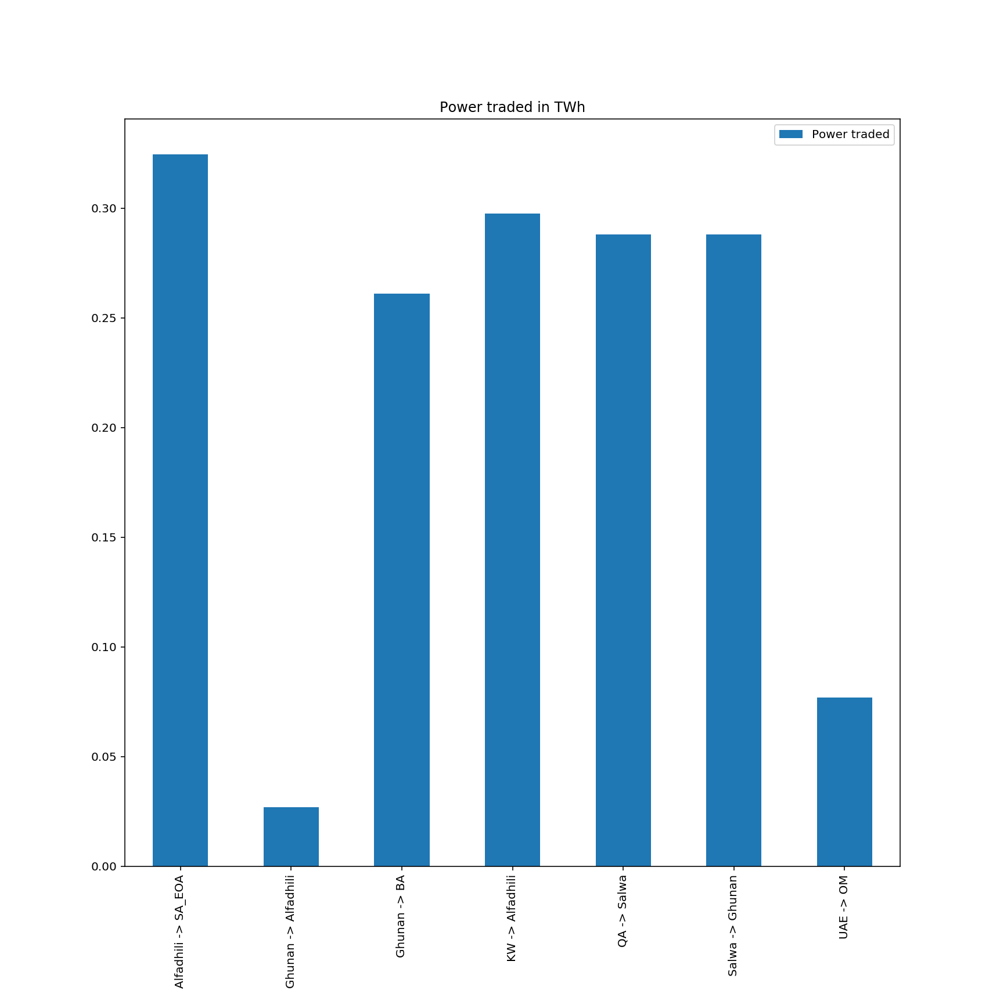

                     Power traded
Alfadhili -> SA_EOA      324480.0
Ghunan -> Alfadhili       26880.0
Ghunan -> BA             261120.0
KW -> Alfadhili          297600.0
QA -> Salwa              288000.0
Salwa -> Ghunan          288000.0
UAE -> OM                 76800.0
Power traded    1562880.0
dtype: float64


In [11]:
NewOutputFlow_sub = results1['PowerFlow'].copy()
columns = []
for i,column in enumerate(NewOutputFlow_sub):
    [from_node, to_node] = column.split('->')
    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
        columns.append(i)
GCCFlows_sub = NewOutputFlow_sub.drop(NewOutputFlow_sub.columns[columns], axis=1).copy()
pd.DataFrame((GCCFlows_sub.sum()/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')


#Summer
#pd.DataFrame((GCCFlows_sub['2016-04-01 00:00:00' : '2016-11-30 23:00:00'].sum()/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')

#Winter
#pd.DataFrame(((GCCFlows_sub['2016-12-01 00:00:00' : '2016-12-31 23:00:00'].sum()+GCCFlows_sub['2016-01-01 00:00:00' : '2016-03-31 23:00:00'].sum())/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')

A = pd.DataFrame((GCCFlows_sub.sum()),columns=['Power traded'])
print A
print A.sum()

In [13]:
41250.0+202500.0+8250.0

252000.0

<IPython.core.display.Javascript object>


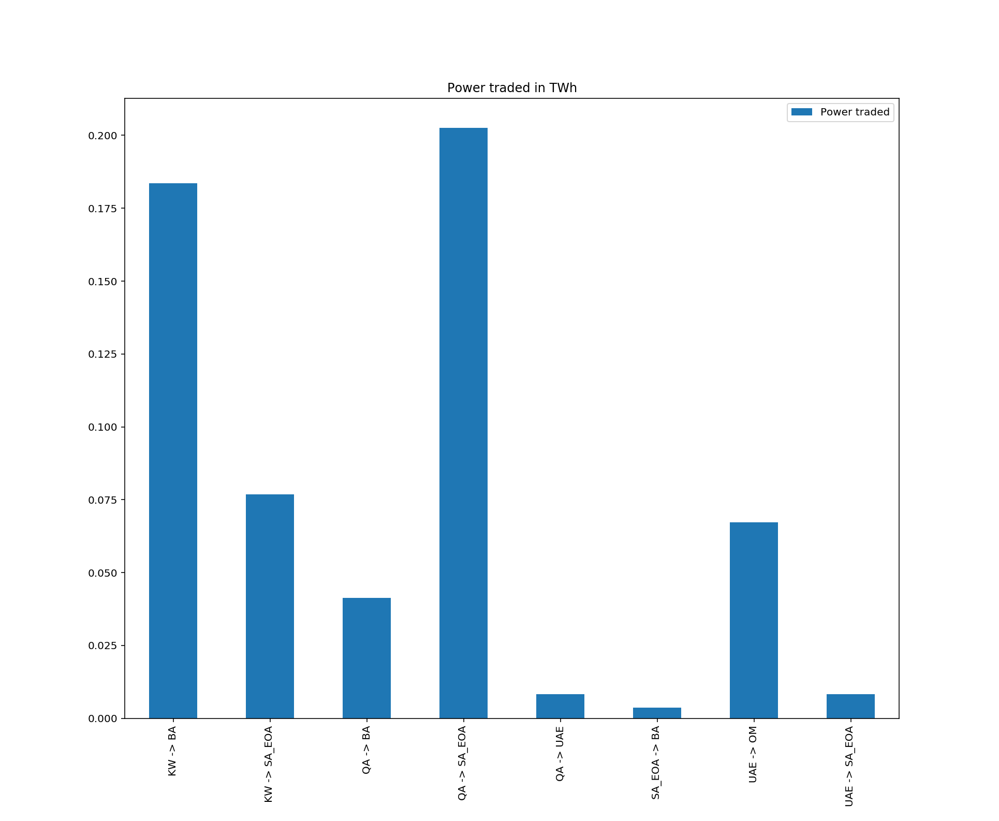

               Power traded
KW -> BA           183600.0
KW -> SA_EOA        76800.0
QA -> BA            41250.0
QA -> SA_EOA       202500.0
QA -> UAE            8250.0
SA_EOA -> BA         3630.0
UAE -> OM           67200.0
UAE -> SA_EOA        8250.0
Power traded    591480.0
dtype: float64


In [12]:
NewOutputFlow_sub = results2['PowerFlow'].copy()
columns = []
for i,column in enumerate(NewOutputFlow_sub):
    [from_node, to_node] = column.split('->')
    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
        columns.append(i)
GCCFlows_sub = NewOutputFlow_sub.drop(NewOutputFlow_sub.columns[columns], axis=1).copy()
pd.DataFrame((GCCFlows_sub.sum()/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')


#Summer
#pd.DataFrame((GCCFlows_sub['2016-04-01 00:00:00' : '2016-11-30 23:00:00'].sum()/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')

#Winter
#pd.DataFrame(((GCCFlows_sub['2016-12-01 00:00:00' : '2016-12-31 23:00:00'].sum()+GCCFlows_sub['2016-01-01 00:00:00' : '2016-03-31 23:00:00'].sum())/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')

A = pd.DataFrame((GCCFlows_sub.sum()),columns=['Power traded'])
print A
print A.sum()

In [37]:
#NewOutputFlow_int = results_int['PowerFlow'].copy()
#OriginalColumns_int = []
#reverseindex = []
#for j,column in enumerate(NewOutputFlow_int):
#    A = column.split(' -> ')
#    OriginalColumns_int.append(A)
#    B = list(reversed(A))
#    if B in OriginalColumns_int:
#        reverseindex.append(j)
#        D = [i for i, C in enumerate(OriginalColumns_int) if C==B]
#        D = int(''.join(map(str,D)))
#        NewOutputFlow_int.iloc[:,D] = NewOutputFlow_int.iloc[:,D] - NewOutputFlow_int.iloc[:,j]
#NewOutputFlow_int = NewOutputFlow_int.drop(NewOutputFlow_int.columns[reverseindex], axis=1).copy()
#
#columns = []
#for i,column in enumerate(NewOutputFlow_int):
#    [from_node, to_node] = column.split('->')
#    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
#        columns.append(i)
#GCCFlows_int = NewOutputFlow_int.drop(NewOutputFlow_int.columns[columns], axis=1).copy()
#pd.DataFrame((GCCFlows_int.sum()/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')
#
#A = pd.DataFrame((GCCFlows_int.sum()),columns=['Power traded'])
#print A
#print A.sum()
#Summer
#pd.DataFrame((GCCFlows_int['2016-04-01 00:00:00' : '2016-11-30 23:00:00'].sum()/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')

#Winter
#pd.DataFrame(((GCCFlows_int['2016-12-01 00:00:00' : '2016-12-31 23:00:00'].sum()+GCCFlows_int['2016-01-01 00:00:00' : '2016-03-31 23:00:00'].sum())/(1000000)),columns=['Power traded']).plot.bar(title='Power traded in TWh')


<IPython.core.display.Javascript object>


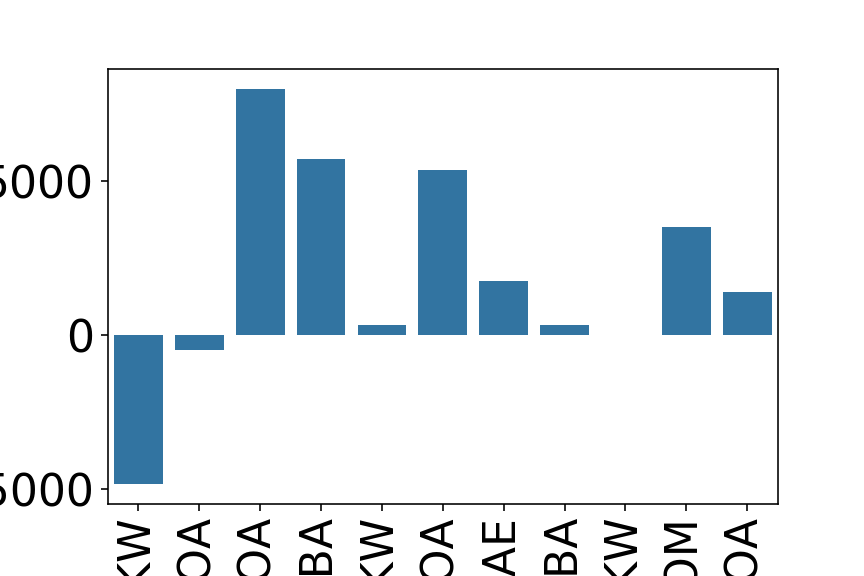

In [28]:
#Net Exports (for GCC countries and EOA) taking into account that exports of EOA does not include exports to other KSA regions 
NewOutputFlow_int = results_sub['PowerFlow'].copy()
OriginalColumns_int = []
reverseindex = []
for j,column in enumerate(NewOutputFlow_int):
    A = column.split(' -> ')
    OriginalColumns_int.append(A)
    B = list(reversed(A))
    if B in OriginalColumns_int:
        reverseindex.append(j)
        D = [i for i, C in enumerate(OriginalColumns_int) if C==B]
        D = int(''.join(map(str,D)))
        NewOutputFlow_int.iloc[:,D] = NewOutputFlow_int.iloc[:,D] - NewOutputFlow_int.iloc[:,j]
NewOutputFlow_int = NewOutputFlow_int.drop(NewOutputFlow_int.columns[reverseindex], axis=1).copy()

columns = []
for i,column in enumerate(NewOutputFlow_int):
    [from_node, to_node] = column.split('->')
    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
        columns.append(i)
GCCFlows_int = NewOutputFlow_int.drop(NewOutputFlow_int.columns[columns], axis=1).copy()
df = (GCCFlows_int/1000).T.sort_index().sum(axis=1).reset_index()
df.columns = [ 'Zones', 'Power Exchange (GWh)']
aa = sns.barplot(data=df, x='Zones', y='Power Exchange (GWh)',color='#1f77b4')

for item in aa.get_xticklabels():
    item.set_rotation(90)
#plt.title("Int")    
#df = (GCCFlows_int).T.sort_index().sum(axis=1).reset_index()

#df.columns = [ 'Zones', 'Power Exchange (MWh)']
#sns.barplot(data=df, x='Zones', y='Power Exchange (MWh)',color='#1f77b4').axhline(0, ls='--',color='k')
#plt.title("Int")

#ax = GCCFlows_int.plot(kind='line', title=None, legend=True)
#ax.legend(loc='center left', bbox_to_anchor=(0.9, 0.5))
#ax.axhline(y=0, xmin=0, xmax=1, color='k', linestyle='--')

<IPython.core.display.Javascript object>


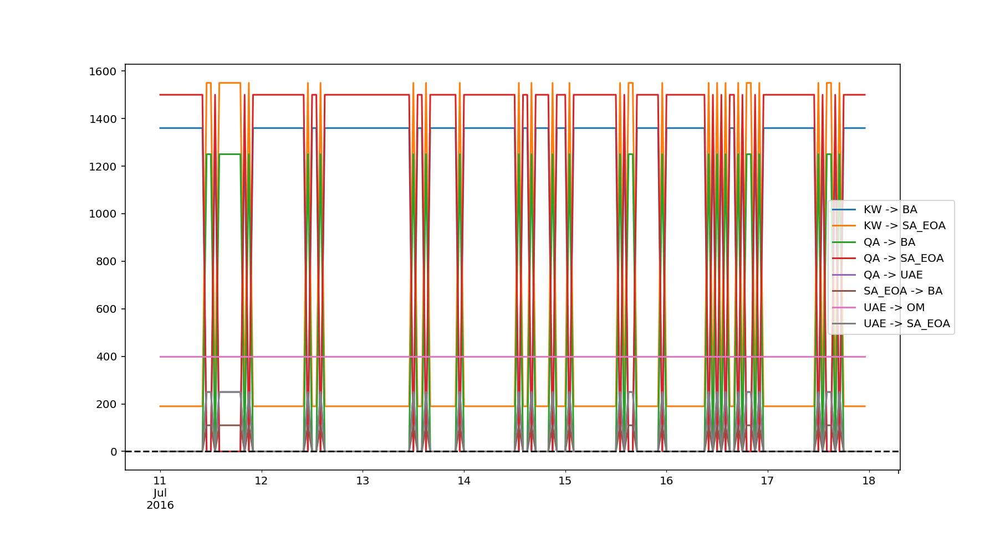

In [42]:
NewOutputFlow_sub = results_sub['PowerFlow'].copy()
OriginalColumns_sub = []
reverseindex = []
for j,column in enumerate(NewOutputFlow_sub):
    A = column.split(' -> ')
    OriginalColumns_sub.append(A)
    B = list(reversed(A))
    if B in OriginalColumns_sub:
        reverseindex.append(j)
        D = [i for i, C in enumerate(OriginalColumns_sub) if C==B]
        D = int(''.join(map(str,D)))
        NewOutputFlow_sub.iloc[:,D] = NewOutputFlow_sub.iloc[:,D] - NewOutputFlow_sub.iloc[:,j]
NewOutputFlow_sub = NewOutputFlow_sub.drop(NewOutputFlow_sub.columns[reverseindex], axis=1).copy()

columns = []
for i,column in enumerate(NewOutputFlow_sub):
    [from_node, to_node] = column.split('->')
    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
        columns.append(i)
GCCFlows_sub = NewOutputFlow_sub.drop(NewOutputFlow_sub.columns[columns], axis=1).copy()
ax = GCCFlows_sub.plot(kind='line', title=None, legend=True)
ax.legend(loc='center left', bbox_to_anchor=(0.9, 0.5))
ax.axhline(y=0, xmin=0, xmax=1, color='k', linestyle='--')

<IPython.core.display.Javascript object>


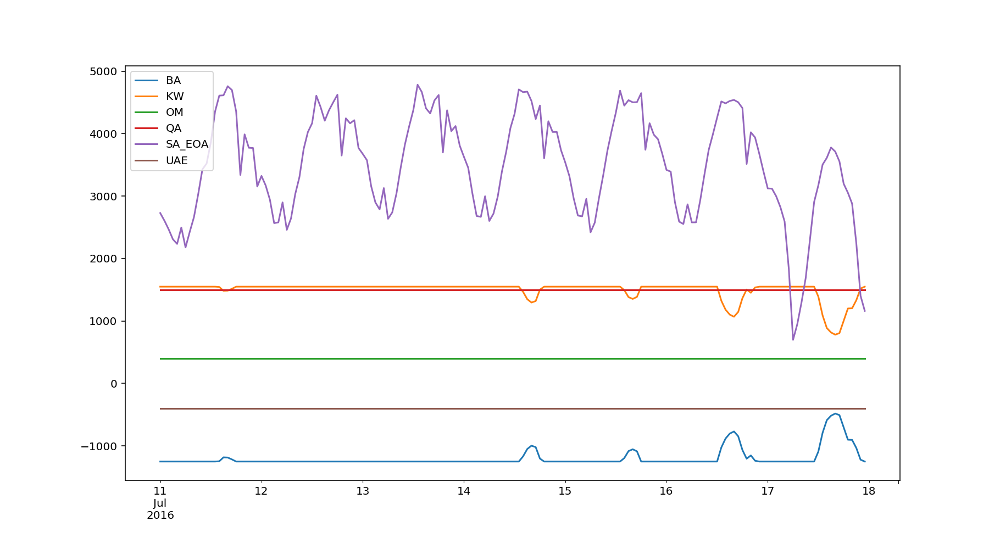

In [124]:
#Net Exports (for GCC countries and EOA) NOT taking into account that exports of EOA does not include exports to other KSA regions 

results_int['NetExportedPower'].drop(['SA_HAIL','SA_NEOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'], axis=1).plot()


<IPython.core.display.Javascript object>


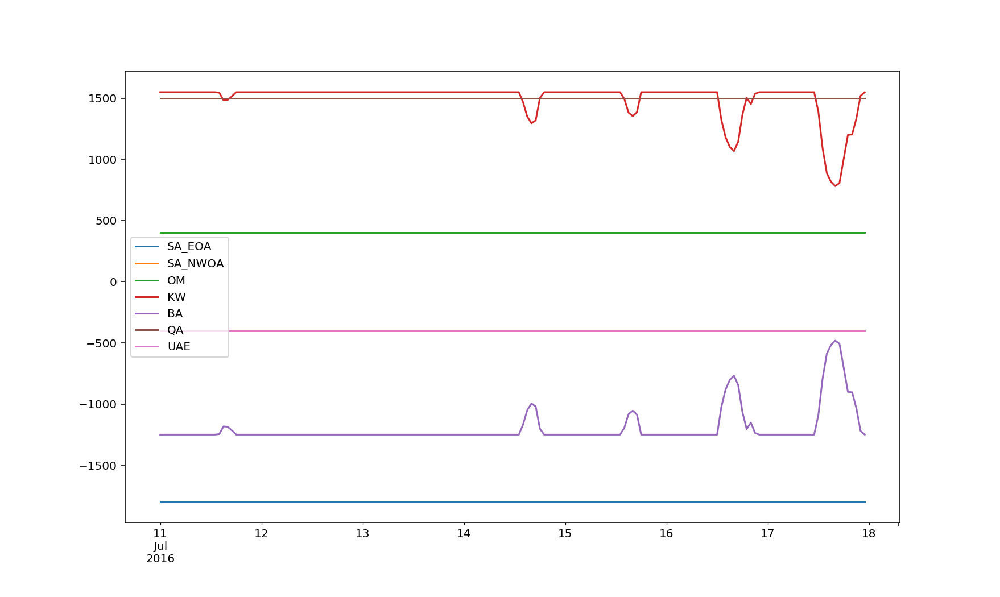

In [131]:
#Net Exports (for GCC countries and EOA) taking into account that exports of EOA does not include exports to other KSA regions 

NewOutputFlow_int = results_int['PowerFlow'].copy()
OriginalColumns_int = []
reverseindex = []
for j,column in enumerate(NewOutputFlow_int):
    A = column.split(' -> ')
    OriginalColumns_int.append(A)
    B = list(reversed(A))
    if B in OriginalColumns_int:
        reverseindex.append(j)
        D = [i for i, C in enumerate(OriginalColumns_int) if C==B]
        D = int(''.join(map(str,D)))
        NewOutputFlow_int.iloc[:,D] = NewOutputFlow_int.iloc[:,D] - NewOutputFlow_int.iloc[:,j]
NewOutputFlow_int = NewOutputFlow_int.drop(NewOutputFlow_int.columns[reverseindex], axis=1).copy()

columns = []
for i,column in enumerate(NewOutputFlow_int):
    [from_node, to_node] = column.split('->')
    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
        columns.append(i)
GCCFlows_int = NewOutputFlow_int.drop(NewOutputFlow_int.columns[columns], axis=1).copy()

NetExports_int=pd.DataFrame(columns=inputs_int['config']['zones'], index=NewOutputFlow_int.index)
for zone in inputs_int['config']['zones']:
    for column in GCCFlows_int:
        [from_node, to_node] = column.split(' -> ')
        if (from_node == zone):
            tmp = pd.Series(GCCFlows_int[column], index=NetExports_int.index)
            if NetExports_int.loc[NetExports_int.index, zone].isnull().values.any():
                NetExports_int.loc[NetExports_int.index, zone] = np.array(tmp)
            else:
                NetExports_int.loc[NetExports_int.index, zone] += np.array(tmp)
    for column in GCCFlows_int:
        [from_node, to_node] = column.split(' -> ')
        if (to_node == zone):
            tmp = pd.Series(GCCFlows_int[column], index=NetExports_int.index)
            if NetExports_int.loc[NetExports_int.index, zone].isnull().values.any():
                NetExports_int.loc[NetExports_int.index, zone] = np.array(tmp)*(-1)
            else:
                NetExports_int.loc[NetExports_int.index, zone] += np.array(tmp)*(-1)
                
NetExports_int.drop(['SA_HAIL','SA_NEOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'], axis=1).plot()

<IPython.core.display.Javascript object>


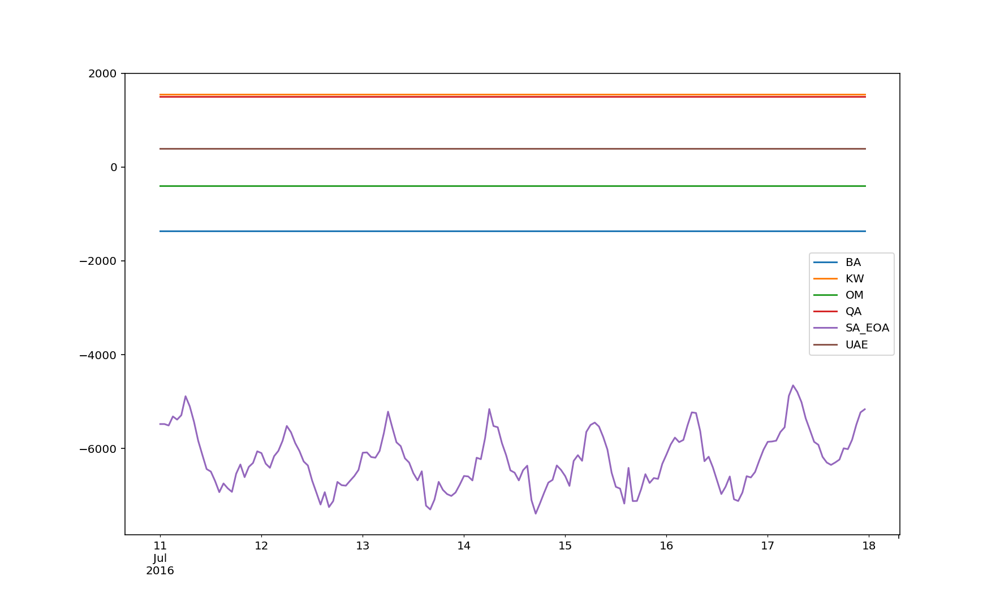

In [125]:
results_sub['NetExportedPower'].drop(['SA_HAIL','SA_NEOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'], axis=1).plot()


<IPython.core.display.Javascript object>


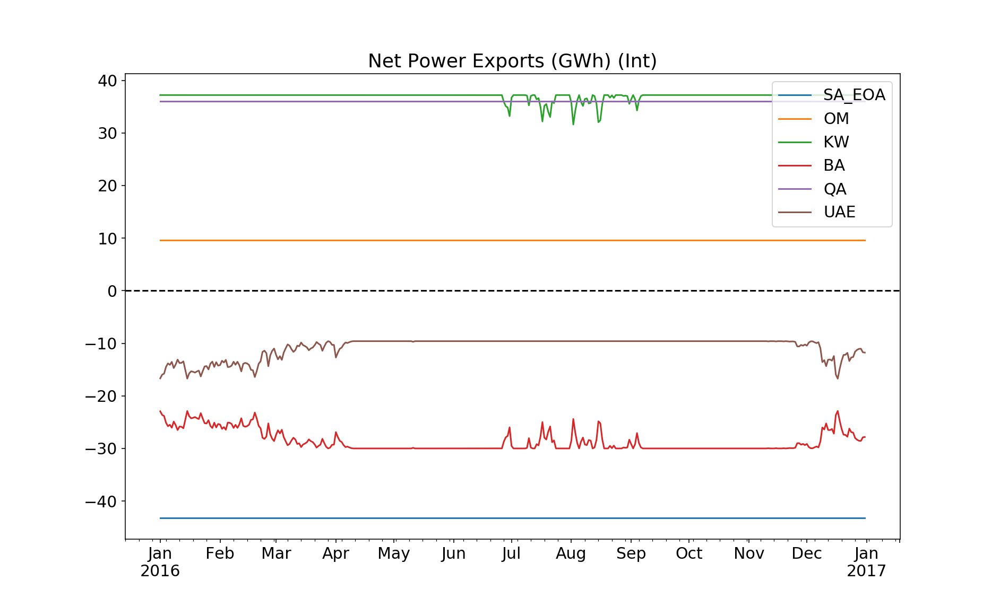

Text(0.5,1,'Net Power Exports (GWh) (Int)')

In [284]:
#Net Exports (for GCC countries and EOA) taking into account that exports of EOA does not include exports to other KSA regions 

NewOutputFlow_sub = results_int['PowerFlow'].copy()
OriginalColumns_sub = []
reverseindex = []
for j,column in enumerate(NewOutputFlow_sub):
    A = column.split(' -> ')
    OriginalColumns_sub.append(A)
    B = list(reversed(A))
    if B in OriginalColumns_sub:
        reverseindex.append(j)
        D = [i for i, C in enumerate(OriginalColumns_sub) if C==B]
        D = int(''.join(map(str,D)))
        NewOutputFlow_sub.iloc[:,D] = NewOutputFlow_sub.iloc[:,D] - NewOutputFlow_sub.iloc[:,j]
NewOutputFlow_sub = NewOutputFlow_sub.drop(NewOutputFlow_sub.columns[reverseindex], axis=1).copy()

columns = []
for i,column in enumerate(NewOutputFlow_sub):
    [from_node, to_node] = column.split('->')
    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
        columns.append(i)
GCCFlows_sub = NewOutputFlow_sub.drop(NewOutputFlow_sub.columns[columns], axis=1).copy()

NetExports_sub=pd.DataFrame(columns=inputs_int['config']['zones'], index=NewOutputFlow_sub.index)
for zone in inputs_sub['config']['zones']:
    for column in GCCFlows_sub:
        [from_node, to_node] = column.split(' -> ')
        if (from_node == zone):
            tmp = pd.Series(GCCFlows_sub[column], index=NetExports_sub.index)
            if NetExports_sub.loc[NetExports_sub.index, zone].isnull().values.any():
                NetExports_sub.loc[NetExports_sub.index, zone] = np.array(tmp)
            else:
                NetExports_sub.loc[NetExports_sub.index, zone] += np.array(tmp)
    for column in GCCFlows_sub:
        [from_node, to_node] = column.split(' -> ')
        if (to_node == zone):
            tmp = pd.Series(GCCFlows_sub[column], index=NetExports_sub.index)
            if NetExports_sub.loc[NetExports_sub.index, zone].isnull().values.any():
                NetExports_sub.loc[NetExports_sub.index, zone] = np.array(tmp)*(-1)
            else:
                NetExports_sub.loc[NetExports_sub.index, zone] += np.array(tmp)*(-1)


#(NetExports_sub.drop(['SA_HAIL','SA_NEOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'], axis=1).sum())/1000000

A = ((NetExports_sub.drop(['SA_HAIL','SA_NEOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA','SA_NWOA'], axis=1))/1000)
A.resample('D').sum().plot().axhline(0, ls='--',color='k')
plt.title("Net Power Exports (GWh) (Int)")

#df = (NetExports_sub.drop(['SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'], axis=1)/1000000).T.sort_index().sum(axis=1).reset_index()

#df.columns = [ 'Zone', 'Net Power Exports (TWh)']
#sns.barplot(data=df, x='Zone', y='Net Power Exports (TWh)',color='#1f77b4').axhline(0, ls='--',color='k')
#plt.title("Int")


<IPython.core.display.Javascript object>


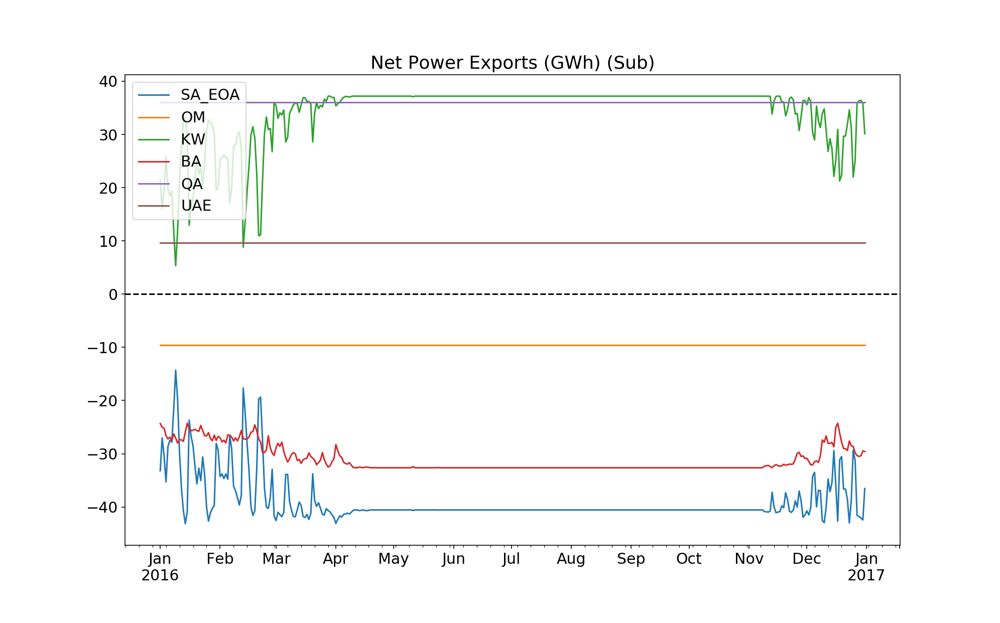

Text(0.5,1,'Net Power Exports (GWh) (Sub)')

In [286]:
#Net Exports (for GCC countries and EOA) taking into account that exports of EOA does not include exports to other KSA regions 

NewOutputFlow_sub = results_sub['PowerFlow'].copy()
OriginalColumns_sub = []
reverseindex = []
for j,column in enumerate(NewOutputFlow_sub):
    A = column.split(' -> ')
    OriginalColumns_sub.append(A)
    B = list(reversed(A))
    if B in OriginalColumns_sub:
        reverseindex.append(j)
        D = [i for i, C in enumerate(OriginalColumns_sub) if C==B]
        D = int(''.join(map(str,D)))
        NewOutputFlow_sub.iloc[:,D] = NewOutputFlow_sub.iloc[:,D] - NewOutputFlow_sub.iloc[:,j]
NewOutputFlow_sub = NewOutputFlow_sub.drop(NewOutputFlow_sub.columns[reverseindex], axis=1).copy()

columns = []
for i,column in enumerate(NewOutputFlow_sub):
    [from_node, to_node] = column.split('->')
    if (from_node.strip()[0:2] == 'SA' and to_node.strip()[0:2] == 'SA'):
        columns.append(i)
GCCFlows_sub = NewOutputFlow_sub.drop(NewOutputFlow_sub.columns[columns], axis=1).copy()

NetExports_sub=pd.DataFrame(columns=inputs_int['config']['zones'], index=NewOutputFlow_sub.index)
for zone in inputs_sub['config']['zones']:
    for column in GCCFlows_sub:
        [from_node, to_node] = column.split(' -> ')
        if (from_node == zone):
            tmp = pd.Series(GCCFlows_sub[column], index=NetExports_sub.index)
            if NetExports_sub.loc[NetExports_sub.index, zone].isnull().values.any():
                NetExports_sub.loc[NetExports_sub.index, zone] = np.array(tmp)
            else:
                NetExports_sub.loc[NetExports_sub.index, zone] += np.array(tmp)
    for column in GCCFlows_sub:
        [from_node, to_node] = column.split(' -> ')
        if (to_node == zone):
            tmp = pd.Series(GCCFlows_sub[column], index=NetExports_sub.index)
            if NetExports_sub.loc[NetExports_sub.index, zone].isnull().values.any():
                NetExports_sub.loc[NetExports_sub.index, zone] = np.array(tmp)*(-1)
            else:
                NetExports_sub.loc[NetExports_sub.index, zone] += np.array(tmp)*(-1)

#(NetExports_sub.drop(['SA_HAIL','SA_NEOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'], axis=1).sum())/1000000

A = ((NetExports_sub.drop(['SA_HAIL','SA_NEOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA','SA_NWOA'], axis=1))/1000)
A.resample('D').sum().plot().axhline(0, ls='--',color='k')
plt.title("Net Power Exports (GWh) (Sub)")

#df = (NetExports_sub.drop(['SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'], axis=1)/1000000).T.sort_index().sum(axis=1).reset_index()

#df.columns = [ 'Zone', 'Net Power Exports (TWh)']
#sns.barplot(data=df, x='Zone', y='Net Power Exports (TWh)',color='#1f77b4').axhline(0, ls='--',color='k')
#plt.title("Sub")


In [194]:
A = results_int['PowerFlow'].drop(columns=['SA_EOA -> SA_RIYADH','SA_HAIL -> SA_NEOA','SA_QASSIM -> SA_HAIL','SA_QASSIM -> SA_WOA','SA_QASSIM -> SA_WOA','SA_QASSIM -> SA_WOA','SA_RIYADH -> SA_QASSIM','SA_WOA -> SA_QASSIM','SA_WOA -> SA_SOA']).sum()

print A
print A.sum()

BA -> KW           6066.063617
BA -> SA_EOA       1430.000000
KW -> BA           2794.846820
KW -> SA_EOA     254819.490995
OM -> UAE         67200.000000
QA -> BA         204599.490995
QA -> SA_EOA      44610.509005
QA -> UAE          2790.000000
UAE -> BA          1250.000000
UAE -> SA_EOA      1540.000000
dtype: float64
587100.401432435


In [190]:
A = results_sub['PowerFlow'].drop(columns=['SA_HAIL -> SA_NEOA','SA_QASSIM -> SA_HAIL','SA_QASSIM -> SA_WOA','SA_RIYADH -> SA_EOA','SA_RIYADH -> SA_QASSIM','SA_SOA -> SA_WOA','SA_WOA -> SA_QASSIM','SA_WOA -> SA_SOA']).sum()

print A
print A.sum()

KW -> BA         183600.0
KW -> SA_EOA      76800.0
QA -> BA          41250.0
QA -> SA_EOA     202500.0
QA -> UAE          8250.0
SA_EOA -> BA       3630.0
UAE -> OM         67200.0
UAE -> SA_EOA      8250.0
dtype: float64
591480.0


## Compare Nodal prices (Trade vs No Trade)  (International prices)

/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


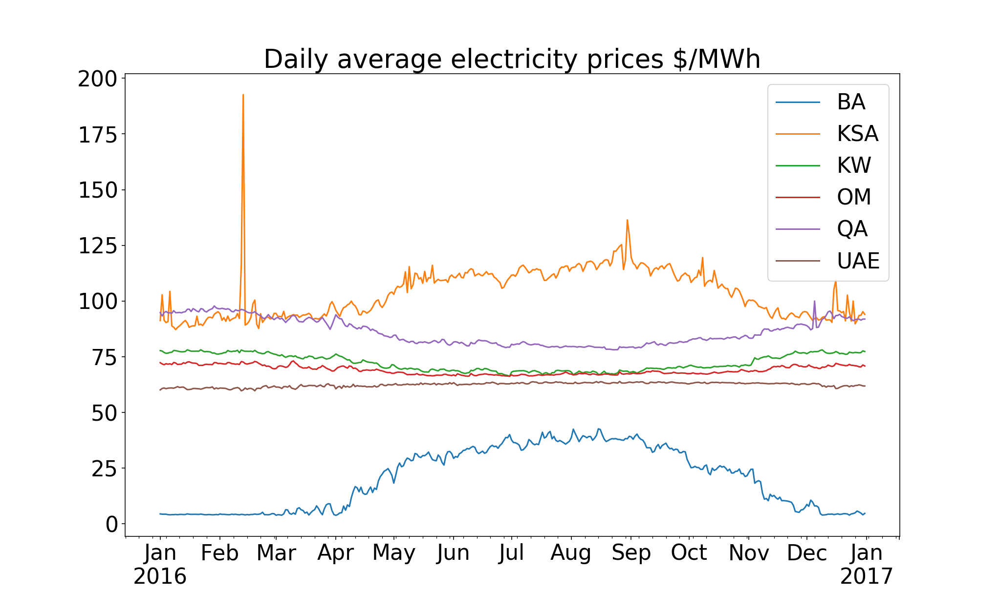

Text(0.5,1,'Daily average electricity prices $/MWh')

In [34]:
TotalZoneOperationCost = results_int['TotalNodeOperationCost']
BBB = pd.DataFrame(TotalZoneOperationCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)
TotalZoneOperationCost['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost.index)

NodeDemand = datain_int['Demand']['DA']
BBB = pd.DataFrame(NodeDemand[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA_Demand = BBB.sum(axis=1)
NodeDemand['KSA']= pd.Series(KSA_Demand.values, index=NodeDemand.index)

ElectrictyPrice=TotalZoneOperationCost.div(NodeDemand)
ElectrictyPrice.resample('D').mean().drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot()
plt.title('Daily average electricity prices $/MWh')
###results_int['NodeShadowPrice'].resample('D',how='mean')


/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


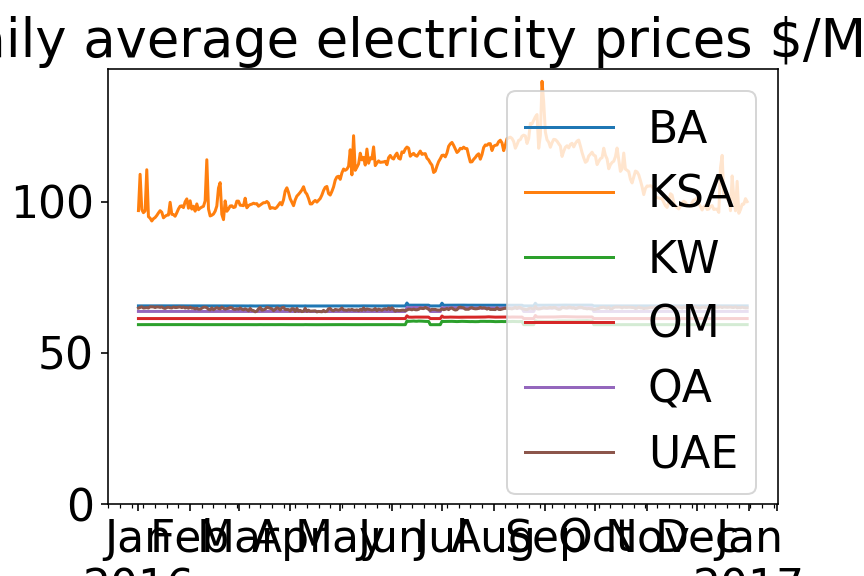

Text(0.5,1,'Daily average electricity prices $/MWh')

In [54]:
TotalZoneOperationCost = results_int_isolated['TotalNodeOperationCost']
BBB = pd.DataFrame(TotalZoneOperationCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)
TotalZoneOperationCost['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost.index)

NodeDemand = datain_int['Demand']['DA']
BBB = pd.DataFrame(NodeDemand[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA_Demand = BBB.sum(axis=1)
NodeDemand['KSA']= pd.Series(KSA_Demand.values, index=NodeDemand.index)

ElectrictyPrice=TotalZoneOperationCost.div(NodeDemand)
ElectrictyPrice.resample('D').mean().drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot().set_ylim(bottom=0)
plt.title('Daily average electricity prices $/MWh')
###results_int['NodeShadowPrice'].resample('D',how='mean')



/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


<IPython.core.display.Javascript object>


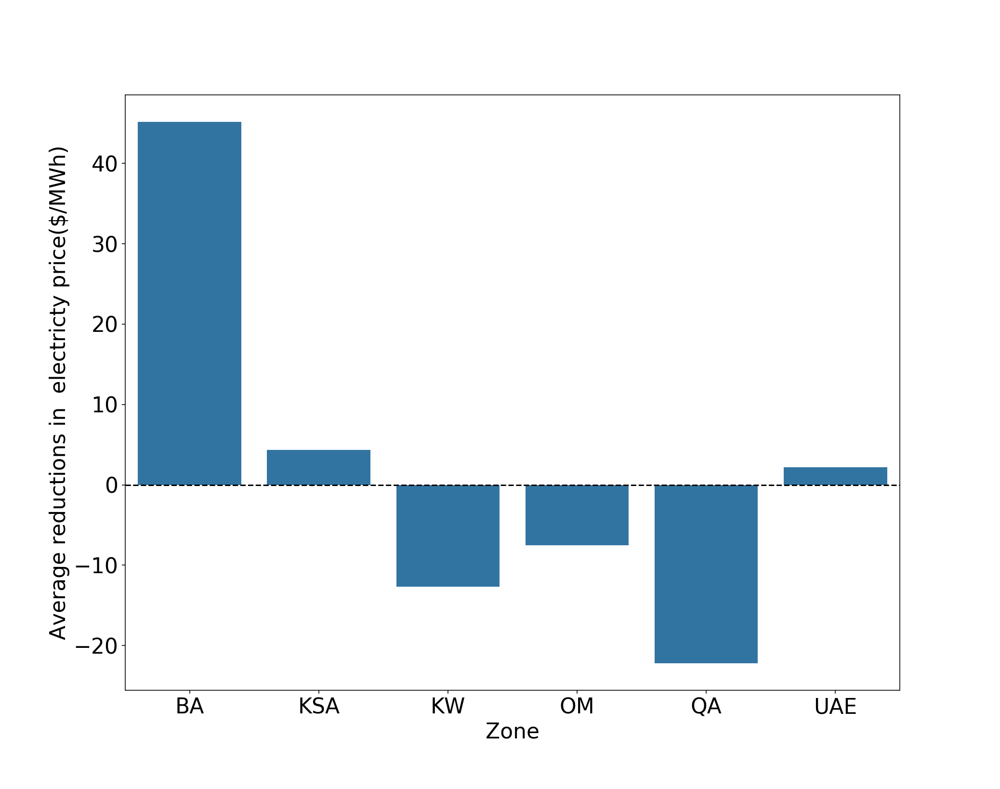

In [53]:
TotalZoneOperationCost = results_int['TotalNodeOperationCost']
BBB = pd.DataFrame(TotalZoneOperationCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)
TotalZoneOperationCost['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost.index)

NodeDemand = datain_int['Demand']['DA']
BBB = pd.DataFrame(NodeDemand[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA_Demand = BBB.sum(axis=1)
NodeDemand['KSA']= pd.Series(KSA_Demand.values, index=NodeDemand.index)

ElectrictyPrice=TotalZoneOperationCost.div(NodeDemand)
#ElectrictyPrice.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).sum()

TotalZoneOperationCost = results_int_isolated['TotalNodeOperationCost']
BBB = pd.DataFrame(TotalZoneOperationCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)
TotalZoneOperationCost['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost.index)

NodeDemand = datain_int['Demand']['DA']
BBB = pd.DataFrame(NodeDemand[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA_Demand = BBB.sum(axis=1)
NodeDemand['KSA']= pd.Series(KSA_Demand.values, index=NodeDemand.index)

ElectrictyPrice_isolated=TotalZoneOperationCost.div(NodeDemand)
#ElectrictyPrice_isolated.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).sum()

ElectrictyPrice_diff = ElectrictyPrice_isolated-ElectrictyPrice
ElectrictyPrice_diff = ElectrictyPrice_diff.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1)

df = ElectrictyPrice_diff.T.sort_index().mean(axis=1).reset_index()

df.columns = [ 'Zone', 'Average reductions in  electricty price($/MWh)']
sns.barplot(data=df, x='Zone', y='Average reductions in  electricty price($/MWh)',color='#1f77b4').axhline(0, ls='--',color='k')
#plt.title("Sub")

/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


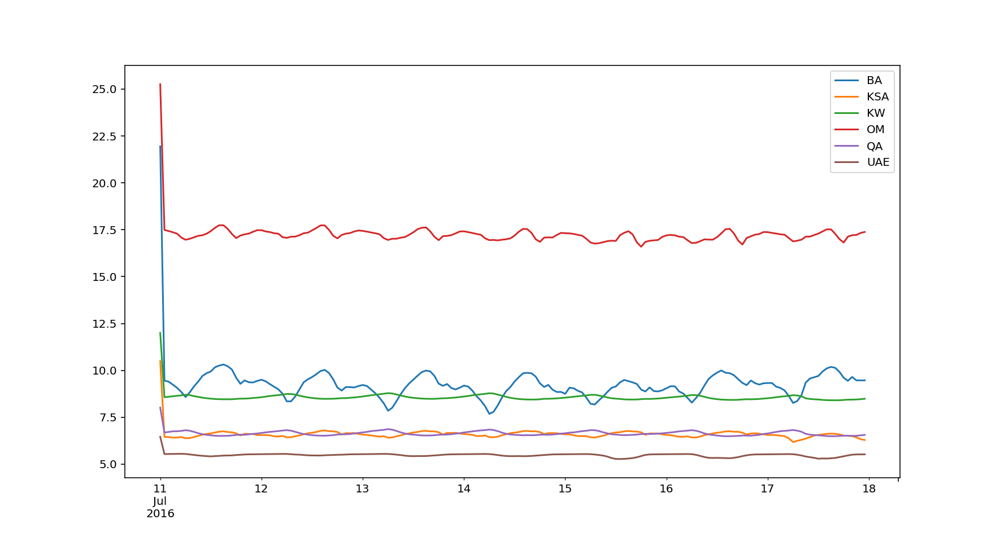

In [248]:
TotalZoneOperationCost = results_sub['TotalNodeOperationCost']
BBB = pd.DataFrame(TotalZoneOperationCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)
TotalZoneOperationCost['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost.index)

NodeDemand = datain_sub['Demand']['DA']
BBB = pd.DataFrame(NodeDemand[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA_Demand = BBB.sum(axis=1)
NodeDemand['KSA']= pd.Series(KSA_Demand.values, index=NodeDemand.index)

ElectrictyPrice=TotalZoneOperationCost.div(NodeDemand)
ElectrictyPrice.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot()

###results_int['NodeShadowPrice'].resample('D',how='mean')


/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


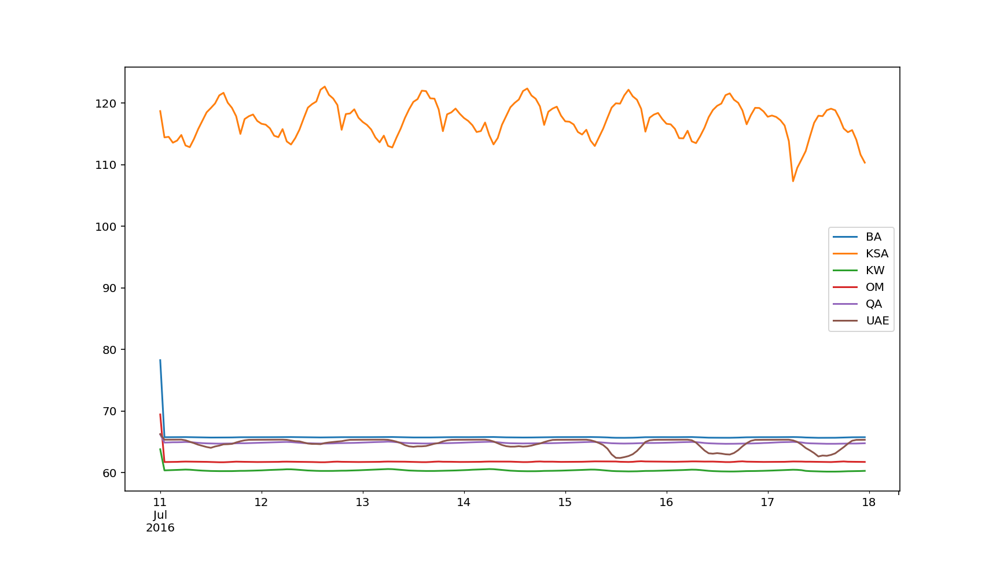

In [249]:
TotalZoneOperationCost = results_int_isolated['TotalNodeOperationCost']
BBB = pd.DataFrame(TotalZoneOperationCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)
TotalZoneOperationCost['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost.index)

NodeDemand = datain_int_isolated['Demand']['DA']
BBB = pd.DataFrame(NodeDemand[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA_Demand = BBB.sum(axis=1)
NodeDemand['KSA']= pd.Series(KSA_Demand.values, index=NodeDemand.index)

ElectrictyPrice=TotalZoneOperationCost.div(NodeDemand)
ElectrictyPrice.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot()

###results_int['NodeShadowPrice'].resample('D',how='mean')


/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


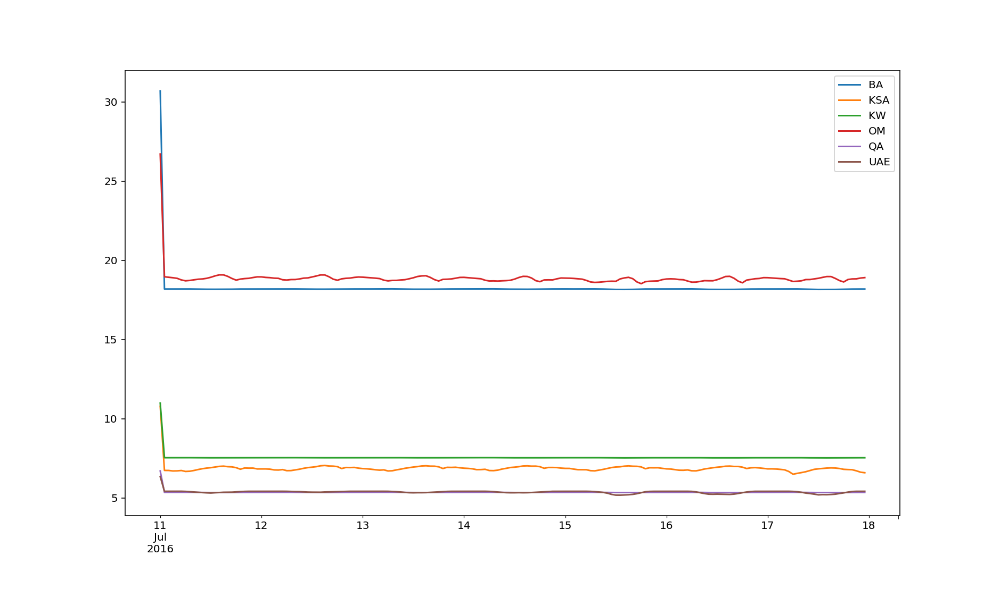

In [250]:
TotalZoneOperationCost = results_sub_isolated['TotalNodeOperationCost']
BBB = pd.DataFrame(TotalZoneOperationCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)
TotalZoneOperationCost['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost.index)

NodeDemand = datain_sub_isolated['Demand']['DA']
BBB = pd.DataFrame(NodeDemand[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA_Demand = BBB.sum(axis=1)
NodeDemand['KSA']= pd.Series(KSA_Demand.values, index=NodeDemand.index)

ElectrictyPrice=TotalZoneOperationCost.div(NodeDemand)
ElectrictyPrice.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot()

###results_int['NodeShadowPrice'].resample('D',how='mean')


<IPython.core.display.Javascript object>


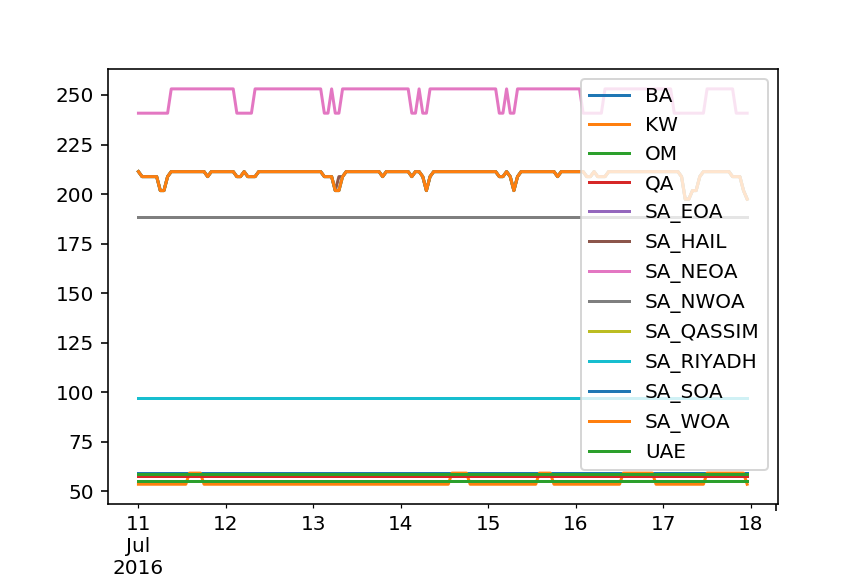

In [76]:
results_int['NodeShadowPrice'].plot()

<IPython.core.display.Javascript object>


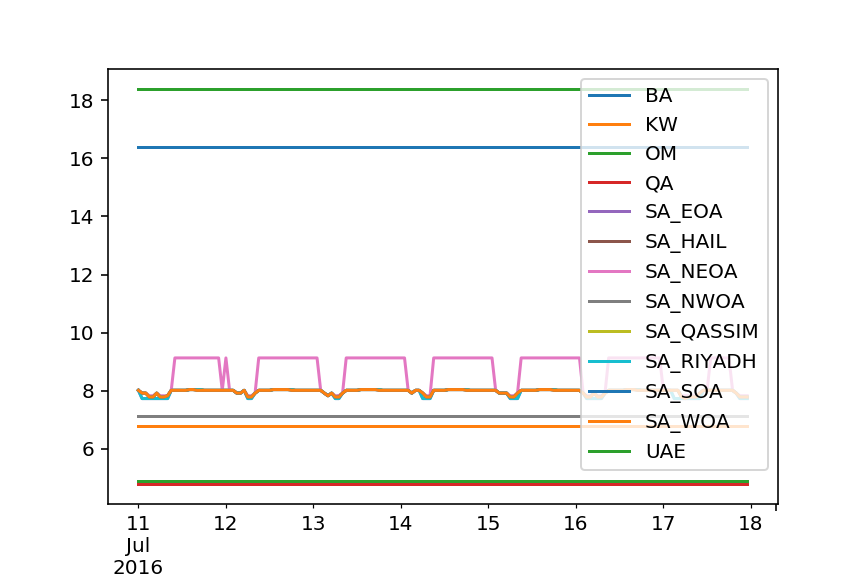

In [160]:
results_sub['NodeShadowPrice'].plot()

<IPython.core.display.Javascript object>


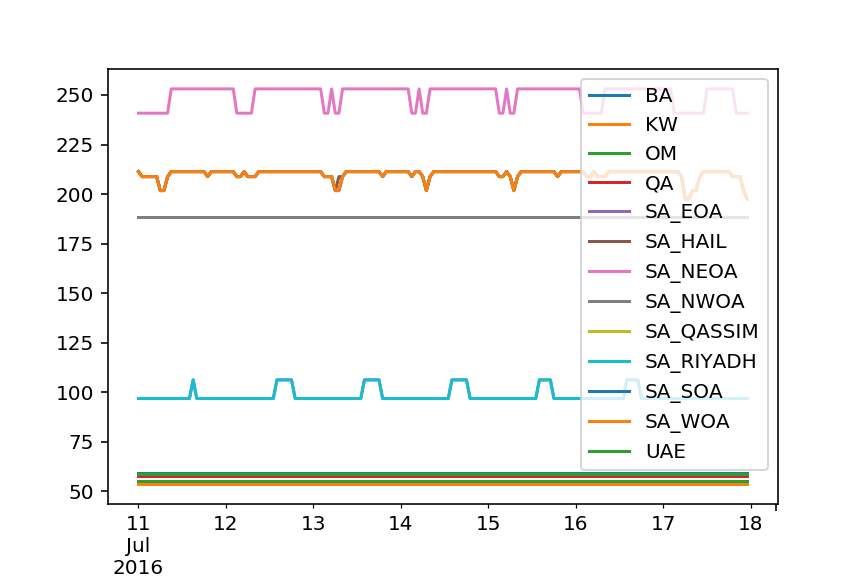

In [161]:
results_int_isolated['NodeShadowPrice'].plot()

<IPython.core.display.Javascript object>


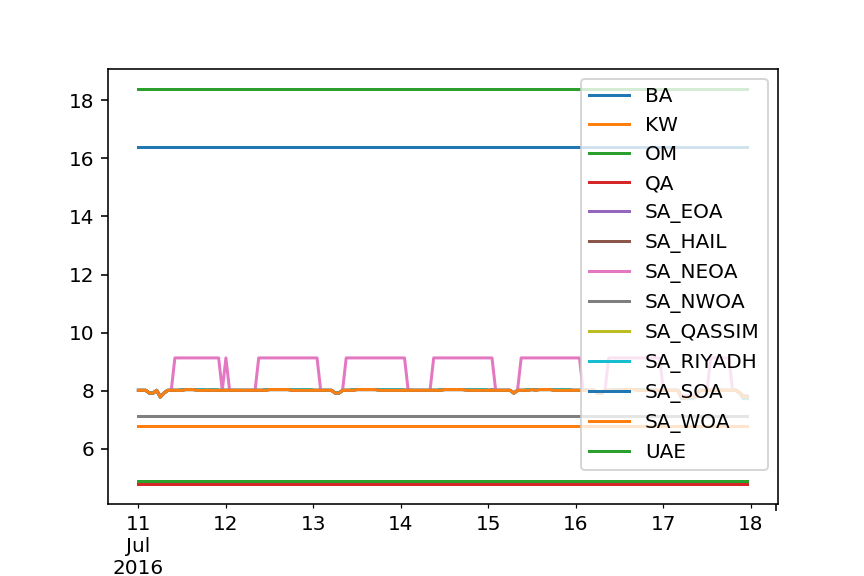

In [162]:
results_sub_isolated['NodeShadowPrice'].plot()

/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).mean()
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


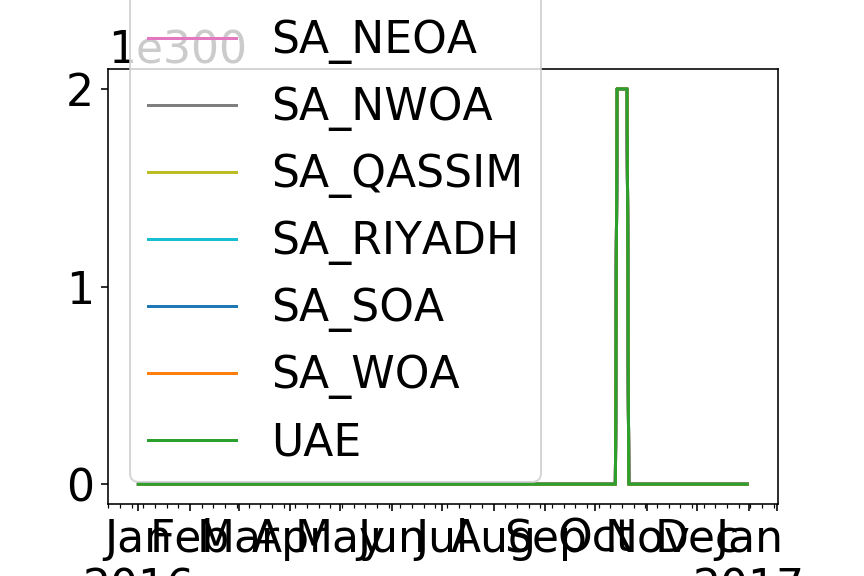

In [60]:
results_int['NodeShadowPrice'].resample('D',how='mean').drop([ 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot()


/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).mean()
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


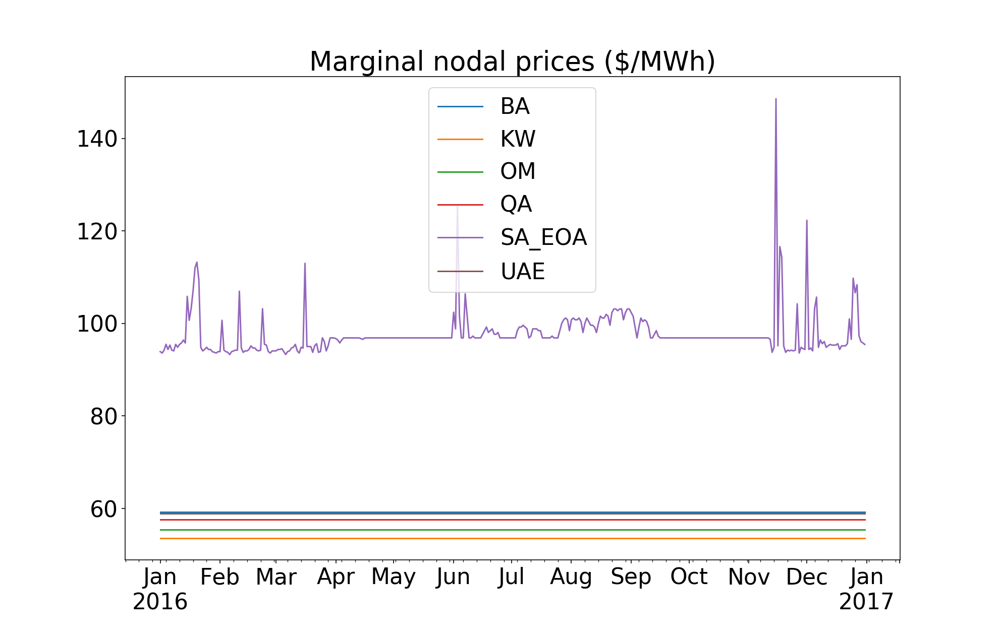

Text(0.5,1,'Marginal nodal prices ($/MWh)')

In [73]:
results_int_isolated['NodeShadowPrice'].resample('D',how='mean').drop([ 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot()
plt.title('Marginal nodal prices ($/MWh)')




/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel_launcher.py:1: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).mean()
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


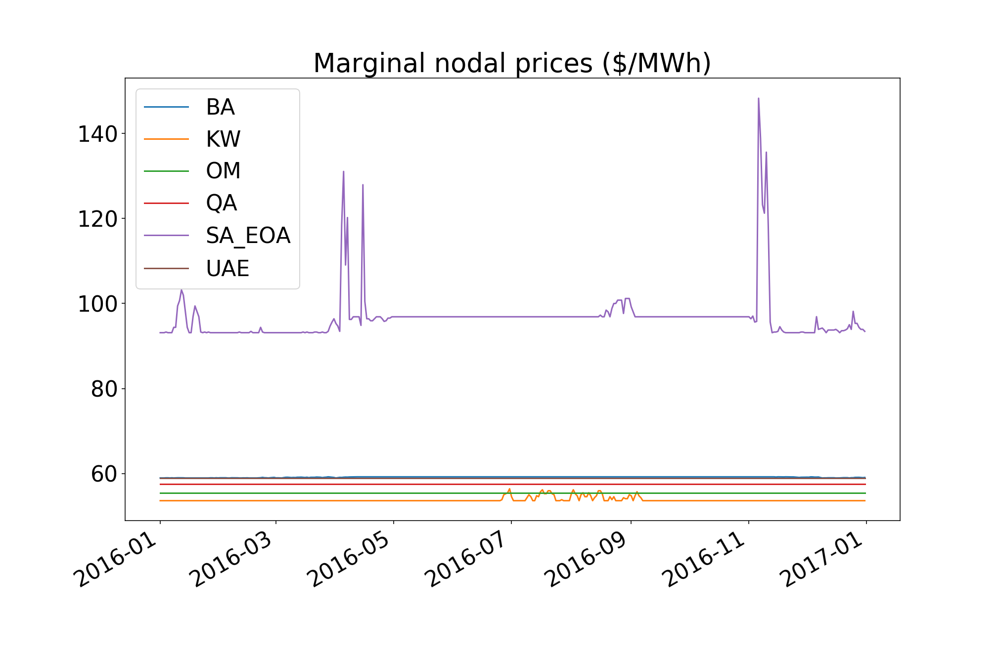

Text(0.5,1,'Marginal nodal prices ($/MWh)')

In [72]:
results_int['NodeShadowPrice'].resample('D',how='mean').drop(pd.DatetimeIndex(['2016-10-14','2016-10-15','2016-10-16','2016-10-17','2016-10-18','2016-10-19','2016-10-20']),axis=0).drop([ 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot()
plt.title('Marginal nodal prices ($/MWh)')



## Compare fuel consumption for each country (Trade vs No Trade)

<IPython.core.display.Javascript object>


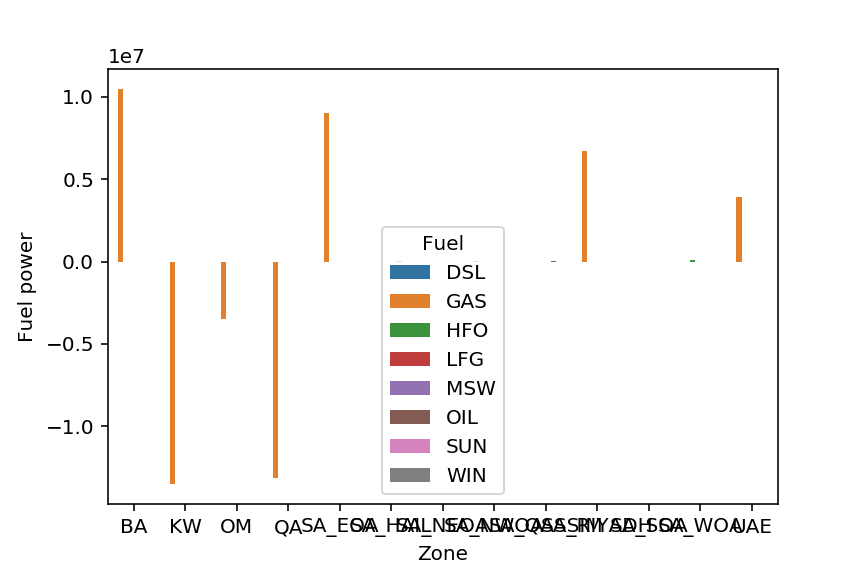

In [9]:
df = (results_int_isolated['NodeFuelPower'] - results_int['NodeFuelPower']).T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel power']
sns.barplot(data=df, x='Zone', y='Fuel power', hue='Fuel')


<IPython.core.display.Javascript object>


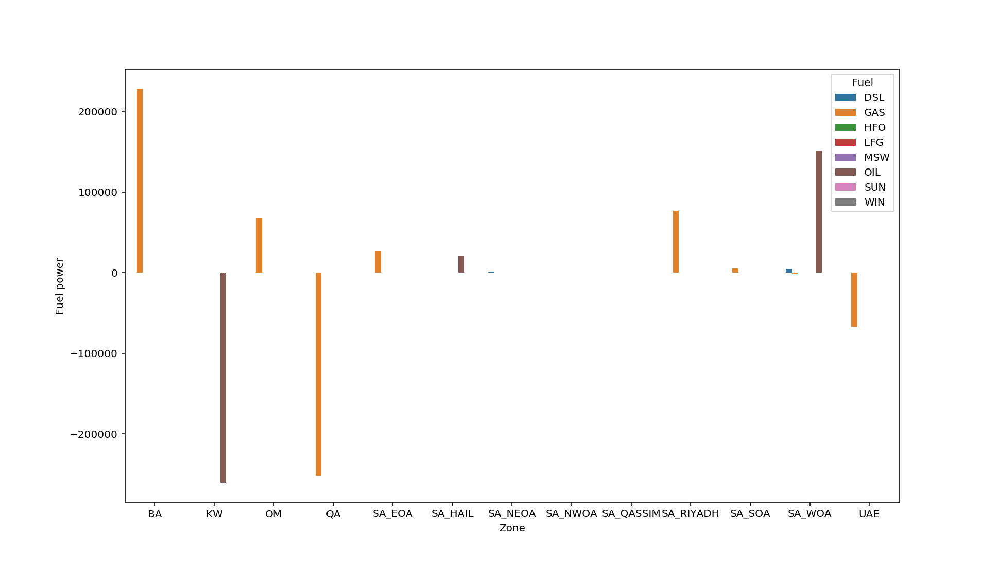

In [262]:
df = (results_sub_isolated['NodeFuelPower'] - results_sub['NodeFuelPower']).T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel power']
sns.barplot(data=df, x='Zone', y='Fuel power', hue='Fuel')



<IPython.core.display.Javascript object>


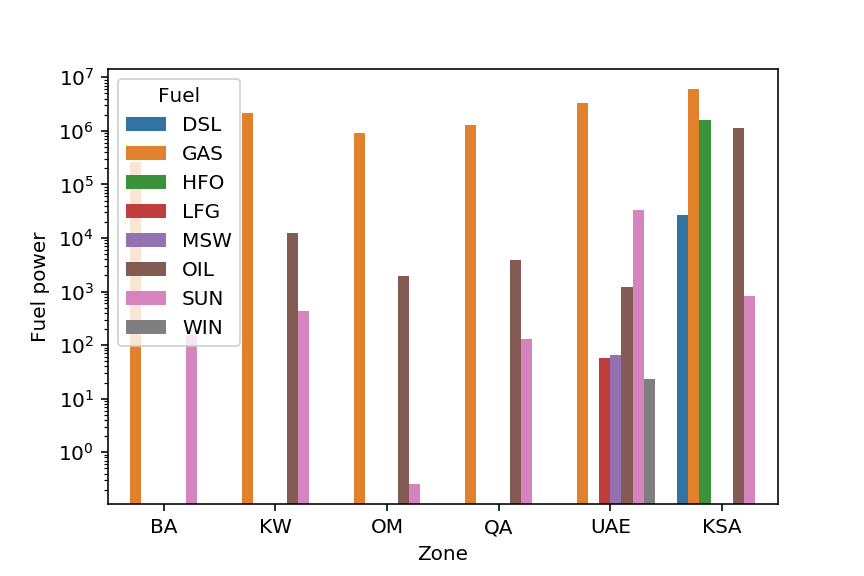

In [80]:
df = results_int['NodeFuelPower'].T.sort_index().sum(axis=1)
KSA = df['SA_EOA']+df['SA_HAIL']+df['SA_NEOA']+df['SA_NWOA']+df['SA_QASSIM']+df['SA_RIYADH']+df['SA_SOA']+df['SA_WOA']
df['KSA','DSL'] = KSA['DSL']
df['KSA','GAS'] = KSA['GAS']
df['KSA','HFO'] = KSA['HFO']
df['KSA','LFG'] = KSA['LFG']
df['KSA','MSW'] = KSA['MSW']
df['KSA','OIL'] = KSA['OIL']
df['KSA','SUN'] = KSA['SUN']
df['KSA','WIN'] = KSA['WIN']
df = df.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])
df = df.reset_index()
df.columns = ['Zone', 'Fuel', 'Fuel power']
sns.barplot(data=df, x='Zone', y='Fuel power', hue='Fuel').set_yscale('log')

<IPython.core.display.Javascript object>


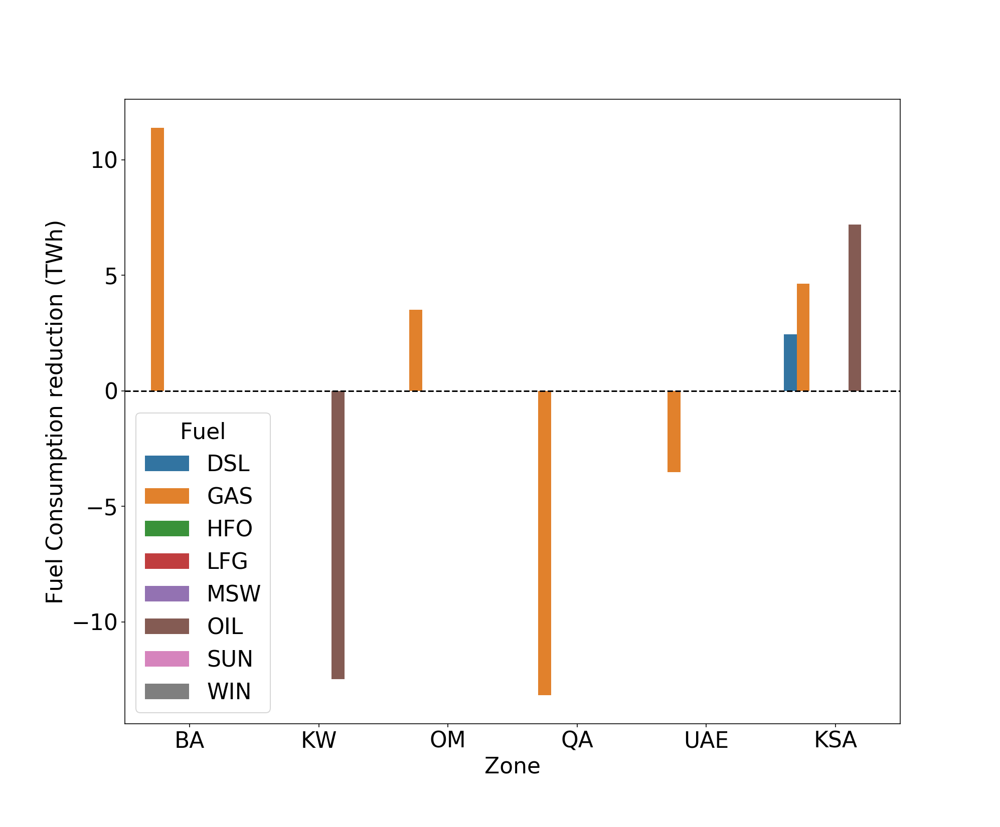

In [83]:
df1 = results_sub_isolated['NodeFuelPower'].T.sort_index().sum(axis=1)*(1/1000000)
KSA = df1['SA_EOA']+df1['SA_HAIL']+df1['SA_NEOA']+df1['SA_NWOA']+df1['SA_QASSIM']+df1['SA_RIYADH']+df1['SA_SOA']+df1['SA_WOA']
df1['KSA','DSL'] = KSA['DSL']
df1['KSA','GAS'] = KSA['GAS']
df1['KSA','HFO'] = KSA['HFO']
df1['KSA','LFG'] = KSA['LFG']
df1['KSA','MSW'] = KSA['MSW']
df1['KSA','OIL'] = KSA['OIL']
df1['KSA','SUN'] = KSA['SUN']
df1['KSA','WIN'] = KSA['WIN']
df1 = df1.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])

df2 = results_sub['NodeFuelPower'].T.sort_index().sum(axis=1)*(1/1000000)
KSA = df2['SA_EOA']+df2['SA_HAIL']+df2['SA_NEOA']+df2['SA_NWOA']+df2['SA_QASSIM']+df2['SA_RIYADH']+df2['SA_SOA']+df2['SA_WOA']
df2['KSA','DSL'] = KSA['DSL']
df2['KSA','GAS'] = KSA['GAS']
df2['KSA','HFO'] = KSA['HFO']
df2['KSA','LFG'] = KSA['LFG']
df2['KSA','MSW'] = KSA['MSW']
df2['KSA','OIL'] = KSA['OIL']
df2['KSA','SUN'] = KSA['SUN']
df2['KSA','WIN'] = KSA['WIN']
df2 = df2.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])

df= df1-df2
df = df.reset_index()
df.columns = ['Zone', 'Fuel', 'Fuel Consumption reduction (TWh)']
sns.barplot(data=df, x='Zone', y='Fuel Consumption reduction (TWh)', hue='Fuel').axhline(0, ls='--',color='k')

In [86]:
results_int['NodeFuelPower']

,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,...,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE
,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,MSW,MSW,MSW,MSW,...,DSL,DSL,DSL,DSL,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN
2016-01-01 00:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,0.0,162.000000,0.0,0,0,0.0,0.0,0.0,0.0,0.0,22.0,25.0,0.0,0,0,0,0,...,0,0.0,0,0,0,0,0,0,0,4522.057222,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.133972
2016-01-01 01:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,0.0,162.000000,0.0,0,0,0.0,0.0,0.0,0.0,0.0,22.0,25.0,0.0,0,0,0,0,...,0,0.0,0,0,0,0,0,0,0,4522.057222,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.133972
2016-01-01 02:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,0.0,162.000000,0.0,0,0,0.0,0.0,0.0,0.0,0.0,22.0,25.0,0.0,0,0,0,0,...,0,0.0,0,0,0,0,0,0,0,4522.057222,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.155163
2016-01-01 03:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,0.0,162.000000,0.0,0,0,0.0,0.0,0.0,0.0,0.0,22.0,25.0,0.0,0,0,0,0,...,0,0.0,0,0,0,0,0,0,0,4069.636222,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.163486
2016-01-01 04:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,0.0,162.000000,0.0,0,0,0.0,0.0,0.0,0.0,0.0,22.0,25.0,0.0,0,0,0,0,...,0,0.0,0,0,0,0,0,0,0,3735.684222,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.179379
2016-01-01 05:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,0.0,162.000000,0.0,0,0,0.0,0.0,0.0,0.0,0.0,22.0,25.0,0.0,0,0,0,0,...,0,0.0,0,0,0,0,0,0,0,3433.747222,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.246737
2016-01-01 06:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,0.0,162.000000,0.0,0,0,0.0,0.0,0.0,0.0,0.0,22.0,25.0,0.0,0,0,0,0,...,0,0.0,0,0,0,0,0,0,0,3669.108222,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.240679
2016-01-01 07:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,0.0,632.706294,0.0,0,0,0.0,0.0,0.0,0.0,0.0,22.0,25.0,0.0,0,0,0,0,...,0,0.0,0,0,0,0,0,0,0,2771.773222,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.205104
2016-01-01 08:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,0.0,553.077294,0.0,0,0,0.0,0.0,0.0,0.0,0.0,22.0,25.0,0.0,0,0,0,0,...,0,0.0,0,0,0,0,0,0,0,2893.250222,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.245214


In [164]:
results_sub['NodeFuelPower']

,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,...,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE
,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,MSW,MSW,MSW,MSW,...,DSL,DSL,DSL,DSL,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN
2016-07-11 00:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,841.340135,578.46,0,0,2647.877566,12.000,22.828431,7566.0745,13017.497020,22.0,842.598268,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157239
2016-07-11 01:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,841.311135,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,12781.137020,22.0,71.580873,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.138655
2016-07-11 02:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,871.959135,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,12490.217020,22.0,85.207873,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157235
2016-07-11 03:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,871.929135,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,12246.577020,22.0,25.000000,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.164380
2016-07-11 04:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,856.926135,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,12038.817020,22.0,25.000000,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.160090
2016-07-11 05:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,830.968135,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,11800.427020,22.0,237.346873,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.158659
2016-07-11 06:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,717.296785,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,11519.801608,22.0,25.000000,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.159372
2016-07-11 07:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,724.624615,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,11677.721703,22.0,25.000000,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.139359
2016-07-11 08:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,785.134229,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,12158.121202,22.0,25.000000,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.090761


In [165]:
results_int_isolated['NodeFuelPower']

,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,...,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE
,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,MSW,MSW,MSW,MSW,...,DSL,DSL,DSL,DSL,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN
2016-07-11 00:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072000,889.775429,11.859505,0,0,2072.771955,320.281,22.828431,190.0,74.274517,22.0,842.598268,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157239
2016-07-11 01:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072000,889.746429,11.859505,0,0,2417.000000,306.118,22.828431,190.0,74.274517,22.0,451.100222,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.138655
2016-07-11 02:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072000,920.394429,11.859505,0,0,2417.000000,290.093,22.828431,190.0,74.274517,22.0,480.752222,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157235
2016-07-11 03:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072000,920.364429,11.859505,0,0,2417.000000,272.137,22.828431,190.0,74.274517,22.0,67.660222,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.164380
2016-07-11 04:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072000,905.361429,11.859505,0,0,2417.000000,263.605,22.828431,190.0,74.274517,22.0,240.147222,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.160090
2016-07-11 05:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072000,879.403429,11.859505,0,0,2417.000000,293.429,22.828431,190.0,74.274517,22.0,629.555222,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.158659
2016-07-11 06:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1208.301429,765.732079,11.859505,0,0,2417.000000,257.323,22.828431,190.0,74.274517,22.0,25.000000,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.159372
2016-07-11 07:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1064.280085,773.059909,11.859505,0,0,2417.000000,285.654,22.828431,190.0,74.274517,22.0,25.000000,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.139359
2016-07-11 08:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072000,833.569523,11.859505,0,0,2417.000000,312.876,22.828431,190.0,74.274517,22.0,381.899190,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.090761


In [166]:
results_sub_isolated['NodeFuelPower']

,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,...,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE
,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,MSW,MSW,MSW,MSW,...,DSL,DSL,DSL,DSL,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN
2016-07-11 00:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,841.340135,578.46,0,0,4337.877566,12.000,22.828431,7566.0745,11467.497020,22.0,842.598268,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157239
2016-07-11 01:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,841.311135,578.46,0,0,2881.647566,12.000,22.828431,8838.0745,11231.137020,22.0,842.598268,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.138655
2016-07-11 02:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,871.959135,578.46,0,0,2788.136566,12.000,22.828431,8838.0745,10940.217020,22.0,842.598268,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157235
2016-07-11 03:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,871.929135,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,10696.577020,22.0,431.394833,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.164380
2016-07-11 04:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,856.926135,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,10488.817020,22.0,587.772833,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.160090
2016-07-11 05:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,830.968135,578.46,0,0,2749.517566,12.000,22.828431,8838.0745,10250.427020,22.0,842.598268,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.158659
2016-07-11 06:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,717.296785,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,9969.801608,22.0,25.000000,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.159372
2016-07-11 07:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,724.624615,578.46,0,0,2417.000000,12.000,22.828431,8838.0745,10127.721703,22.0,122.282624,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.139359
2016-07-11 08:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.339843,1247.072,785.134229,578.46,0,0,2827.678645,12.000,22.828431,8838.0745,10608.121202,22.0,842.598268,7.137141,0,0,0,0,...,0,8.0,0,0,0,0,0,0,0,9666.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.090761


<IPython.core.display.Javascript object>


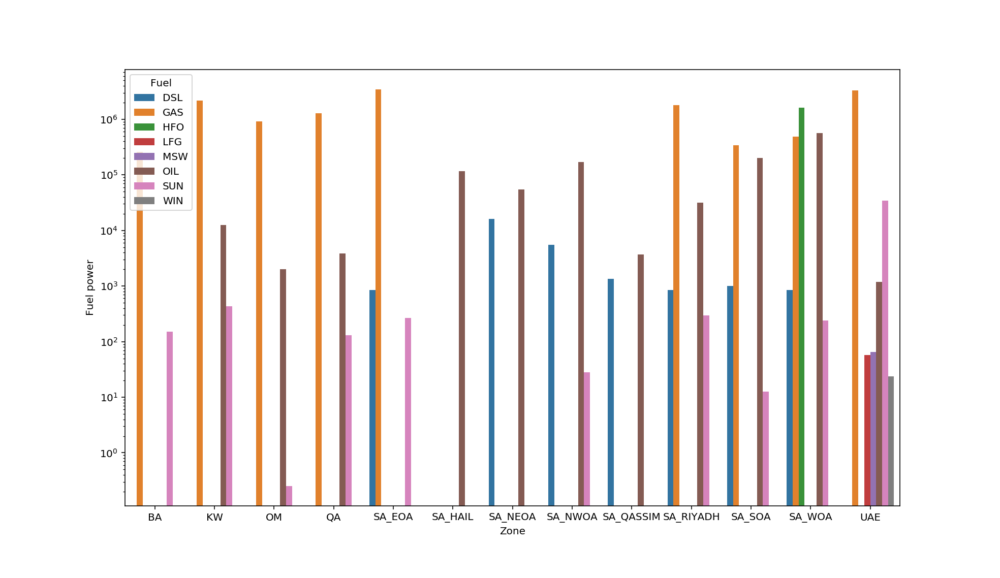

In [137]:
df = results_int['NodeFuelPower'].T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel power']
sns.barplot(data=df, x='Zone', y='Fuel power', hue='Fuel').set_yscale('log')


<IPython.core.display.Javascript object>


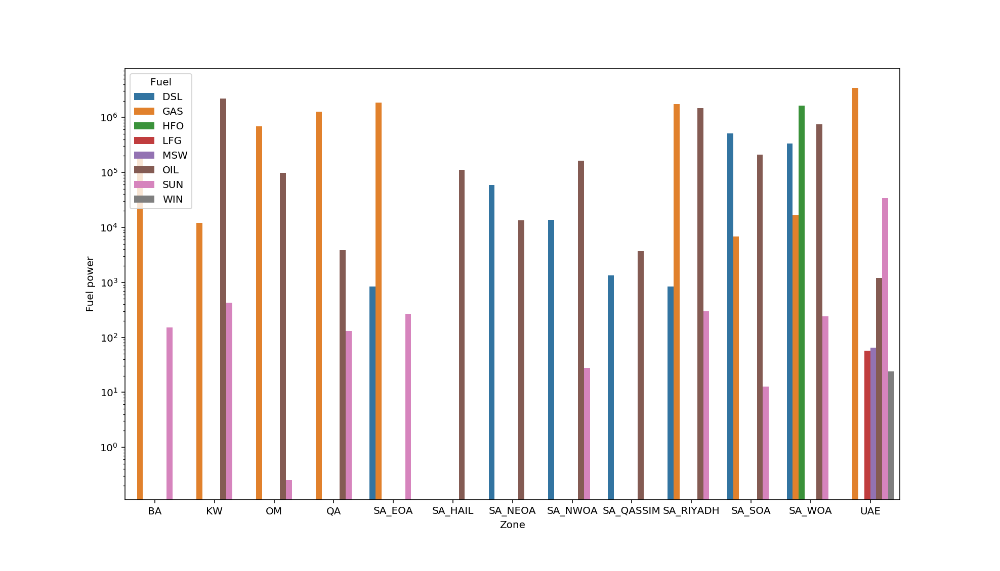

In [139]:
df = results_sub['NodeFuelPower'].T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel power']
sns.barplot(data=df, x='Zone', y='Fuel power', hue='Fuel').set_yscale('log')


<IPython.core.display.Javascript object>


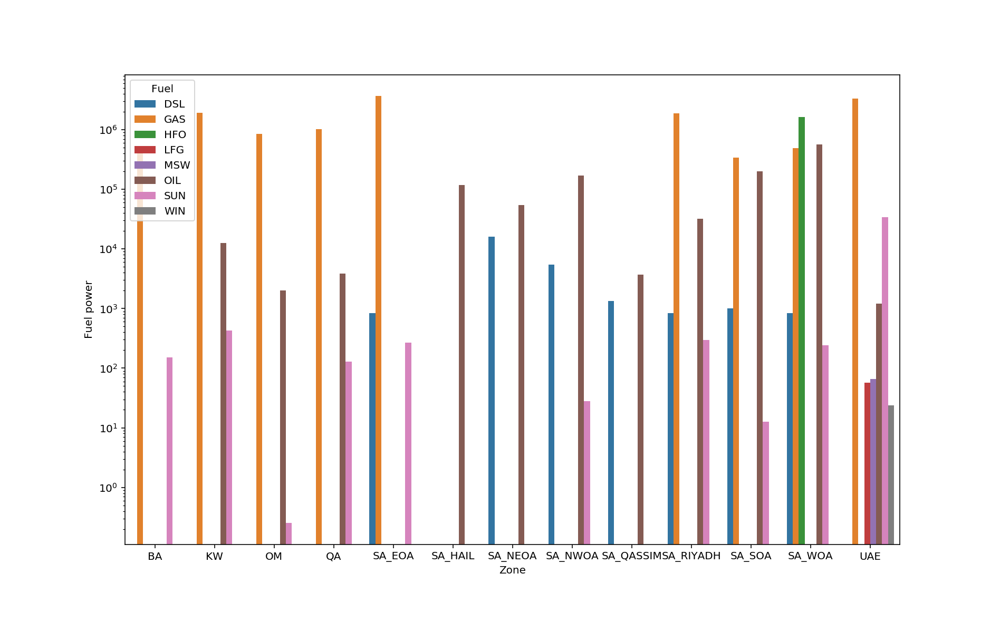

In [160]:
df = results_int_isolated['NodeFuelPower'].T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel power']
sns.barplot(data=df, x='Zone', y='Fuel power', hue='Fuel').set_yscale('log')


<IPython.core.display.Javascript object>


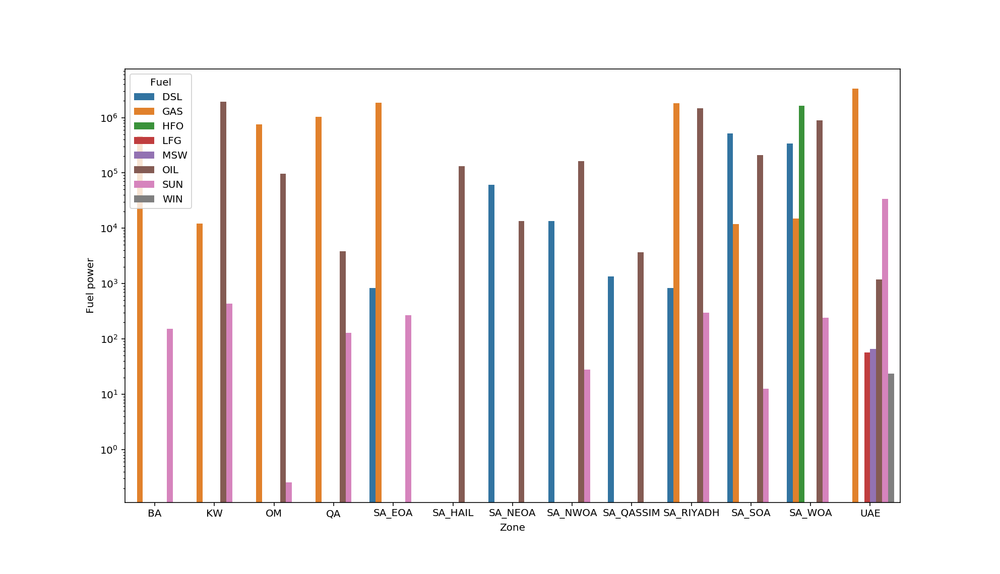

In [141]:
df = results_sub_isolated['NodeFuelPower'].T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel power']
sns.barplot(data=df, x='Zone', y='Fuel power', hue='Fuel').set_yscale('log')


<IPython.core.display.Javascript object>


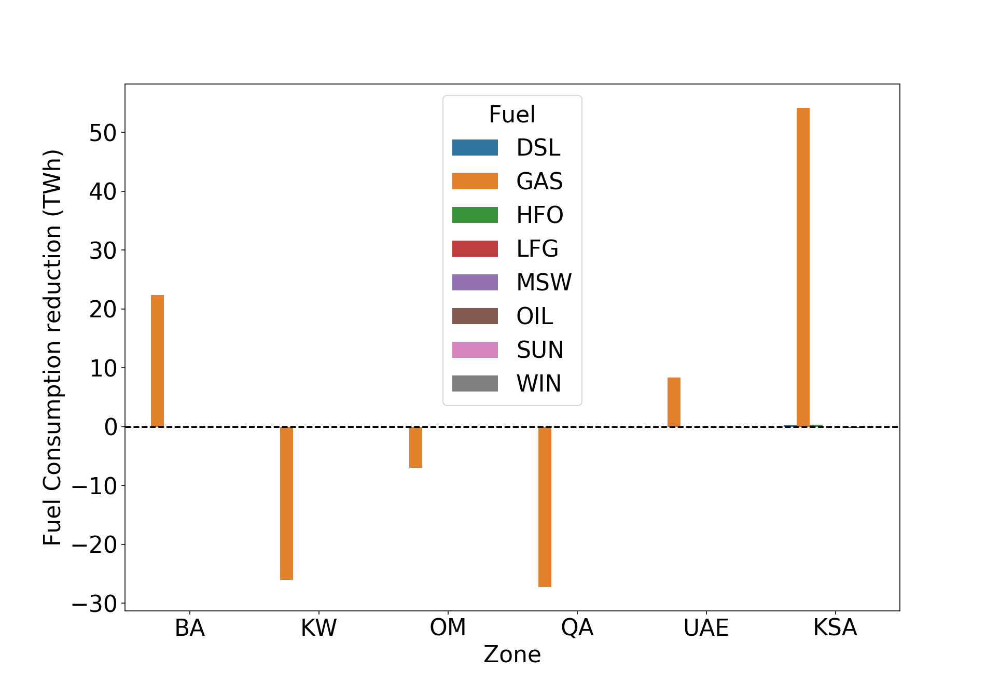

In [81]:
df1 = results_int_isolated['NodeFuelConsumption'].T.sort_index().sum(axis=1)*(1/1000000)
KSA = df1['SA_EOA']+df1['SA_HAIL']+df1['SA_NEOA']+df1['SA_NWOA']+df1['SA_QASSIM']+df1['SA_RIYADH']+df1['SA_SOA']+df1['SA_WOA']
df1['KSA','DSL'] = KSA['DSL']
df1['KSA','GAS'] = KSA['GAS']
df1['KSA','HFO'] = KSA['HFO']
df1['KSA','LFG'] = KSA['LFG']
df1['KSA','MSW'] = KSA['MSW']
df1['KSA','OIL'] = KSA['OIL']
df1['KSA','SUN'] = KSA['SUN']
df1['KSA','WIN'] = KSA['WIN']
df1 = df1.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])

df2 = results_int['NodeFuelConsumption'].T.sort_index().sum(axis=1)*(1/1000000)
KSA = df2['SA_EOA']+df2['SA_HAIL']+df2['SA_NEOA']+df2['SA_NWOA']+df2['SA_QASSIM']+df2['SA_RIYADH']+df2['SA_SOA']+df2['SA_WOA']
df2['KSA','DSL'] = KSA['DSL']
df2['KSA','GAS'] = KSA['GAS']
df2['KSA','HFO'] = KSA['HFO']
df2['KSA','LFG'] = KSA['LFG']
df2['KSA','MSW'] = KSA['MSW']
df2['KSA','OIL'] = KSA['OIL']
df2['KSA','SUN'] = KSA['SUN']
df2['KSA','WIN'] = KSA['WIN']
df2 = df2.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])

df= df1-df2
df = df.reset_index()
df.columns = ['Zone', 'Fuel', 'Fuel Consumption reduction (TWh)']
sns.barplot(data=df, x='Zone', y='Fuel Consumption reduction (TWh)', hue='Fuel').axhline(0, ls='--',color='k')

<IPython.core.display.Javascript object>


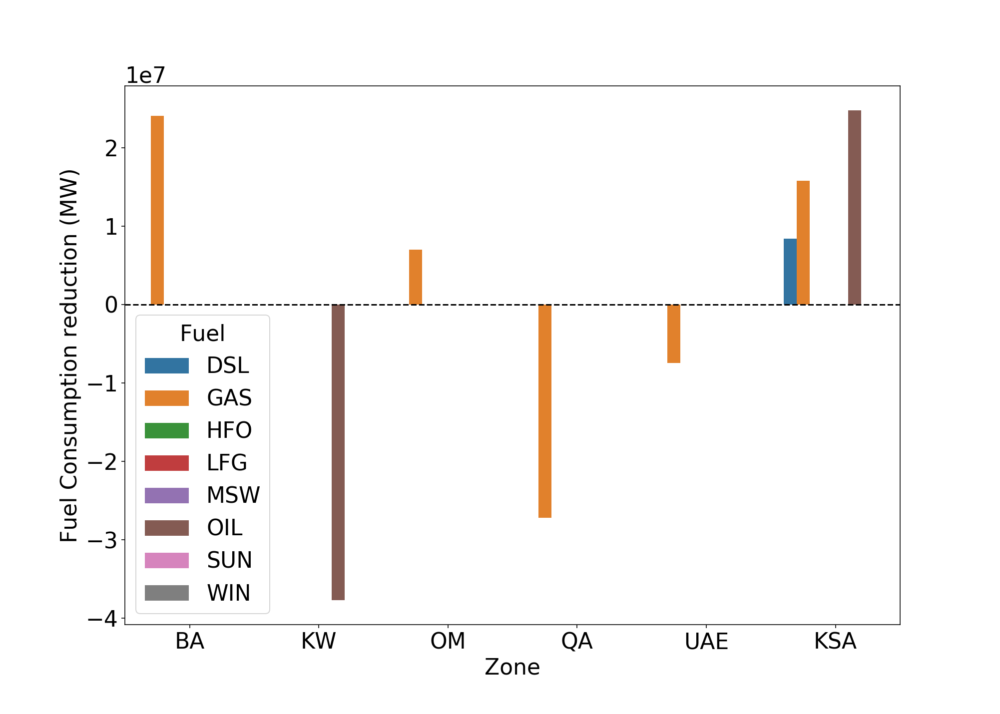

In [77]:
df1 = results_sub_isolated['NodeFuelConsumption'].T.sort_index().sum(axis=1)
KSA = df1['SA_EOA']+df1['SA_HAIL']+df1['SA_NEOA']+df1['SA_NWOA']+df1['SA_QASSIM']+df1['SA_RIYADH']+df1['SA_SOA']+df1['SA_WOA']
df1['KSA','DSL'] = KSA['DSL']
df1['KSA','GAS'] = KSA['GAS']
df1['KSA','HFO'] = KSA['HFO']
df1['KSA','LFG'] = KSA['LFG']
df1['KSA','MSW'] = KSA['MSW']
df1['KSA','OIL'] = KSA['OIL']
df1['KSA','SUN'] = KSA['SUN']
df1['KSA','WIN'] = KSA['WIN']
df1 = df1.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])

df2 = results_sub['NodeFuelConsumption'].T.sort_index().sum(axis=1)
KSA = df2['SA_EOA']+df2['SA_HAIL']+df2['SA_NEOA']+df2['SA_NWOA']+df2['SA_QASSIM']+df2['SA_RIYADH']+df2['SA_SOA']+df2['SA_WOA']
df2['KSA','DSL'] = KSA['DSL']
df2['KSA','GAS'] = KSA['GAS']
df2['KSA','HFO'] = KSA['HFO']
df2['KSA','LFG'] = KSA['LFG']
df2['KSA','MSW'] = KSA['MSW']
df2['KSA','OIL'] = KSA['OIL']
df2['KSA','SUN'] = KSA['SUN']
df2['KSA','WIN'] = KSA['WIN']
df2 = df2.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])

df= df1-df2
df = df.reset_index()
df.columns = ['Zone', 'Fuel', 'Fuel Consumption reduction (MW)']
sns.barplot(data=df, x='Zone', y='Fuel Consumption reduction (MW)', hue='Fuel').axhline(0, ls='--',color='k')

<IPython.core.display.Javascript object>


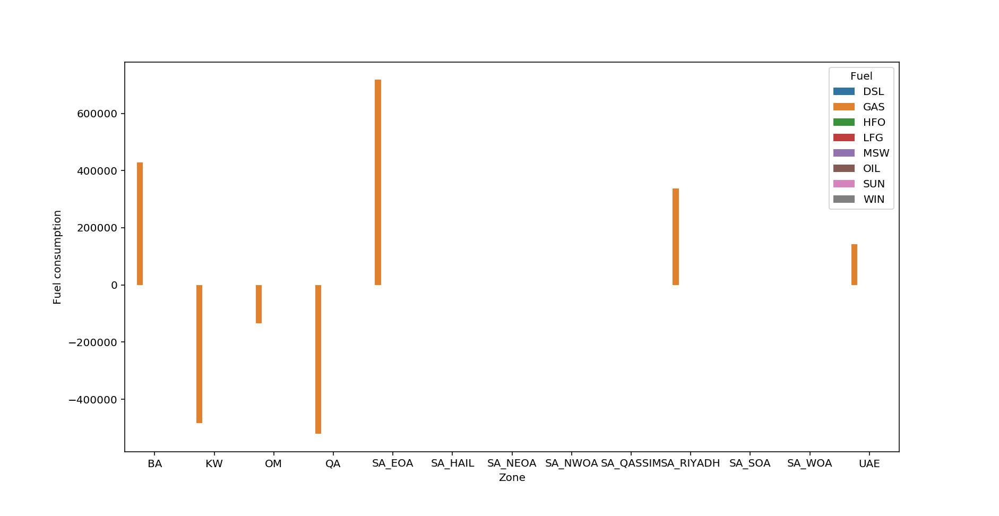

In [263]:
df = (results_int_isolated['NodeFuelConsumption'] - results_int['NodeFuelConsumption']).T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel consumption']
sns.barplot(data=df, x='Zone', y='Fuel consumption', hue='Fuel')


<IPython.core.display.Javascript object>


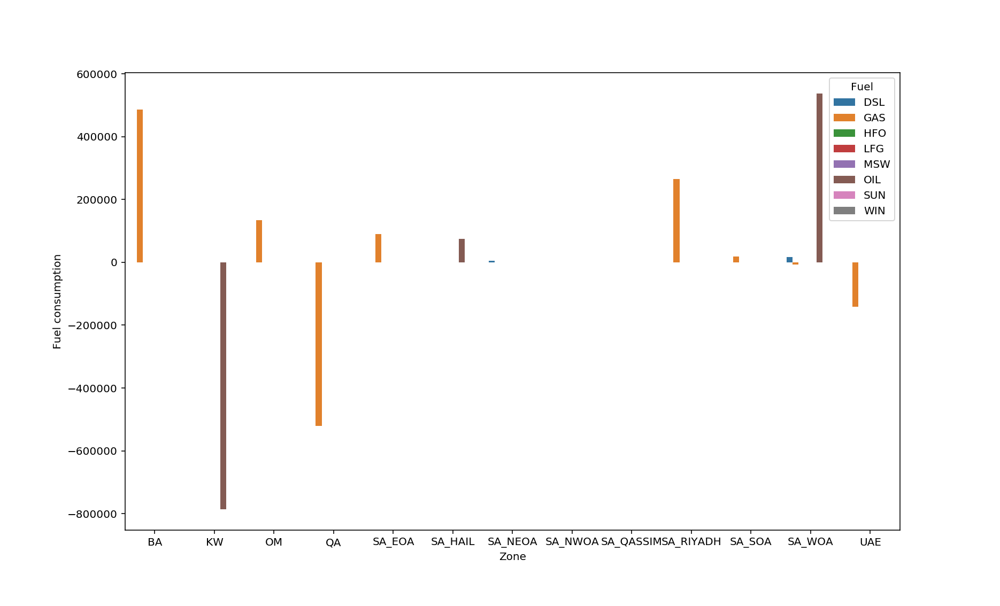

In [264]:
df = (results_sub_isolated['NodeFuelConsumption'] - results_sub['NodeFuelConsumption']).T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel consumption']
sns.barplot(data=df, x='Zone', y='Fuel consumption', hue='Fuel')


In [104]:
results_int['NodeFuelConsumption'].T.loc[['SA_SOA'],]
#.resample('D').sum().plot()

2016-01-01 00:00:00  2016-01-01 01:00:00  2016-01-01 02:00:00  \
SA_SOA LFG             0.000000             0.000000             0.000000   
       OIL             0.000000             0.000000             0.000000   
       MSW             0.000000             0.000000             0.000000   
       SUN             0.000000             0.000000             0.000000   
       GAS          7007.871794          7007.871794          7007.871794   
       DSL             0.000000             0.000000             0.000000   
       HFO             0.000000             0.000000             0.000000   
       WIN             0.000000             0.000000             0.000000   

            2016-01-01 03:00:00  2016-01-01 04:00:00  2016-01-01 05:00:00  \
SA_SOA LFG             0.000000             0.000000             0.000000   
       OIL             0.000000             0.000000             0.000000   
       MSW             0.000000             0.000000             0.000000   
       SUN             0.000000             0.000000             0.000000   
       GAS          7007.871794          7007.871794          7007.871794   
       DSL             0.000000             0.000000             0.000000   
       HFO             0.000000             0.000000             0.000000   
       WIN             0.000000             0.000000             0.000000   

            2016-01-01 06:00:00  2016-01-01 07:00:00  2016-01-01 08:00:00  \
SA_SOA LFG             0.000000             0.000000             0.000000   
       OIL             0.000000             0.000000             0.000000   
       MSW             0.000000             0.000000             0.000000   
       SUN             0.000000             0.000000             0.000000   
       GAS          7007.871794          7007.871794          7007.871794   
       DSL             0.000000             0.000000             0.000000   
       HFO             0.000000             0.000000             0.000000   
       WIN             0.000000             0.000000             0.000000   

            2016-01-01 09:00:00  2016-01-01 10:00:00  2016-01-01 11:00:00  \
SA_SOA LFG             0.000000             0.000000             0.000000   
       OIL             0.000000             0.000000             0.000000   
       MSW             0.000000             0.000000             0.000000   
       SUN             0.000000             0.015747             0.063495   
       GAS          7007.871794          7007.871794          7007.871794   
       DSL             0.000000             0.000000             0.000000   
       HFO             0.000000             0.000000             0.000000   
       WIN             0.000000             0.000000             0.000000   

            2016-01-01 12:00:00  2016-01-01 13:00:00  2016-01-01 14:00:00  \
SA_SOA LFG             0.000000             0.000000             0.000000   
       OIL             0.000000             0.000000             0.000000   
       MSW             0.000000             0.000000             0.000000   
       SUN             0.125296             0.158822             0.143752   
       GAS          7007.871794          7007.871794          7007.871794   
       DSL             0.000000             0.000000             0.000000   
       HFO             0.000000             0.000000             0.000000   
       WIN             0.000000             0.000000             0.000000   

            2016-01-01 15:00:00  2016-01-01 16:00:00  2016-01-01 17:00:00  \
SA_SOA LFG             0.000000             0.000000             0.000000   
       OIL             0.000000             0.000000             0.000000   
       MSW             0.000000             0.000000             0.000000   
       SUN             0.090924             0.043515             0.006942   
       GAS          7007.871794          7007.871794          7007.871794   
       DSL             0.000000             0.000000             0.000000   
   

In [144]:
results_sub['NodeFuelConsumption']

,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,...,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE
,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,MSW,MSW,MSW,MSW,...,DSL,DSL,DSL,DSL,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN
2016-07-11 00:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2719.954485,1576.442858,0,0,9007.466757,48.685863,65.651938,24431.182908,39339.398193,80.266633,2964.280754,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157239
2016-07-11 01:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2719.862532,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,38625.498704,80.266633,251.823213,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.138655
2016-07-11 02:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2817.041447,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,37746.806713,80.266633,299.763323,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157235
2016-07-11 03:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2816.946323,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,37010.918782,80.266633,87.950595,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.164380
2016-07-11 04:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2769.374694,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,36383.402461,80.266633,87.950595,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.160090
2016-07-11 05:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2687.066868,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,35663.371580,80.266633,834.991945,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.158659
2016-07-11 06:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2326.636873,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,34815.773265,80.266633,87.950595,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.159372
2016-07-11 07:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2349.872012,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,35292.753612,80.266633,87.950595,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.139359
2016-07-11 08:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2541.736365,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,36743.747674,80.266633,87.950595,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.090761


In [145]:
results_int_isolated['NodeFuelConsumption']

,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,...,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE
,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,MSW,MSW,MSW,MSW,...,DSL,DSL,DSL,DSL,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN
2016-07-11 00:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2873.533490,39.338797,0,0,6959.810819,1299.429731,65.651938,531.732264,245.812467,80.266633,2964.280754,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157239
2016-07-11 01:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2873.441536,39.338797,0,0,8046.896364,1241.968242,65.651938,531.732264,245.812467,80.266633,1586.981315,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.138655
2016-07-11 02:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2970.620451,39.338797,0,0,8046.896364,1176.952329,65.651938,531.732264,245.812467,80.266633,1691.297757,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157235
2016-07-11 03:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2970.525327,39.338797,0,0,8046.896364,1104.102050,65.651938,531.732264,245.812467,80.266633,238.030272,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.164380
2016-07-11 04:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2922.953699,39.338797,0,0,8046.896364,1069.486402,65.651938,531.732264,245.812467,80.266633,844.843642,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.160090
2016-07-11 05:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2840.645872,39.338797,0,0,8046.896364,1190.486999,65.651938,531.732264,245.812467,80.266633,2214.790251,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.158659
2016-07-11 06:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4107.420737,2480.215878,39.338797,0,0,8046.896364,1043.999353,65.651938,531.732264,245.812467,80.266633,87.950595,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.159372
2016-07-11 07:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,3617.844013,2503.451017,39.338797,0,0,8046.896364,1158.942617,65.651938,531.732264,245.812467,80.266633,87.950595,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.139359
2016-07-11 08:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2695.315370,39.338797,0,0,8046.896364,1269.386497,65.651938,531.732264,245.812467,80.266633,1343.530436,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.090761


In [146]:
results_sub_isolated['NodeFuelConsumption']

,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,...,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE,SA_SOA,SA_NWOA,OM,BA,SA_EOA,SA_WOA,SA_NEOA,QA,SA_RIYADH,KW,SA_QASSIM,SA_HAIL,UAE
,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,LFG,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,OIL,MSW,MSW,MSW,MSW,...,DSL,DSL,DSL,DSL,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,HFO,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN,WIN
2016-07-11 00:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2719.954485,1576.442858,0,0,15024.689451,48.685863,65.651938,24431.182908,34657.792985,80.266633,2964.280754,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157239
2016-07-11 01:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2719.862532,1576.442858,0,0,9701.267889,48.685863,65.651938,27901.293863,33943.893497,80.266633,2964.280754,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.138655
2016-07-11 02:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2817.041447,1576.442858,0,0,9368.323208,48.685863,65.651938,27901.293863,33065.201505,80.266633,2964.280754,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.157235
2016-07-11 03:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2816.946323,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,32329.313574,80.266633,1517.657288,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.164380
2016-07-11 04:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2769.374694,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,31701.797253,80.266633,2067.798813,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.160090
2016-07-11 05:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2687.066868,1576.442858,0,0,9230.820768,48.685863,65.651938,27901.293863,30981.766372,80.266633,2964.280754,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.158659
2016-07-11 06:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2326.636873,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,30134.168057,80.266633,87.950595,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.159372
2016-07-11 07:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2349.872012,1576.442858,0,0,8046.896364,48.685863,65.651938,27901.293863,30611.148405,80.266633,430.193180,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.139359
2016-07-11 08:00:00,0,0,0,0,0,0,0,0,0,0,0,0,0.653545,4239.214875,2541.736365,1576.442858,0,0,9509.112258,48.685863,65.651938,27901.293863,32062.142466,80.266633,2964.280754,20.523966,0,0,0,0,...,0,41.536715,0,0,0,0,0,0,0,25063.874501,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.090761


In [16]:
df = results1['NodeFuelConsumption'].T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel consumption']
sns.barplot(data=df, x='Zone', y='Fuel consumption', hue='Fuel').set_yscale('log')


In [17]:
df = results2['NodeFuelConsumption'].T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel consumption']
sns.barplot(data=df, x='Zone', y='Fuel consumption', hue='Fuel').set_yscale('log')


<IPython.core.display.Javascript object>


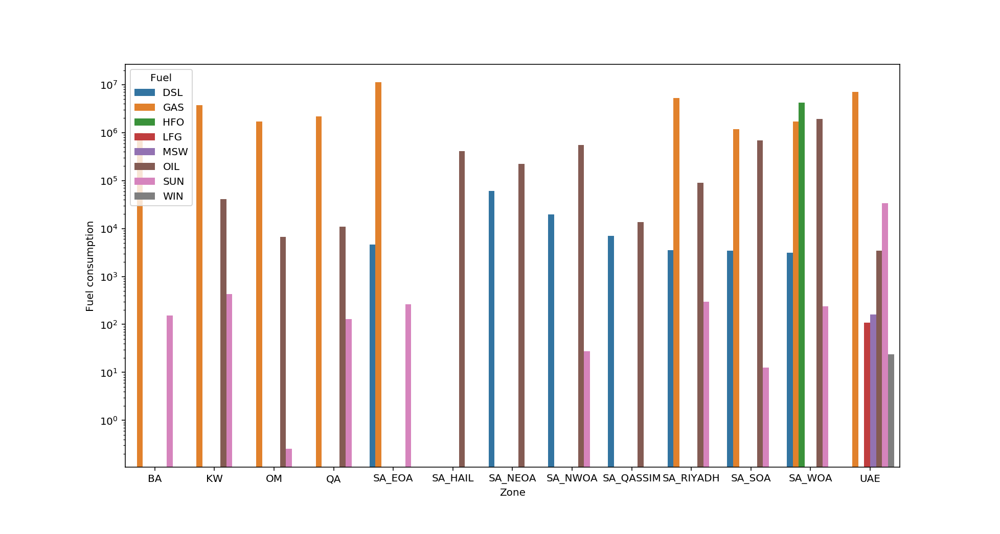

In [150]:
df = results_int_isolated['NodeFuelConsumption'].T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel consumption']
sns.barplot(data=df, x='Zone', y='Fuel consumption', hue='Fuel').set_yscale('log')

<IPython.core.display.Javascript object>


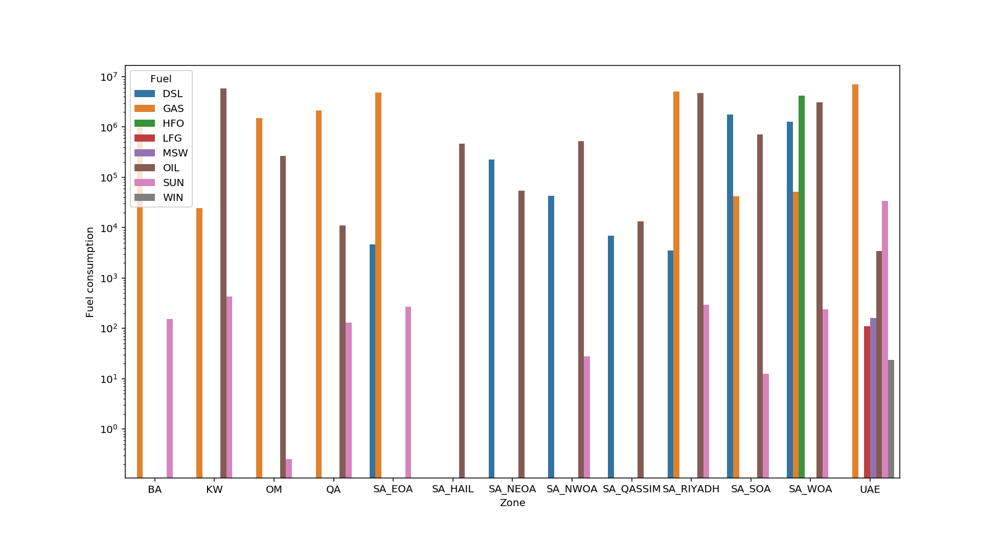

In [149]:
df = results_sub_isolated['NodeFuelConsumption'].T.sort_index().sum(axis=1).reset_index()

df.columns = ['Zone', 'Fuel', 'Fuel consumption']
sns.barplot(data=df, x='Zone', y='Fuel consumption', hue='Fuel').set_yscale('log')

## Compare governments spending on fuel subsidies (Trade vs No Trade)

In [113]:
KSA_DSL =(73.88409558-2.284372129)
KSA_GAS =(30.82197619-2.55713298)
KSA_HFO =(52.60874918-1.466089575)
KSA_OIL =(65.66717494-2.488942768)

OM_DSL =(73.88409558-0.67)
OM_GAS =(30.82197619-3)
OM_HFO =(52.60874918-0.43)
OM_OIL =(65.66717494-0.73)

KW_DSL =(73.88409558-0.67)
KW_GAS =(30.82197619-1.5)
KW_HFO =(52.60874918-0.43)
KW_OIL =(65.66717494-0.73)

UAE_DSL =(73.88409558-0.67)
UAE_GAS =(30.82197619-0.75)
UAE_HFO =(52.60874918-0.43)
UAE_OIL =(65.66717494-0.73)

QA_DSL =(73.88409558-0.67)
QA_GAS =(30.82197619-0.75)
QA_HFO =(52.60874918-0.43)
QA_OIL =(65.66717494-0.73)

BA_DSL =(73.88409558-0.67)
BA_GAS =(30.82197619-2.5)
BA_HFO =(52.60874918-0.43)
BA_OIL =(65.66717494-0.73)


<IPython.core.display.Javascript object>


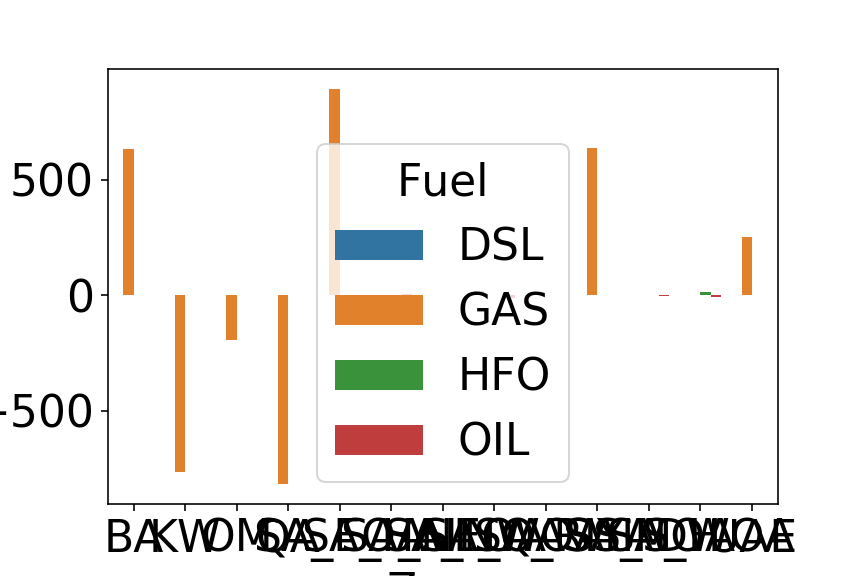

In [115]:

df = results_int['NodeFuelConsumption'].T.sort_index()
df_masked = df[df.index.droplevel(0).isin(['HFO','OIL','GAS','DSL'])].sum(axis=1)
Index1=df_masked.index
list1=[BA_DSL,BA_GAS,BA_HFO,BA_OIL,KW_DSL,KW_GAS,KW_HFO,KW_OIL,OM_DSL, OM_GAS,OM_HFO,OM_OIL,
                QA_DSL, QA_GAS,QA_HFO,QA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,UAE_DSL, UAE_GAS,UAE_HFO,UAE_OIL]

Government_Spendings_int=pd.DataFrame((1/1000000)*np.multiply(np.array(df_masked), np.array(list1)),index=Index1)

df = results_int_isolated['NodeFuelConsumption'].T.sort_index()
df_masked = df[df.index.droplevel(0).isin(['HFO','OIL','GAS','DSL'])].sum(axis=1)
Index1=df_masked.index
list1=[BA_DSL,BA_GAS,BA_HFO,BA_OIL,KW_DSL,KW_GAS,KW_HFO,KW_OIL,OM_DSL, OM_GAS,OM_HFO,OM_OIL,
                QA_DSL, QA_GAS,QA_HFO,QA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,UAE_DSL, UAE_GAS,UAE_HFO,UAE_OIL]

Government_Spendings_int_isolated=pd.DataFrame((1/1000000)*np.multiply(np.array(df_masked), np.array(list1)),index=Index1)

Government_Spendings_reduction=Government_Spendings_int_isolated-Government_Spendings_int
df = Government_Spendings_reduction.reset_index()
df.columns = ['Zone', 'Fuel', 'Government Spendings reduction(M$)']
sns.barplot(data=df, x='Zone', y='Government Spendings reduction(M$)', hue='Fuel')

<IPython.core.display.Javascript object>


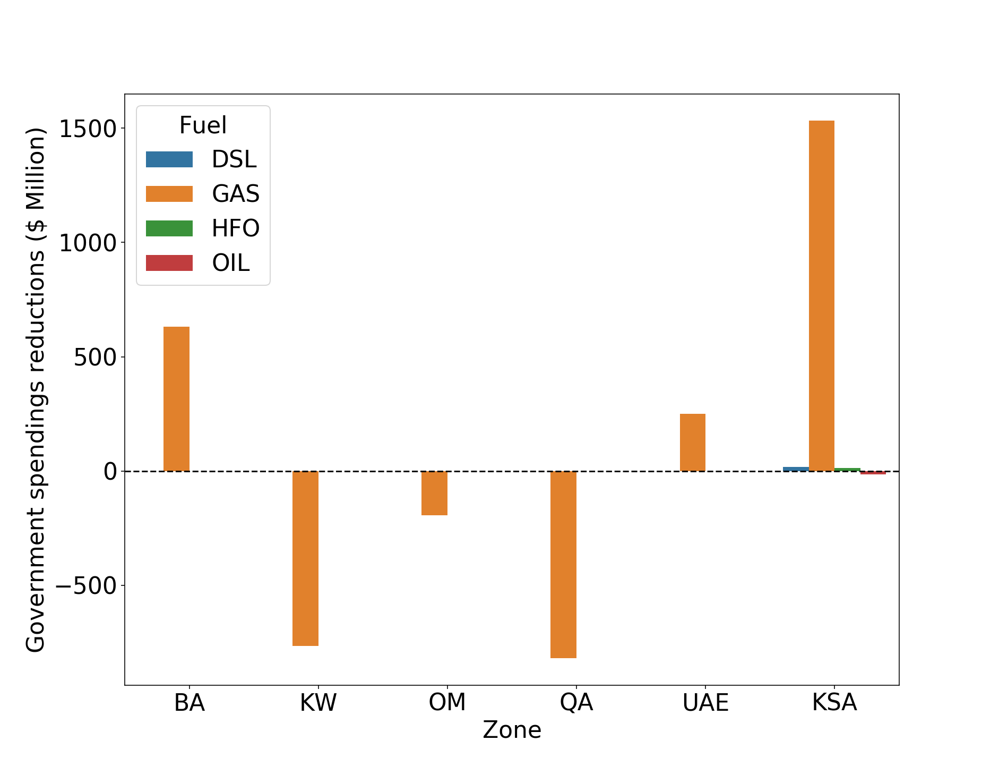

In [118]:
df = results_int['NodeFuelConsumption'].T.sort_index()
df_masked = df[df.index.droplevel(0).isin(['HFO','OIL','GAS','DSL'])].sum(axis=1)
Index1=df_masked.index
list1=[BA_DSL,BA_GAS,BA_HFO,BA_OIL,KW_DSL,KW_GAS,KW_HFO,KW_OIL,OM_DSL, OM_GAS,OM_HFO,OM_OIL,
                QA_DSL, QA_GAS,QA_HFO,QA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,UAE_DSL, UAE_GAS,UAE_HFO,UAE_OIL]
Government_Spendings_int=pd.DataFrame((1/1000000)*np.multiply(np.array(df_masked), np.array(list1)),index=Index1)

df = results_int_isolated['NodeFuelConsumption'].T.sort_index()
df_masked = df[df.index.droplevel(0).isin(['HFO','OIL','GAS','DSL'])].sum(axis=1)
Index1=df_masked.index
list1=[BA_DSL,BA_GAS,BA_HFO,BA_OIL,KW_DSL,KW_GAS,KW_HFO,KW_OIL,OM_DSL, OM_GAS,OM_HFO,OM_OIL,
                QA_DSL, QA_GAS,QA_HFO,QA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,UAE_DSL, UAE_GAS,UAE_HFO,UAE_OIL]
Government_Spendings_int_isolated=pd.DataFrame((1/1000000)*np.multiply(np.array(df_masked), np.array(list1)),index=Index1)


Government_Spendings_reduction=Government_Spendings_int_isolated-Government_Spendings_int

df=Government_Spendings_reduction[0].copy()
KSA = df['SA_EOA']+df['SA_HAIL']+df['SA_NEOA']+df['SA_NWOA']+df['SA_QASSIM']+df['SA_RIYADH']+df['SA_SOA']+df['SA_WOA']

df['KSA','DSL'] = KSA['DSL']
df['KSA','GAS'] = KSA['GAS']
df['KSA','HFO'] = KSA['HFO']
df['KSA','OIL'] = KSA['OIL']
df = df.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])
df = df.reset_index()
df.columns = ['Zone', 'Fuel', 'Government spendings reductions ($ Million)']

sns.barplot(data=df, x='Zone', y='Government spendings reductions ($ Million)', hue='Fuel').axhline(0, ls='--',color='k')


<IPython.core.display.Javascript object>


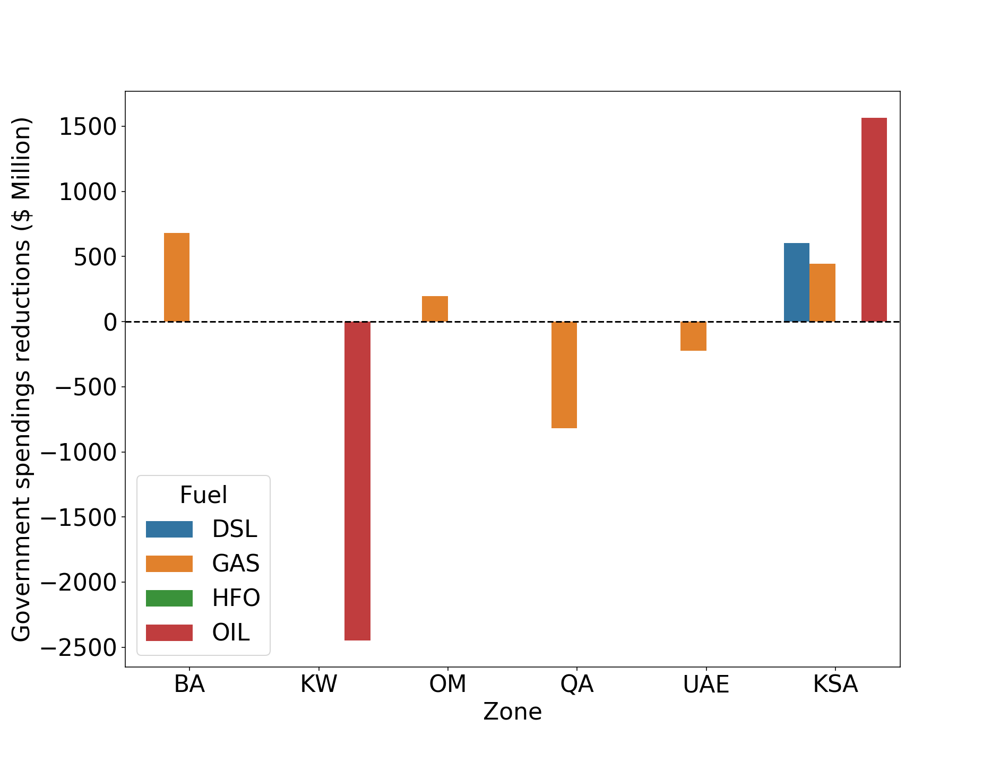

In [119]:
df = results_sub['NodeFuelConsumption'].T.sort_index()
df_masked = df[df.index.droplevel(0).isin(['HFO','OIL','GAS','DSL'])].sum(axis=1)
Index1=df_masked.index
list1=[BA_DSL,BA_GAS,BA_HFO,BA_OIL,KW_DSL,KW_GAS,KW_HFO,KW_OIL,OM_DSL, OM_GAS,OM_HFO,OM_OIL,
                QA_DSL, QA_GAS,QA_HFO,QA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,UAE_DSL, UAE_GAS,UAE_HFO,UAE_OIL]
Government_Spendings_int=pd.DataFrame((1/1000000)*np.multiply(np.array(df_masked), np.array(list1)),index=Index1)

df = results_sub_isolated['NodeFuelConsumption'].T.sort_index()
df_masked = df[df.index.droplevel(0).isin(['HFO','OIL','GAS','DSL'])].sum(axis=1)
Index1=df_masked.index
list1=[BA_DSL,BA_GAS,BA_HFO,BA_OIL,KW_DSL,KW_GAS,KW_HFO,KW_OIL,OM_DSL, OM_GAS,OM_HFO,OM_OIL,
                QA_DSL, QA_GAS,QA_HFO,QA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,UAE_DSL, UAE_GAS,UAE_HFO,UAE_OIL]
Government_Spendings_int_isolated=pd.DataFrame((1/1000000)*np.multiply(np.array(df_masked), np.array(list1)),index=Index1)


Government_Spendings_reduction=Government_Spendings_int_isolated-Government_Spendings_int

df=Government_Spendings_reduction[0].copy()
KSA = df['SA_EOA']+df['SA_HAIL']+df['SA_NEOA']+df['SA_NWOA']+df['SA_QASSIM']+df['SA_RIYADH']+df['SA_SOA']+df['SA_WOA']

df['KSA','DSL'] = KSA['DSL']
df['KSA','GAS'] = KSA['GAS']
df['KSA','HFO'] = KSA['HFO']
df['KSA','OIL'] = KSA['OIL']
df = df.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'])
df = df.reset_index()
df.columns = ['Zone', 'Fuel', 'Government spendings reductions ($ Million)']

sns.barplot(data=df, x='Zone', y='Government spendings reductions ($ Million)', hue='Fuel').axhline(0, ls='--',color='k')


<IPython.core.display.Javascript object>


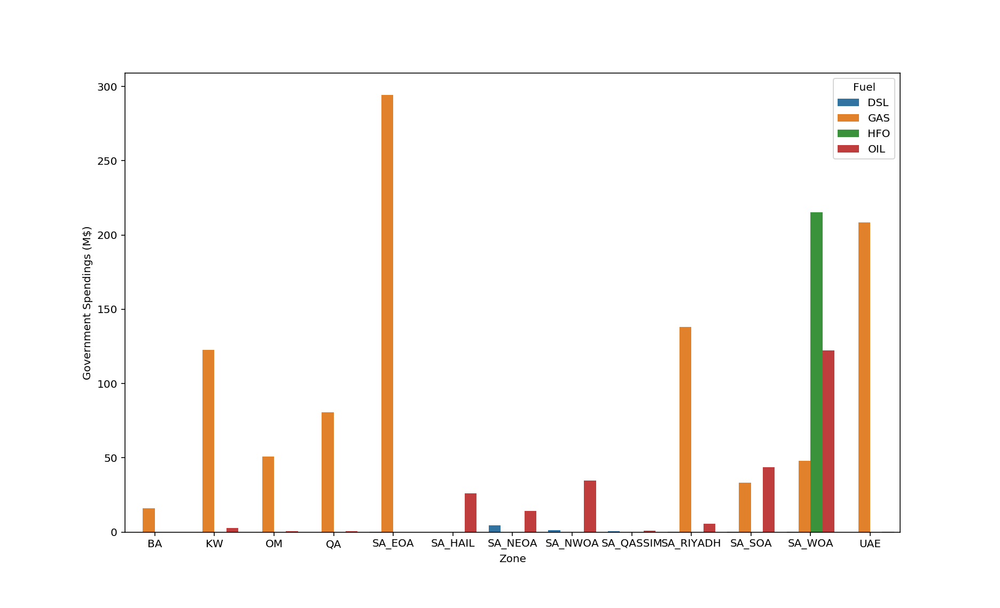

In [414]:
#results_int['NodeFuelConsumption']
df = results_int['NodeFuelConsumption'].T.sort_index()
df_masked = df[df.index.droplevel(0).isin(['HFO','OIL','GAS','DSL'])].sum(axis=1)
Index1=df_masked.index
list1=[BA_DSL,BA_GAS,BA_HFO,BA_OIL,KW_DSL,KW_GAS,KW_HFO,KW_OIL,OM_DSL, OM_GAS,OM_HFO,OM_OIL,
                QA_DSL, QA_GAS,QA_HFO,QA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,UAE_DSL, UAE_GAS,UAE_HFO,UAE_OIL]
'''
df_masked.mul([BA_DSL, BA_GAS,BA_HFO,BA_OIL,KW_DSL,KW_GAS,KW_HFO,KW_OIL,OM_DSL, OM_GAS,OM_HFO,OM_OIL,
                QA_DSL, QA_GAS,QA_HFO,QA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,
                KSA_DSL, KSA_GAS,KSA_HFO,KSA_OIL,UAE_DSL, UAE_GAS,UAE_HFO,UAE_OIL], axis=0)
'''
#np.array(df_masked)*np.array(list1)
#np.multiply(np.array(df_masked), np.array(list1))
df_masked=pd.DataFrame((1/1000000)*np.multiply(np.array(df_masked), np.array(list1)),index=Index1)
#df_masked=pd.DataFrame(np.multiply(np.array(df_masked), np.array(list1)))
#df_masked.columns = ['Zone', 'Fuel', 'Government spendings ($)']
#df.columns = ['Zone', 'Fuel', 'Government spendings ($)']
#sns.barplot(data=df_masked, x='Zone', y='Government spendings ($)', hue='Fuel')

df = df_masked.reset_index()
df.columns = ['Zone', 'Fuel', 'Government Spendings (M$)']
sns.barplot(data=df, x='Zone', y='Government Spendings (M$)', hue='Fuel')

KW -> SA_EOA              19.642857
SA_HAIL -> SA_NEOA        74.404762
SA_QASSIM -> SA_HAIL       1.190476
SA_RIYADH -> SA_QASSIM    19.642857
SA_WOA -> SA_QASSIM       10.714286
dtype: float64

## Compare transmission congestion of GCCIA interconnector (Int vs subsidized prices)

In [120]:
(results_sub['LineCongestion'].sum()/len(datain_sub['Demand']['DA']))*100

BA -> KW                    1.912568
BA -> QA                    1.912568
BA -> SA_EOA                1.912568
BA -> UAE                   1.912568
KW -> BA                    1.912568
KW -> QA                    1.912568
KW -> SA_EOA               39.014117
KW -> UAE                   1.912568
OM -> UAE                   1.912568
QA -> BA                    1.912568
QA -> KW                    1.912568
QA -> SA_EOA                1.912568
QA -> UAE                   1.912568
SA_EOA -> BA                1.912568
SA_EOA -> KW                1.912568
SA_EOA -> QA                1.912568
SA_EOA -> SA_RIYADH         1.912568
SA_EOA -> UAE               1.912568
SA_HAIL -> SA_NEOA         38.399362
SA_HAIL -> SA_QASSIM        1.912568
SA_NEOA -> SA_HAIL          1.912568
SA_QASSIM -> SA_HAIL        3.005464
SA_QASSIM -> SA_RIYADH      1.912568
SA_QASSIM -> SA_WOA         1.912568
SA_RIYADH -> SA_EOA         1.912568
SA_RIYADH -> SA_QASSIM     22.028689
SA_SOA -> SA_WOA            1.912568
S

In [121]:
(results_sub['LineCongestion_BA_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

69.4672131147541

In [122]:
(results_sub['LineCongestion_Ghunan_Alfadhili'].sum()/len(datain_sub['Demand']['DA']))*100

3.8023679417122045

In [123]:
(results_sub['LineCongestion_Ghunan_Salwa'].sum()/len(datain_sub['Demand']['DA']))*100

100.0

In [124]:
(results_sub['LineCongestion_KSA_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

20.787795992714024

In [125]:
(results_sub['LineCongestion_KW_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

80.40755919854281

In [126]:
(results_sub['LineCongestion_OM_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

1.912568306010929

In [127]:
(results_sub['LineCongestion_QA_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

100.0

In [128]:
(results_sub['LineCongestion_UAE_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

1.912568306010929

In [129]:
(results_sub['LineCongestion_UAE_Salwa'].sum()/len(datain_sub['Demand']['DA']))*100

1.912568306010929

<IPython.core.display.Javascript object>


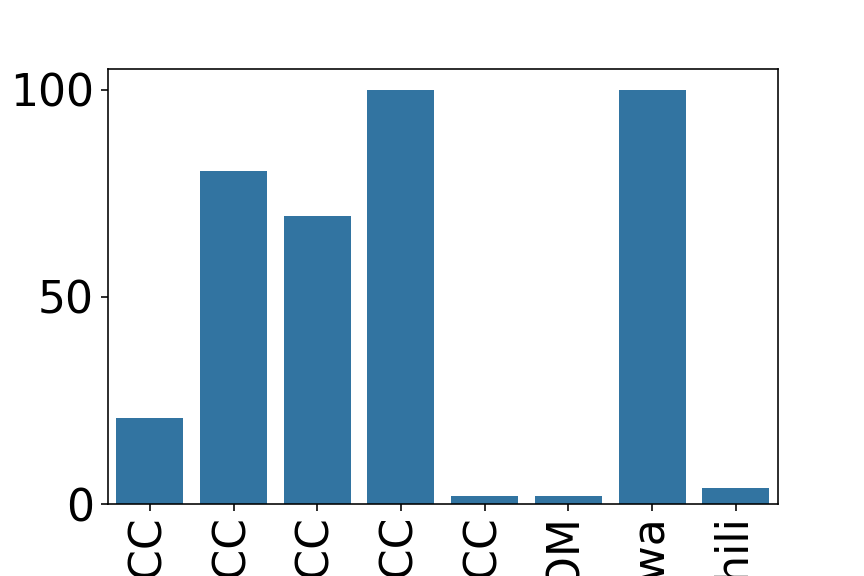

In [175]:
columns=['KSA - GCC','KW - GCC','BA - GCC','QA - GCC','UAE - GCC','UAE - OM','Ghunan - Salwa','Ghunan - Alfadhili']
A_list = []
A_list.append((results_sub['LineCongestion_KSA_GCC'].sum()/len(datain_sub['Demand']['DA']))*100)
A_list.append((results_sub['LineCongestion_KW_GCC'].sum()/len(datain_sub['Demand']['DA']))*100)
A_list.append((results_sub['LineCongestion_BA_GCC'].sum()/len(datain_sub['Demand']['DA']))*100)
A_list.append((results_sub['LineCongestion_QA_GCC'].sum()/len(datain_sub['Demand']['DA']))*100)
A_list.append((results_sub['LineCongestion_UAE_GCC'].sum()/len(datain_sub['Demand']['DA']))*100)
A_list.append((results_sub['LineCongestion_OM_GCC'].sum()/len(datain_sub['Demand']['DA']))*100)
A_list.append((results_sub['LineCongestion_Ghunan_Salwa'].sum()/len(datain_sub['Demand']['DA']))*100)
A_list.append((results_sub['LineCongestion_Ghunan_Alfadhili'].sum()/len(datain_sub['Demand']['DA']))*100)

A = pd.DataFrame([A_list],columns=columns).T.reset_index()
A.columns = ['Line', '% Utilization']
aa = sns.barplot(data=A, x='Line', y='% Utilization',color='#1f77b4')
for item in aa.get_xticklabels():
    item.set_rotation(90)

In [159]:
(results_int['LineCongestion'].sum()/len(datain_int['Demand']['DA']))*100

BA -> KW                    1.912568
BA -> QA                    1.912568
BA -> SA_EOA                1.912568
BA -> UAE                   1.912568
KW -> BA                    1.912568
KW -> QA                    1.912568
KW -> SA_EOA                1.912568
KW -> UAE                   1.912568
OM -> UAE                 100.000000
QA -> BA                    1.992259
QA -> KW                    1.912568
QA -> SA_EOA                1.912568
QA -> UAE                   1.912568
SA_EOA -> BA                1.912568
SA_EOA -> KW                1.912568
SA_EOA -> QA                1.912568
SA_EOA -> SA_RIYADH         2.049180
SA_EOA -> UAE               1.912568
SA_HAIL -> SA_NEOA         50.648907
SA_HAIL -> SA_QASSIM        1.912568
SA_NEOA -> SA_HAIL          1.912568
SA_QASSIM -> SA_HAIL        3.096539
SA_QASSIM -> SA_RIYADH      1.912568
SA_QASSIM -> SA_WOA         1.912568
SA_RIYADH -> SA_EOA         1.912568
SA_RIYADH -> SA_QASSIM     97.984973
SA_SOA -> SA_WOA            1.912568
S

In [161]:
(results_int['LineCongestion_BA_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

1.9922586520947176

In [162]:
(results_int['LineCongestion_Ghunan_Alfadhili'].sum()/len(datain_sub['Demand']['DA']))*100

2.0605646630236794

In [163]:
(results_int['LineCongestion_Ghunan_Salwa'].sum()/len(datain_sub['Demand']['DA']))*100

73.53142076502732

In [167]:
(results_int['LineCongestion_KSA_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

100.0

In [168]:
(results_int['LineCongestion_KW_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

96.84653916211293

In [169]:
(results_int['LineCongestion_OM_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

1.912568306010929

In [170]:
(results_sub['LineCongestion_QA_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

100.0

In [171]:
(results_sub['LineCongestion_UAE_GCC'].sum()/len(datain_sub['Demand']['DA']))*100

1.912568306010929

In [172]:
(results_sub['LineCongestion_UAE_Salwa'].sum()/len(datain_sub['Demand']['DA']))*100

1.912568306010929

<IPython.core.display.Javascript object>


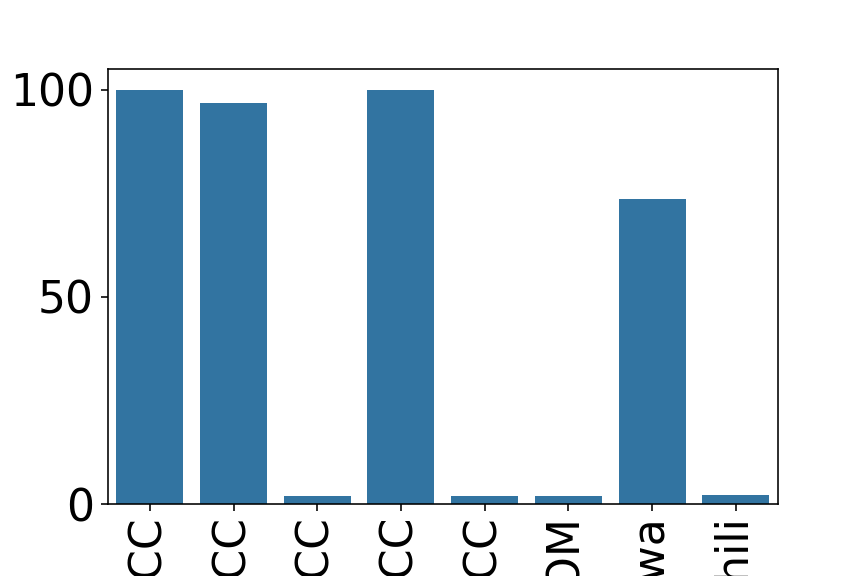

In [174]:
columns=['KSA - GCC','KW - GCC','BA - GCC','QA - GCC','UAE - GCC','UAE - OM','Ghunan - Salwa','Ghunan - Alfadhili']
A_list = []
A_list.append((results_int['LineCongestion_KSA_GCC'].sum()/len(datain_int['Demand']['DA']))*100)
A_list.append((results_int['LineCongestion_KW_GCC'].sum()/len(datain_int['Demand']['DA']))*100)
A_list.append((results_int['LineCongestion_BA_GCC'].sum()/len(datain_int['Demand']['DA']))*100)
A_list.append((results_int['LineCongestion_QA_GCC'].sum()/len(datain_int['Demand']['DA']))*100)
A_list.append((results_int['LineCongestion_UAE_GCC'].sum()/len(datain_int['Demand']['DA']))*100)
A_list.append((results_int['LineCongestion_OM_GCC'].sum()/len(datain_int['Demand']['DA']))*100)
A_list.append((results_int['LineCongestion_Ghunan_Salwa'].sum()/len(datain_int['Demand']['DA']))*100)
A_list.append((results_int['LineCongestion_Ghunan_Alfadhili'].sum()/len(datain_int['Demand']['DA']))*100)

A = pd.DataFrame([A_list],columns=columns).T.reset_index()
A.columns = ['Line', '% Utilization']
aa = sns.barplot(data=A, x='Line', y='% Utilization',color='#1f77b4')
for item in aa.get_xticklabels():
    item.set_rotation(90)

## (int prices)
## Compare operation cost reductions (Trade vs No Trade)
## Accounting for value of exports and imports assuming:
## power export/import cost =  Nodal price of exporting node × Power exported

In [71]:
results_int['TotalNodeOperationCost']

,BA,KW,OM,QA,SA_EOA,SA_HAIL,SA_NEOA,SA_NWOA,SA_QASSIM,SA_RIYADH,SA_SOA,SA_WOA,UAE
2016-07-11 00:00:00,125285.074432,748635.413000,374505.993604,446968.187512,1.586121e+06,182395.211210,92064.760828,221776.214363,20453.837721,866792.889450,462024.827841,1.946975e+06,1.108342e+06
2016-07-11 01:00:00,93743.693080,699995.050773,331145.538222,432449.501861,1.567767e+06,94191.159291,75738.250219,178446.193712,7537.804757,836376.856486,448208.794877,1.951572e+06,1.057216e+06
2016-07-11 02:00:00,92679.895871,684395.683418,325026.307639,426495.324862,1.557388e+06,100382.591078,71879.399391,184213.996124,7537.804757,836376.856486,448208.794877,1.951572e+06,1.026255e+06
2016-07-11 03:00:00,89686.929670,671331.508172,318604.441196,418855.167155,1.523358e+06,14127.669324,67555.560049,184208.350272,7537.804757,836376.856486,448208.794877,1.951572e+06,9.991726e+05
2016-07-11 04:00:00,86676.194028,660191.247752,311353.928944,417979.078853,1.522624e+06,50143.502816,65501.038035,181384.859683,7537.804757,836376.856486,448208.794877,1.951572e+06,9.734380e+05
2016-07-11 05:00:00,82822.594562,647408.581782,293055.544955,413972.212448,1.538909e+06,131453.130139,72682.714609,176499.692135,7537.804757,836376.856486,448208.794877,1.951572e+06,9.491410e+05
2016-07-11 06:00:00,78474.299190,632361.218651,283848.419634,406326.629366,1.468933e+06,5220.079413,63988.320351,155107.304783,7537.804757,836376.856486,440386.495696,1.951572e+06,9.436253e+05
2016-07-11 07:00:00,82572.631137,640829.022761,287764.924142,412082.831289,1.513944e+06,5220.079413,70810.479652,156486.366177,7537.804757,836376.856486,411328.939228,1.951572e+06,9.787362e+05
2016-07-11 08:00:00,88020.348048,666588.435174,294216.139922,424791.080212,1.568588e+06,79741.763892,77365.589619,167873.977153,7537.804757,836376.856486,448208.794877,1.951572e+06,1.036223e+06
2016-07-11 09:00:00,92860.996744,688663.790214,300726.102803,442248.218336,1.643364e+06,175937.194728,87743.987554,179422.181551,7537.804757,836376.856486,448208.794877,1.994521e+06,1.092157e+06


<IPython.core.display.Javascript object>


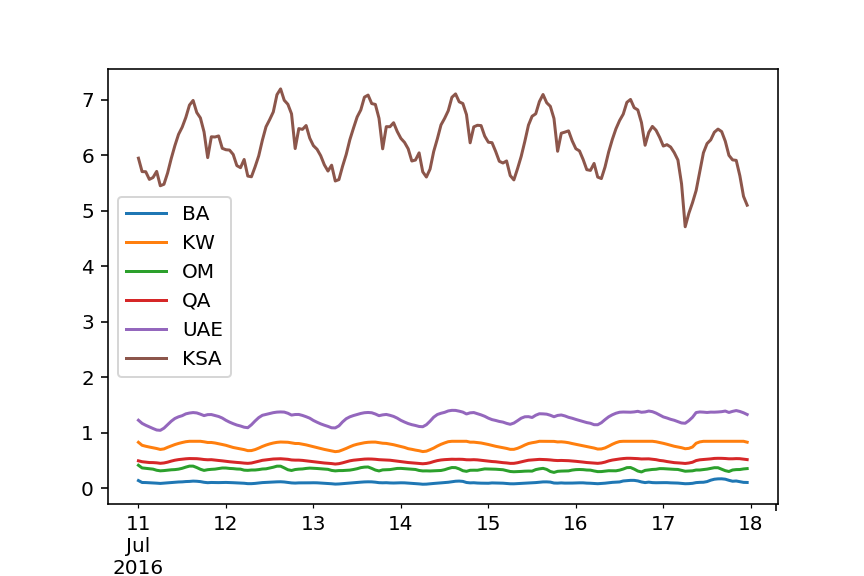

In [73]:
TotalZoneOperationCost = results_int['TotalNodeOperationCost']*(1/1000000)
BBB = pd.DataFrame(TotalZoneOperationCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)
TotalZoneOperationCost['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost.index)
TotalZoneOperationCost.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot()



In [221]:
TotalZoneOperationCost = results_int['TotalNodeOperationCost']*(1/1000000)
BBB = pd.DataFrame(TotalZoneOperationCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)
TotalZoneOperationCost['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost.index)
#TotalZoneOperationCost.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot()

TotalZoneOperationCost_isolated = results_int_isolated['TotalNodeOperationCost']*(1/1000000)
BBB = pd.DataFrame(TotalZoneOperationCost_isolated[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values)
KSA = BBB.sum(axis=1)
TotalZoneOperationCost_isolated['KSA']= pd.Series(KSA.values, index=TotalZoneOperationCost_isolated.index)
#TotalZoneOperationCost_isolated.drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).plot()

TotalZoneOperationCost_diff = (TotalZoneOperationCost_isolated-TotalZoneOperationCost).drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_NWOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).sum()
TotalZoneOperationCost_diff.plot(kind='bar',color='#1f77b4').axhline(0, ls='--',color='k')
TotalZoneOperationCost_diff1=TotalZoneOperationCost_diff.drop(pd.date_range(start='2016-10-14 00:00:00', end='2016-10-20 23:00:00', freq='H'))
plt.title('Operation Cost reductions ($ Million)')

KeyError: "[Timestamp('2016-10-14 00:00:00', freq='H')\n Timestamp('2016-10-14 01:00:00', freq='H')\n Timestamp('2016-10-14 02:00:00', freq='H')\n Timestamp('2016-10-14 03:00:00', freq='H')\n Timestamp('2016-10-14 04:00:00', freq='H')\n Timestamp('2016-10-14 05:00:00', freq='H')\n Timestamp('2016-10-14 06:00:00', freq='H')\n Timestamp('2016-10-14 07:00:00', freq='H')\n Timestamp('2016-10-14 08:00:00', freq='H')\n Timestamp('2016-10-14 09:00:00', freq='H')\n Timestamp('2016-10-14 10:00:00', freq='H')\n Timestamp('2016-10-14 11:00:00', freq='H')\n Timestamp('2016-10-14 12:00:00', freq='H')\n Timestamp('2016-10-14 13:00:00', freq='H')\n Timestamp('2016-10-14 14:00:00', freq='H')\n Timestamp('2016-10-14 15:00:00', freq='H')\n Timestamp('2016-10-14 16:00:00', freq='H')\n Timestamp('2016-10-14 17:00:00', freq='H')\n Timestamp('2016-10-14 18:00:00', freq='H')\n Timestamp('2016-10-14 19:00:00', freq='H')\n Timestamp('2016-10-14 20:00:00', freq='H')\n Timestamp('2016-10-14 21:00:00', freq='H')\n Timestamp('2016-10-14 22:00:00', freq='H')\n Timestamp('2016-10-14 23:00:00', freq='H')\n Timestamp('2016-10-15 00:00:00', freq='H')\n Timestamp('2016-10-15 01:00:00', freq='H')\n Timestamp('2016-10-15 02:00:00', freq='H')\n Timestamp('2016-10-15 03:00:00', freq='H')\n Timestamp('2016-10-15 04:00:00', freq='H')\n Timestamp('2016-10-15 05:00:00', freq='H')\n Timestamp('2016-10-15 06:00:00', freq='H')\n Timestamp('2016-10-15 07:00:00', freq='H')\n Timestamp('2016-10-15 08:00:00', freq='H')\n Timestamp('2016-10-15 09:00:00', freq='H')\n Timestamp('2016-10-15 10:00:00', freq='H')\n Timestamp('2016-10-15 11:00:00', freq='H')\n Timestamp('2016-10-15 12:00:00', freq='H')\n Timestamp('2016-10-15 13:00:00', freq='H')\n Timestamp('2016-10-15 14:00:00', freq='H')\n Timestamp('2016-10-15 15:00:00', freq='H')\n Timestamp('2016-10-15 16:00:00', freq='H')\n Timestamp('2016-10-15 17:00:00', freq='H')\n Timestamp('2016-10-15 18:00:00', freq='H')\n Timestamp('2016-10-15 19:00:00', freq='H')\n Timestamp('2016-10-15 20:00:00', freq='H')\n Timestamp('2016-10-15 21:00:00', freq='H')\n Timestamp('2016-10-15 22:00:00', freq='H')\n Timestamp('2016-10-15 23:00:00', freq='H')\n Timestamp('2016-10-16 00:00:00', freq='H')\n Timestamp('2016-10-16 01:00:00', freq='H')\n Timestamp('2016-10-16 02:00:00', freq='H')\n Timestamp('2016-10-16 03:00:00', freq='H')\n Timestamp('2016-10-16 04:00:00', freq='H')\n Timestamp('2016-10-16 05:00:00', freq='H')\n Timestamp('2016-10-16 06:00:00', freq='H')\n Timestamp('2016-10-16 07:00:00', freq='H')\n Timestamp('2016-10-16 08:00:00', freq='H')\n Timestamp('2016-10-16 09:00:00', freq='H')\n Timestamp('2016-10-16 10:00:00', freq='H')\n Timestamp('2016-10-16 11:00:00', freq='H')\n Timestamp('2016-10-16 12:00:00', freq='H')\n Timestamp('2016-10-16 13:00:00', freq='H')\n Timestamp('2016-10-16 14:00:00', freq='H')\n Timestamp('2016-10-16 15:00:00', freq='H')\n Timestamp('2016-10-16 16:00:00', freq='H')\n Timestamp('2016-10-16 17:00:00', freq='H')\n Timestamp('2016-10-16 18:00:00', freq='H')\n Timestamp('2016-10-16 19:00:00', freq='H')\n Timestamp('2016-10-16 20:00:00', freq='H')\n Timestamp('2016-10-16 21:00:00', freq='H')\n Timestamp('2016-10-16 22:00:00', freq='H')\n Timestamp('2016-10-16 23:00:00', freq='H')\n Timestamp('2016-10-17 00:00:00', freq='H')\n Timestamp('2016-10-17 01:00:00', freq='H')\n Timestamp('2016-10-17 02:00:00', freq='H')\n Timestamp('2016-10-17 03:00:00', freq='H')\n Timestamp('2016-10-17 04:00:00', freq='H')\n Timestamp('2016-10-17 05:00:00', freq='H')\n Timestamp('2016-10-17 06:00:00', freq='H')\n Timestamp('2016-10-17 07:00:00', freq='H')\n Timestamp('2016-10-17 08:00:00', freq='H')\n Timestamp('2016-10-17 09:00:00', freq='H')\n Timestamp('2016-10-17 10:00:00', freq='H')\n Timestamp('2016-10-17 11:00:00', freq='H')\n Timestamp('2016-10-17 12:00:00', freq='H')\n Timestamp('2016-10-17 13:00:00', freq='H')\n Timestamp('2016-10-17 14:00:00', freq='H')\n Timestamp('2016-10-17 15:00:00', freq='H')\n Timestamp('2016-10-17 16:00:00', freq='H')\n Timestamp('2016-10-17 17:00:00', freq='H')\n Timestamp('2016-10-17 18:00:00', freq='H')\n Timestamp('2016-10-17 19:00:00', freq='H')\n Timestamp('2016-10-17 20:00:00', freq='H')\n Timestamp('2016-10-17 21:00:00', freq='H')\n Timestamp('2016-10-17 22:00:00', freq='H')\n Timestamp('2016-10-17 23:00:00', freq='H')\n Timestamp('2016-10-18 00:00:00', freq='H')\n Timestamp('2016-10-18 01:00:00', freq='H')\n Timestamp('2016-10-18 02:00:00', freq='H')\n Timestamp('2016-10-18 03:00:00', freq='H')\n Timestamp('2016-10-18 04:00:00', freq='H')\n Timestamp('2016-10-18 05:00:00', freq='H')\n Timestamp('2016-10-18 06:00:00', freq='H')\n Timestamp('2016-10-18 07:00:00', freq='H')\n Timestamp('2016-10-18 08:00:00', freq='H')\n Timestamp('2016-10-18 09:00:00', freq='H')\n Timestamp('2016-10-18 10:00:00', freq='H')\n Timestamp('2016-10-18 11:00:00', freq='H')\n Timestamp('2016-10-18 12:00:00', freq='H')\n Timestamp('2016-10-18 13:00:00', freq='H')\n Timestamp('2016-10-18 14:00:00', freq='H')\n Timestamp('2016-10-18 15:00:00', freq='H')\n Timestamp('2016-10-18 16:00:00', freq='H')\n Timestamp('2016-10-18 17:00:00', freq='H')\n Timestamp('2016-10-18 18:00:00', freq='H')\n Timestamp('2016-10-18 19:00:00', freq='H')\n Timestamp('2016-10-18 20:00:00', freq='H')\n Timestamp('2016-10-18 21:00:00', freq='H')\n Timestamp('2016-10-18 22:00:00', freq='H')\n Timestamp('2016-10-18 23:00:00', freq='H')\n Timestamp('2016-10-19 00:00:00', freq='H')\n Timestamp('2016-10-19 01:00:00', freq='H')\n Timestamp('2016-10-19 02:00:00', freq='H')\n Timestamp('2016-10-19 03:00:00', freq='H')\n Timestamp('2016-10-19 04:00:00', freq='H')\n Timestamp('2016-10-19 05:00:00', freq='H')\n Timestamp('2016-10-19 06:00:00', freq='H')\n Timestamp('2016-10-19 07:00:00', freq='H')\n Timestamp('2016-10-19 08:00:00', freq='H')\n Timestamp('2016-10-19 09:00:00', freq='H')\n Timestamp('2016-10-19 10:00:00', freq='H')\n Timestamp('2016-10-19 11:00:00', freq='H')\n Timestamp('2016-10-19 12:00:00', freq='H')\n Timestamp('2016-10-19 13:00:00', freq='H')\n Timestamp('2016-10-19 14:00:00', freq='H')\n Timestamp('2016-10-19 15:00:00', freq='H')\n Timestamp('2016-10-19 16:00:00', freq='H')\n Timestamp('2016-10-19 17:00:00', freq='H')\n Timestamp('2016-10-19 18:00:00', freq='H')\n Timestamp('2016-10-19 19:00:00', freq='H')\n Timestamp('2016-10-19 20:00:00', freq='H')\n Timestamp('2016-10-19 21:00:00', freq='H')\n Timestamp('2016-10-19 22:00:00', freq='H')\n Timestamp('2016-10-19 23:00:00', freq='H')\n Timestamp('2016-10-20 00:00:00', freq='H')\n Timestamp('2016-10-20 01:00:00', freq='H')\n Timestamp('2016-10-20 02:00:00', freq='H')\n Timestamp('2016-10-20 03:00:00', freq='H')\n Timestamp('2016-10-20 04:00:00', freq='H')\n Timestamp('2016-10-20 05:00:00', freq='H')\n Timestamp('2016-10-20 06:00:00', freq='H')\n Timestamp('2016-10-20 07:00:00', freq='H')\n Timestamp('2016-10-20 08:00:00', freq='H')\n Timestamp('2016-10-20 09:00:00', freq='H')\n Timestamp('2016-10-20 10:00:00', freq='H')\n Timestamp('2016-10-20 11:00:00', freq='H')\n Timestamp('2016-10-20 12:00:00', freq='H')\n Timestamp('2016-10-20 13:00:00', freq='H')\n Timestamp('2016-10-20 14:00:00', freq='H')\n Timestamp('2016-10-20 15:00:00', freq='H')\n Timestamp('2016-10-20 16:00:00', freq='H')\n Timestamp('2016-10-20 17:00:00', freq='H')\n Timestamp('2016-10-20 18:00:00', freq='H')\n Timestamp('2016-10-20 19:00:00', freq='H')\n Timestamp('2016-10-20 20:00:00', freq='H')\n Timestamp('2016-10-20 21:00:00', freq='H')\n Timestamp('2016-10-20 22:00:00', freq='H')\n Timestamp('2016-10-20 23:00:00', freq='H')] not found in axis"

In [82]:
TotalZoneOperationCost_diff

BA     13.181925
KW    -14.923296
OM     -4.121042
QA    -16.048845
UAE     4.384355
KSA    32.499050
dtype: float64

In [220]:
ZoneImportCost = results_int['NodeImportValue']*(1/1000000)
# IMPORTANT: inlclude 'SA_NWOA' below
BBB = pd.DataFrame(ZoneImportCost[['SA_EOA', 'SA_HAIL','SA_NEOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA']].values) 
KSA = BBB.sum(axis=1)
ZoneImportCost['KSA']= pd.Series(KSA.values, index=ZoneImportCost.index)
ZoneImportCost.drop(pd.date_range(start='2016-10-14 00:00:00', end='2016-10-20 23:00:00', freq='H')).drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1).sum().plot(kind='bar',color='#1f77b4')
ZoneImportCost1=ZoneImportCost.drop(pd.date_range(start='2016-10-14 00:00:00', end='2016-10-20 23:00:00', freq='H')).drop(['SA_EOA', 'SA_HAIL','SA_NEOA','SA_QASSIM','SA_RIYADH','SA_SOA','SA_WOA'],axis=1)
plt.title('Imports value ($ Million)')

Text(0.5,1,'Imports value ($ Million)')

In [102]:
ZoneImportCost.head(5)

,BA,KW,SA_EOA,SA_HAIL,SA_NEOA,SA_QASSIM,SA_RIYADH,SA_SOA,SA_WOA,UAE,KSA
2016-07-11 00:00:00,0.081554,0.0,0.107876,0.194722,0.187046,0.353692,0.485379,0.405162,0.055938,0.104137,1.789815
2016-07-11 01:00:00,0.079607,0.0,0.107876,0.280621,0.184815,0.381507,0.472257,0.409365,0.000000,0.024530,1.836441
2016-07-11 02:00:00,0.079607,0.0,0.107876,0.271258,0.184815,0.366346,0.457433,0.428476,0.000000,0.024530,1.816204
2016-07-11 03:00:00,0.079607,0.0,0.107876,0.363835,0.184815,0.452242,0.440434,0.390237,0.000000,0.024530,1.939439
2016-07-11 04:00:00,0.079607,0.0,0.107876,0.322636,0.184815,0.407894,0.432410,0.416799,0.000000,0.024530,1.872430


<IPython.core.display.Javascript object>


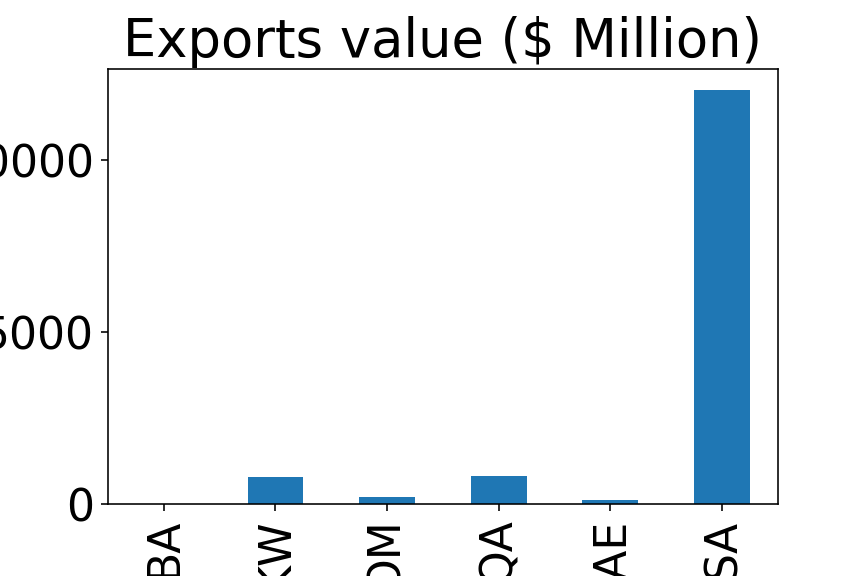

Text(0.5,1,'Exports value ($ Million)')

In [203]:
ZoneExportCost = results_int['NodeExportValue']*(1/1000000)
# IMPORTANT: inlclude 'SA_NWOA' 'SA_NEOA' 'SA_SOA' below
BBB = pd.DataFrame(ZoneExportCost[['SA_EOA', 'SA_HAIL','SA_QASSIM','SA_RIYADH','SA_WOA','SA_NEOA','SA_SOA']].values) 
KSA = BBB.sum(axis=1)
ZoneExportCost['KSA']= pd.Series(KSA.values, index=ZoneExportCost.index)
ZoneExportCost.drop(pd.date_range(start='2016-10-14 00:00:00', end='2016-10-20 23:00:00', freq='H')).drop(['SA_EOA', 'SA_HAIL','SA_QASSIM','SA_RIYADH','SA_WOA','SA_NEOA','SA_SOA'],axis=1).sum().plot(kind='bar',color='#1f77b4')
ZoneExportCost1=ZoneExportCost.drop(pd.date_range(start='2016-10-14 00:00:00', end='2016-10-20 23:00:00', freq='H')).drop(['SA_EOA', 'SA_HAIL','SA_QASSIM','SA_RIYADH','SA_WOA','SA_NEOA','SA_SOA'],axis=1)
plt.title('Exports value ($ Million)')

In [103]:
ZoneExportCost.head(5)

,BA,KW,OM,QA,SA_EOA,SA_HAIL,SA_QASSIM,SA_RIYADH,SA_WOA,UAE,KSA
2016-07-11 00:00:00,0.0,0.091955,0.02453,0.095529,0.485379,0.187046,0.250660,0.353692,0.405162,0.081554,1.681938
2016-07-11 01:00:00,0.0,0.091955,0.02453,0.095529,0.472257,0.184815,0.280621,0.353692,0.437180,0.000000,1.728564
2016-07-11 02:00:00,0.0,0.091955,0.02453,0.095529,0.457433,0.184815,0.271258,0.353692,0.441129,0.000000,1.708327
2016-07-11 03:00:00,0.0,0.091955,0.02453,0.095529,0.440434,0.184815,0.363835,0.353692,0.488786,0.000000,1.831562
2016-07-11 04:00:00,0.0,0.091955,0.02453,0.095529,0.432410,0.184815,0.322636,0.353692,0.471000,0.000000,1.764553


<IPython.core.display.Javascript object>


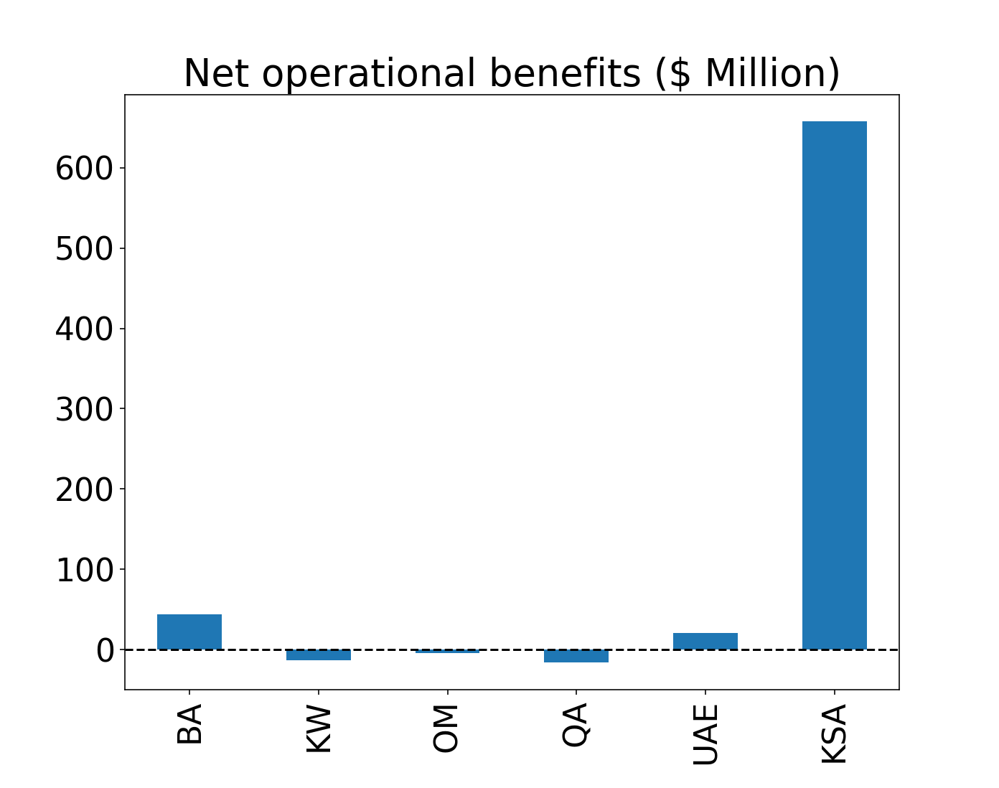

Text(0.5,1,'Net operational benefits ($ Million)')

In [230]:
(TotalZoneOperationCost_diff+ZoneExportCost1.sum()-ZoneImportCost1.sum()).plot(kind='bar',color='#1f77b4').axhline(0, ls='--',color='k')
plt.title('Net operational benefits ($ Million)')

In [ ]:
ZoneExportCost1.sum().plot(kind='bar',color='#1f77b4')

In [218]:
TotalZoneOperationCost_diff

BA      687.640100
KW     -803.189815
OM     -215.471615
QA     -839.125307
UAE     256.018646
KSA    1603.217701
dtype: float64